# Muti-task Rodent TBI segmentation
## Skull-stripping and ROI Segmentation
Author: Marcello De Salvo <br>

# Table of contents<font><a class='anchor' id='top'></a>
1. [Importing Libraries](#lib)
2. [Problem Definition](#problem)
3. [Data Description](#data)
4. [Configuration](#conf)
5. [Data Visualization](#visual)
6. [Evaluation metrics](#metrics)  
7. [Data Loader](#load)
8. [Model](#model)
9. [Results](#results)
10. [Evaluation](#eval)

# 1. Libraries <a class='anchor' id='lib'></a> [↑](#top)

In [1]:
import os
import importlib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.patches as mpatches
from skimage import data
from skimage.util import montage 
import skimage.transform as skTrans
from skimage.transform import rotate
from skimage.transform import resize as resz
from PIL import Image, ImageOps
import time

# neural imaging
import nilearn as nl
import nibabel as nib
import nilearn.plotting as nlplt

import evaluation.inference
importlib.reload(evaluation.inference)
from evaluation.inference import FullVolumeEvaluation
from evaluation.postprocessing import ipsi_contra_division_callback, morphology_refinement_callback

# tensorflow
import tensorflow as tf
from tensorflow.keras import backend as K
from tensorflow.keras.callbacks import CSVLogger, ModelCheckpoint, ReduceLROnPlateau, EarlyStopping, TensorBoard
from tensorflow.keras.models import *
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import Nadam, Adam
from tensorflow.keras.layers.experimental import preprocessing
from tensorflow.keras.utils import plot_model

# sklearn
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

import seaborn as sns
sns.set_theme(style="whitegrid")

# Make numpy printouts easier to read.
np.set_printoptions(precision=3, suppress=True)
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))
print(tf.__version__)

# Import mixed precision
from tensorflow.keras import mixed_precision
mixed_precision.set_global_policy('float32')


Num GPUs Available:  1
2.10.0


# 2. Problem definiton<a class='anchor' id='problem'></a> [↑](#top)
Problem: Skull-stripping and ROI semantic segmentation<br>
Each pixel in the image has to be assigned one of the following labels: <br>
- Background (label 0)
- Lesion (red, label 1)
- Ventricle contra (blue, label 3)
- Ventricle ipsi (light green, label 13)
- Third Ventricle (purple, label 21)

# 3. Image data descriptions <a class='anchor' id='data'></a> [↑](#top)

All multimodal scans are available as  NIfTI files (.nii.gz), a commonly used medical imaging format to store brain imagin data obtained using MRI and describe different MRI settings 
1. **T1w (Flash)**
2. **T2w (Rare)**

Data were acquired directly in this institute.
All the imaging datasets have been segmented manually.

# 4. Configuration <a class='anchor' id='conf'></a> [↑](#top)

In [2]:
# PRE PROCESSING
import time
# All labels [0,1,2,3,4,5,10,11,12,13,14,15,16]
# Labels currently used [0,1,12,13,14]
config ={
    'k': 5,
    'dataset_path': '..\dataset_roi',
    'input_shape': (80,80,80),
    'target_resolution': (0.1,0.1,0.1),
    'labels': [0,1,3,13,21], # 0: background, 1: lesion, 3: contra-ventricle, 13: ipsi-ventricle, 21: third ventricle
    'mapping': {0:0, 1:1, 3:2, 13:2, 21:3}, # 0: background, 1: ventricles, 2: cortex, 3: hippocampus -> 4 classes
    'num_classes': 4, # 4 classes
    'in_channels': 1,
    'batch_size': 8,
    'epochs': 100,
    'lr': 1e-3,
    'model_name': "multi_task_k_fold" + "_ep" + str(500) + time.strftime("_%d-%m-%Y_%H-%M"),
    'validation_split': 0.2,
    'test_split': 0.1,
    'augment': True,
    'mice_sampling_rate': 3,
    'rats_sampling_rate': 0,
}

### Custom Losses
The term "smooth" is typically a small positive value that is added to the numerator and denominator of the Dice coefficient formula. Its purpose is to prevent division by zero.<br>
I'll use the **Soft Dice Loss** as explained here: https://www.jeremyjordan.me/semantic-segmentation/

In [3]:
from evaluation.metrics import *
from evaluation.losses import *

metrics = [accuracy_coefficient(), precision_coefficient(), sensitivity_coefficient(), specificity_coefficient(), dice_coefficient(), iou_coefficient(), volume_similarity_coefficient()]

# append to metric a class_dice_coef for each class
for i in range(config['num_classes']):
    metrics.append(dice_coefficient(class_index=i, exclude_background=False))

# 7. Data Loader <a class='anchor' id='load'></a> [↑](#top)
Loading all data into memory is not a good idea since the data are too big to fit in.<br>
So we will create a DataGenerators class to load data on the fly as explained [here](https://stanford.edu/~shervine/blog/keras-how-to-generate-data-on-the-fly)

In [4]:
from utils.loader import *

# Main Dataset
rodent_dataset = RodentDatasets(labels=config['labels'])

# Add all datasets
rodent_dataset.add_dataset(config['dataset_path'], 'T1w-C52-FLASH', sub_folder='Anat')
rodent_dataset.add_dataset(config['dataset_path'], 'T1w-CD1-FLASH', sub_folder='Anat')
rodent_dataset.add_dataset(config['dataset_path'], 'T2w-C52-RARE', sub_folder='Anat')

# Split data
train_and_test_ids = rodent_dataset.get_subjects_list()
print('Size of the dataset: ', len(train_and_test_ids))

Added 71 subjects from T1w-C52-FLASH
Added 15 subjects from T1w-CD1-FLASH
Added 26 subjects from T2w-C52-RARE
Size of the dataset:  112


In [5]:
# Loading manually the rats of different time points
rats_dataset = RodentDatasets(labels=config['labels'])
rats_dataset.add_dataset(config['dataset_path'], 'T2w-RATS', sub_folder='Anat')

# Extract ids   
rats_ids = rats_dataset.get_subjects_list()

# Extract unique subjects by checking the first 4 characters of the second element of the tuple (e.g. RAT1_5w -> RAT1)
id_char_length = 4
rats_unique_ids = list(set([x[1][:id_char_length] for x in rats_ids]))

# Print
print('---- ')
print('Unique rats ids: ', rats_unique_ids)

# Shuffle the unique rats ids
np.random.shuffle(rats_unique_ids)

Added 20 subjects from T2w-RATS
---- 
Unique rats ids:  ['RAT5', 'RAT2', 'RAT1', 'RAT3', 'RAT4']


In [6]:
import importlib
import preprocessing.preprocessor
importlib.reload(preprocessing.preprocessor)
from preprocessing.preprocessor import Preprocessor, Resample, Reorient, Normalize, CorrectX10, MapLabels, RandomCropping, RandomAffine, GaussianBlur, Noise, Flip, Padder
from preprocessing.generator import MultiTaskGenerator

# ref image for reorientation
ref_img = nib.load(os.path.join('../example', 'RARE', 'TBI_fm_19_49', 'Anat', 'TBI_fm_19_49_N4.nii.gz'))

augmented = Preprocessor([
    MapLabels(config['labels'], mapping=config['mapping']),
    CorrectX10(),
    Reorient(ref_img),
    RandomAffine(rotation_range=[-5,5], scale_range=[0.95,1.05], probability=0.3),
    GaussianBlur([0,0.6], probability=0.3),
    Noise([0,0.05], probability=0.3),
    Resample(target_resolution=config['target_resolution'], interpolation=0),
    Normalize(),
    Padder(config['input_shape'], 'constant'),
    RandomCropping(config['input_shape'], mode='center', std=None),
    Flip(axis_list=[0], probability=0.5),
])

preprocessor =  Preprocessor([
    MapLabels(config['labels'], mapping=config['mapping']),
    CorrectX10(),
    Reorient(ref_img),
    Resample(target_resolution=config['target_resolution'], interpolation=0),
    Normalize(),
    Padder(config['input_shape'], 'constant'),
    RandomCropping(config['input_shape'], mode='center', std=None),
    Flip(axis_list=[0], probability=0.5),
])

# 8. Model | 3D U-Net <a class='anchor' id='model'></a> [↑](#top)

In [7]:
import models.networks
importlib.reload(models.networks)
from models.networks import *

# Example usage:
filters = [16, 32, 64, 128, 256]
model = mt_r_net_3d(config['input_shape'], config['in_channels'], config['num_classes'], filters, attention=True, residual=True)
model = standard_unet_3d(config['input_shape'], config['in_channels'], config['num_classes'], filters)

## Overview

In [8]:
# Print summary of the model giving the input shape to function
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 80, 80, 80,  0           []                               
                                 1)]                                                              
                                                                                                  
 conv3d_54 (Conv3D)             (None, 80, 80, 80,   448         ['input_2[0][0]']                
                                16)                                                               
                                                                                                  
 batch_normalization_32 (BatchN  (None, 80, 80, 80,   64         ['conv3d_54[0][0]']              
 ormalization)                  16)                                                         

## Training

In [9]:
roi_loss = diceCELoss(smooth=1e-5, batch_wise=True, gamma=0.8)
skullstrip_loss = diceBCELoss(alpha=0.6, smooth=1e-5, batch_wise=True)

losses = {
    'regions': roi_loss,
    'brain_mask': skullstrip_loss,
}

loss_weights = {
    'regions': 1,
    'brain_mask': 1,
}

metrics = {
    'regions': metrics,
    'brain_mask': dice_coefficient(class_index=0, exclude_background=False),
}

In [10]:
def get_train_validation_rats(fold):  
    # get the validation rat
    val_rat = rats_unique_ids[fold]
    print('Validation rat: ', val_rat)

    train_rats = [x for x in rats_unique_ids if x != val_rat]

    # Extract thet time points of the selected rats
    val_rats_ids = [x for x in rats_ids if x[1][:id_char_length] == val_rat]
    train_rats_ids = [x for x in rats_ids if x[1][:id_char_length] in train_rats]
    return train_rats_ids, val_rats_ids

In [11]:
from evaluation.k_fold import *

def k_fold_loop(model_callback, fve_callbacks, config, train_and_test_ids, metrics_dictionary):
    history_k, fve_evaluations = run_k_fold_training(model_callback, fve_callbacks, config, train_and_test_ids, metrics_dictionary)
    return history_k, fve_evaluations

def run_k_fold_training(model_callback, fve_callbacks, config, train_and_test_ids, metrics_dictionary):
    history_k = []
    kfold = KFold(n_splits=config['k'], shuffle=True, random_state=42)
    
    # Create list of lists to store the metrics for each evaluation based on the number of callbacks
    fve_evaluations = [[] for _ in range(len(fve_callbacks))]

    for fold, (train_ids_k, val_ids_k) in enumerate(kfold.split(train_and_test_ids)):

        # Get the train and validation ids for mice
        mice_train_ids_k = [train_and_test_ids[i] for i in train_ids_k]
        mice_val_ids_k = [train_and_test_ids[i] for i in val_ids_k]

        # Get the train and validation rats
        # rats_train_ids_k, rats_val_ids_k = get_train_validation_rats(fold)

        # Combine the train and validation rats with the rest of the ids
        m_train_ids = config['mice_sampling_rate'] * mice_train_ids_k
        # _t_balance = len(m_train_ids) // len(rats_train_ids_k)
        # r_train_ids = rats_train_ids_k * _t_balance
        # print('Trainig on: ', len(m_train_ids), ' mice and ', len(r_train_ids), ' rats')

        m_val_ids = config['mice_sampling_rate'] * mice_val_ids_k
        # _v_balance = len(m_val_ids) // len(rats_val_ids_k)
        # r_val_ids = rats_val_ids_k * _v_balance
        # print('Validating on: ', len(m_val_ids), ' mice and ', len(r_val_ids), ' rats')

        # Combine the ids
        # train_ids_k = m_train_ids + r_train_ids
        # val_ids_k = m_val_ids + r_val_ids
        train_ids_k = m_train_ids
        val_ids_k = m_val_ids
        print('Trainig on: ', len(m_train_ids), ' mice')
        print('Validating on: ', len(m_val_ids), ' mice')
        
        steps = len(train_ids_k) // config['batch_size']
        val_steps = len(val_ids_k) // config['batch_size']

        train_gen = MultiTaskGenerator(train_ids_k, rodent_dataset, config, config['batch_size'], preprocessor=augmented, shuffle=True)
        val_gen = MultiTaskGenerator(val_ids_k, rodent_dataset, config, config['batch_size'], preprocessor=preprocessor, shuffle=True)

        print_fold_info(fold, train_ids_k, val_ids_k)

        path = create_output_dirs(config, fold)
        save_train_val_ids(train_ids_k, val_ids_k, path, fold)

        callbacks, checkpoint_path = create_callbacks(fold, config)
        model = model_callback()
        k_history = model.fit(train_gen, validation_data=val_gen, epochs=config['epochs'], steps_per_epoch=steps, validation_steps=val_steps, callbacks=callbacks)
        _k_history = k_history.history
        
        history_k.append(_k_history)
        model.load_weights(checkpoint_path).expect_partial()
        model.save(f'{path}/model_fold_{fold}.h5')


        plot_loss(_k_history, fold, config)
        plot_metrics(_k_history, fold, config)
        save_history(_k_history, fold, config)

        # Evaluate the model on the full volumes for mice
        for fve_callback in fve_callbacks:
            fold_dataframe = fve_callback(model, mice_val_ids_k, config, fold)
            fve_evaluations[fve_callbacks.index(fve_callback)].append(fold_dataframe)

    return history_k, fve_evaluations

def model_callback():
    #model = mt_r_net_3d(config['input_shape'], config['in_channels'], config['num_classes'], filters, attention=True, residual=True)
    model = standard_unet_3d(config['input_shape'], config['in_channels'], config['num_classes'], filters)
    model.compile(optimizer=Nadam(learning_rate=config['lr']), loss=losses, loss_weights=loss_weights, metrics=metrics)
    return model

def fve_callback_regions(model, val_ids_k, config, fold):
    inferenceProcessor = Preprocessor([
        CorrectX10(),
        MapLabels(labels=config['labels']),
        Resample(target_resolution=config['target_resolution'], interpolation=0),
        Reorient(ref_img),
        Normalize(),
    ])
    full_volume_eval = FullVolumeEvaluation(model, val_ids_k, config, rodent_dataset, strides=[20,40], preprocessor=inferenceProcessor, 
                                            roi_postprocess_callback=ipsi_contra_division_callback(use_centroids=True), 
                                            brain_mask_postprocess_callback=morphology_refinement_callback(),
                                            path='../results/'+config['model_name']+'/fold_'+str(fold)+'/'+'regions/')
    fold_dataframe = full_volume_eval.evaluate()
    return fold_dataframe

def fve_callback_skullstrip(model, val_ids_k, config, fold):
    inferenceProcessor = Preprocessor([
        CorrectX10(),
        Resample(target_resolution=config['target_resolution'], interpolation=0),
        Reorient(ref_img),
        Normalize(),
    ])
    full_volume_eval = FullVolumeEvaluation(model, val_ids_k, config, rodent_dataset, strides=[20,40], preprocessor=inferenceProcessor, 
                                            brain_mask_postprocess_callback=morphology_refinement_callback(), path='../results/'+config['model_name']+'/fold_'+str(fold)+'/'+'brain_mask/')
    fold_dataframe = full_volume_eval.evaluate(evaluate_brain_mask=True)
    return fold_dataframe

Trainig on:  267  mice
Validating on:  69  mice
Generator configuration:
- Dataset path: ..\dataset_roi
- Dimensions: (80, 80, 80)
- Batch size: 8
- Number of input channels: 1
- Number of classes: 4
- Shuffle: True

Generator configuration:
- Dataset path: ..\dataset_roi
- Dimensions: (80, 80, 80)
- Batch size: 8
- Number of input channels: 1
- Number of classes: 4
- Shuffle: True


FOLD 0
Training on 267 examples (92 unique IDs)
Unique Train IDs: ['Isch_PAL_PPIAKO_1777' 'Isch_PAL_PPIAKO_1781' 'Isch_PAL_PPIAKO_1782'
 'Isch_PAL_PPIAKO_1784' 'Isch_PAL_PPIAKO_1785' 'Isch_PAL_PPIAKO_1789'
 'Isch_PAL_PPIAKO_1790' 'Isch_PAL_PPIAKO_1795' 'Isch_PAL_PPIAKO_1820'
 'Isch_PAL_PPIAKO_1823' 'T1w-C52-FLASH' 'T1w-CD1-FLASH' 'T2w-C52-RARE'
 'TBI_AAV_PPIAKO_1768' 'TBI_AAV_PPIAKO_1776' 'TBI_AAV_PPIAKO_1779'
 'TBI_AAV_PPIAKO_1793' 'TBI_AAV_PPIAKO_1802' 'TBI_AAV_PPIAKO_1805'
 'TBI_AAV_PPIAKO_1807' 'TBI_AAV_PPIAKO_1809' 'TBI_AAV_PPIAKO_1810'
 'TBI_AAV_PPIAKO_1811' 'TBI_AAV_PPIAKO_1825' 'TBI_AAV_PPIAKO_1827

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


33/33 [==============================] - 139s 3s/step - loss: 0.6656 - regions_loss: 0.4537 - brain_mask_loss: 0.1755 - regions_mean_accuracy: 0.9762 - regions_mean_precision: 0.1248 - regions_mean_sensitivity: 0.0698 - regions_mean_specificity: 0.9833 - regions_mean_dice: 0.0494 - regions_mean_iou: 0.0270 - regions_mean_volume_similarity: 0.3122 - regions_class_0_dice: 0.0281 - regions_class_1_dice: 0.1146 - regions_class_2_dice: 0.0034 - regions_class_3_dice: 0.0302 - brain_mask_class_0_dice: 0.8426 - val_loss: 2.8254 - val_regions_loss: 1.4687 - val_brain_mask_loss: 1.3231 - val_regions_mean_accuracy: 0.8088 - val_regions_mean_precision: 0.0042 - val_regions_mean_sensitivity: 0.1461 - val_regions_mean_specificity: 0.8129 - val_regions_mean_dice: 0.0079 - val_regions_mean_iou: 0.0040 - val_regions_mean_volume_similarity: 0.0625 - val_regions_class_0_dice: 0.6044 - val_regions_class_1_dice: 0.0175 - val_regions_class_2_dice: 0.0047 - val_regions_class_3_dice: 0.0016 - val_brain_mask_c

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


33/33 [==============================] - 85s 3s/step - loss: 0.5693 - regions_loss: 0.4083 - brain_mask_loss: 0.1298 - regions_mean_accuracy: 0.9924 - regions_mean_precision: 0.2179 - regions_mean_sensitivity: 0.0296 - regions_mean_specificity: 0.9998 - regions_mean_dice: 0.0496 - regions_mean_iou: 0.0281 - regions_mean_volume_similarity: 0.0745 - regions_class_0_dice: 0.0033 - regions_class_1_dice: 0.1483 - regions_class_2_dice: 2.7495e-04 - regions_class_3_dice: 2.7005e-04 - brain_mask_class_0_dice: 0.8854 - val_loss: 2.3172 - val_regions_loss: 0.8004 - val_brain_mask_loss: 1.4877 - val_regions_mean_accuracy: 0.9000 - val_regions_mean_precision: 0.0032 - val_regions_mean_sensitivity: 0.0544 - val_regions_mean_specificity: 0.9052 - val_regions_mean_dice: 0.0057 - val_regions_mean_iou: 0.0029 - val_regions_mean_volume_similarity: 0.1216 - val_regions_class_0_dice: 0.8251 - val_regions_class_1_dice: 0.0118 - val_regions_class_2_dice: 0.0044 - val_regions_class_3_dice: 0.0010 - val_brain

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


33/33 [==============================] - 83s 2s/step - loss: 0.5094 - regions_loss: 0.3689 - brain_mask_loss: 0.1128 - regions_mean_accuracy: 0.9924 - regions_mean_precision: 0.2563 - regions_mean_sensitivity: 0.0530 - regions_mean_specificity: 0.9998 - regions_mean_dice: 0.0817 - regions_mean_iou: 0.0498 - regions_mean_volume_similarity: 0.1029 - regions_class_0_dice: 0.1076 - regions_class_1_dice: 0.2450 - regions_class_2_dice: 1.2921e-05 - regions_class_3_dice: 1.6342e-04 - brain_mask_class_0_dice: 0.9033 - val_loss: 2.1559 - val_regions_loss: 0.4899 - val_brain_mask_loss: 1.6396 - val_regions_mean_accuracy: 0.9227 - val_regions_mean_precision: 0.0033 - val_regions_mean_sensitivity: 0.0360 - val_regions_mean_specificity: 0.9290 - val_regions_mean_dice: 0.0057 - val_regions_mean_iou: 0.0029 - val_regions_mean_volume_similarity: 0.1606 - val_regions_class_0_dice: 0.8510 - val_regions_class_1_dice: 0.0115 - val_regions_class_2_dice: 0.0045 - val_regions_class_3_dice: 0.0011 - val_brain

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


33/33 [==============================] - 83s 2s/step - loss: 0.4554 - regions_loss: 0.3250 - brain_mask_loss: 0.1049 - regions_mean_accuracy: 0.9925 - regions_mean_precision: 0.2658 - regions_mean_sensitivity: 0.0385 - regions_mean_specificity: 0.9999 - regions_mean_dice: 0.0642 - regions_mean_iou: 0.0375 - regions_mean_volume_similarity: 0.0773 - regions_class_0_dice: 0.5057 - regions_class_1_dice: 0.1927 - regions_class_2_dice: 8.5833e-10 - regions_class_3_dice: 1.1878e-09 - brain_mask_class_0_dice: 0.9098 - val_loss: 1.3803 - val_regions_loss: 0.4110 - val_brain_mask_loss: 0.9445 - val_regions_mean_accuracy: 0.9341 - val_regions_mean_precision: 0.0094 - val_regions_mean_sensitivity: 0.0736 - val_regions_mean_specificity: 0.9393 - val_regions_mean_dice: 0.0166 - val_regions_mean_iou: 0.0085 - val_regions_mean_volume_similarity: 0.1754 - val_regions_class_0_dice: 0.7272 - val_regions_class_1_dice: 0.0472 - val_regions_class_2_dice: 0.0012 - val_regions_class_3_dice: 0.0013 - val_brain

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


33/33 [==============================] - 84s 3s/step - loss: 0.3907 - regions_loss: 0.2787 - brain_mask_loss: 0.0881 - regions_mean_accuracy: 0.9929 - regions_mean_precision: 0.2645 - regions_mean_sensitivity: 0.0731 - regions_mean_specificity: 0.9998 - regions_mean_dice: 0.1083 - regions_mean_iou: 0.0693 - regions_mean_volume_similarity: 0.1265 - regions_class_0_dice: 0.8690 - regions_class_1_dice: 0.3249 - regions_class_2_dice: 9.3944e-10 - regions_class_3_dice: 1.3185e-09 - brain_mask_class_0_dice: 0.9255 - val_loss: 0.7902 - val_regions_loss: 0.3454 - val_brain_mask_loss: 0.4214 - val_regions_mean_accuracy: 0.9444 - val_regions_mean_precision: 0.0165 - val_regions_mean_sensitivity: 0.1354 - val_regions_mean_specificity: 0.9490 - val_regions_mean_dice: 0.0279 - val_regions_mean_iou: 0.0145 - val_regions_mean_volume_similarity: 0.3819 - val_regions_class_0_dice: 0.7878 - val_regions_class_1_dice: 0.0745 - val_regions_class_2_dice: 0.0025 - val_regions_class_3_dice: 0.0066 - val_brain

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


33/33 [==============================] - 84s 3s/step - loss: 0.3153 - regions_loss: 0.2135 - brain_mask_loss: 0.0791 - regions_mean_accuracy: 0.9934 - regions_mean_precision: 0.2055 - regions_mean_sensitivity: 0.0658 - regions_mean_specificity: 0.9998 - regions_mean_dice: 0.0916 - regions_mean_iou: 0.0602 - regions_mean_volume_similarity: 0.1173 - regions_class_0_dice: 0.9904 - regions_class_1_dice: 0.2749 - regions_class_2_dice: 8.7003e-10 - regions_class_3_dice: 1.2824e-09 - brain_mask_class_0_dice: 0.9332 - val_loss: 0.7778 - val_regions_loss: 0.2282 - val_brain_mask_loss: 0.5273 - val_regions_mean_accuracy: 0.9803 - val_regions_mean_precision: 0.0491 - val_regions_mean_sensitivity: 0.2561 - val_regions_mean_specificity: 0.9822 - val_regions_mean_dice: 0.0818 - val_regions_mean_iou: 0.0470 - val_regions_mean_volume_similarity: 0.2989 - val_regions_class_0_dice: 0.9285 - val_regions_class_1_dice: 0.2455 - val_regions_class_2_dice: 1.2236e-09 - val_regions_class_3_dice: 1.5430e-09 - v

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


33/33 [==============================] - 85s 3s/step - loss: 0.2836 - regions_loss: 0.1935 - brain_mask_loss: 0.0683 - regions_mean_accuracy: 0.9931 - regions_mean_precision: 0.2296 - regions_mean_sensitivity: 0.0813 - regions_mean_specificity: 0.9996 - regions_mean_dice: 0.1143 - regions_mean_iou: 0.0750 - regions_mean_volume_similarity: 0.1497 - regions_class_0_dice: 0.9894 - regions_class_1_dice: 0.3429 - regions_class_2_dice: 8.4279e-10 - regions_class_3_dice: 1.2242e-09 - brain_mask_class_0_dice: 0.9447 - val_loss: 0.3898 - val_regions_loss: 0.2319 - val_brain_mask_loss: 0.1364 - val_regions_mean_accuracy: 0.9727 - val_regions_mean_precision: 0.0583 - val_regions_mean_sensitivity: 0.2276 - val_regions_mean_specificity: 0.9758 - val_regions_mean_dice: 0.0856 - val_regions_mean_iou: 0.0484 - val_regions_mean_volume_similarity: 0.3543 - val_regions_class_0_dice: 0.9324 - val_regions_class_1_dice: 0.2382 - val_regions_class_2_dice: 1.1006e-09 - val_regions_class_3_dice: 0.0186 - val_b

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


33/33 [==============================] - 85s 3s/step - loss: 0.2570 - regions_loss: 0.1688 - brain_mask_loss: 0.0676 - regions_mean_accuracy: 0.9936 - regions_mean_precision: 0.2370 - regions_mean_sensitivity: 0.1198 - regions_mean_specificity: 0.9991 - regions_mean_dice: 0.1524 - regions_mean_iou: 0.1022 - regions_mean_volume_similarity: 0.2175 - regions_class_0_dice: 0.9905 - regions_class_1_dice: 0.4572 - regions_class_2_dice: 1.0396e-09 - regions_class_3_dice: 1.3371e-09 - brain_mask_class_0_dice: 0.9430 - val_loss: 0.3575 - val_regions_loss: 0.2331 - val_brain_mask_loss: 0.1039 - val_regions_mean_accuracy: 0.9705 - val_regions_mean_precision: 0.1179 - val_regions_mean_sensitivity: 0.2660 - val_regions_mean_specificity: 0.9724 - val_regions_mean_dice: 0.0685 - val_regions_mean_iou: 0.0377 - val_regions_mean_volume_similarity: 0.0878 - val_regions_class_0_dice: 0.9353 - val_regions_class_1_dice: 0.1862 - val_regions_class_2_dice: 1.0158e-09 - val_regions_class_3_dice: 0.0192 - val_b

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


33/33 [==============================] - 84s 3s/step - loss: 0.2514 - regions_loss: 0.1643 - brain_mask_loss: 0.0667 - regions_mean_accuracy: 0.9935 - regions_mean_precision: 0.2221 - regions_mean_sensitivity: 0.1103 - regions_mean_specificity: 0.9991 - regions_mean_dice: 0.1356 - regions_mean_iou: 0.0906 - regions_mean_volume_similarity: 0.2022 - regions_class_0_dice: 0.9903 - regions_class_1_dice: 0.4067 - regions_class_2_dice: 1.0104e-09 - regions_class_3_dice: 1.4240e-09 - brain_mask_class_0_dice: 0.9429 - val_loss: 0.3502 - val_regions_loss: 0.2304 - val_brain_mask_loss: 0.0994 - val_regions_mean_accuracy: 0.9687 - val_regions_mean_precision: 0.1782 - val_regions_mean_sensitivity: 0.2707 - val_regions_mean_specificity: 0.9707 - val_regions_mean_dice: 0.0718 - val_regions_mean_iou: 0.0403 - val_regions_mean_volume_similarity: 0.0900 - val_regions_class_0_dice: 0.9455 - val_regions_class_1_dice: 0.2058 - val_regions_class_2_dice: 7.2068e-04 - val_regions_class_3_dice: 0.0090 - val_b

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


33/33 [==============================] - 84s 3s/step - loss: 0.2425 - regions_loss: 0.1588 - brain_mask_loss: 0.0634 - regions_mean_accuracy: 0.9931 - regions_mean_precision: 0.3070 - regions_mean_sensitivity: 0.1221 - regions_mean_specificity: 0.9988 - regions_mean_dice: 0.1500 - regions_mean_iou: 0.1001 - regions_mean_volume_similarity: 0.2256 - regions_class_0_dice: 0.9898 - regions_class_1_dice: 0.4490 - regions_class_2_dice: 4.5111e-04 - regions_class_3_dice: 4.4286e-04 - brain_mask_class_0_dice: 0.9473 - val_loss: 0.2224 - val_regions_loss: 0.1565 - val_brain_mask_loss: 0.0457 - val_regions_mean_accuracy: 0.9909 - val_regions_mean_precision: 0.2783 - val_regions_mean_sensitivity: 0.2032 - val_regions_mean_specificity: 0.9944 - val_regions_mean_dice: 0.1625 - val_regions_mean_iou: 0.1045 - val_regions_mean_volume_similarity: 0.2752 - val_regions_class_0_dice: 0.9853 - val_regions_class_1_dice: 0.4575 - val_regions_class_2_dice: 8.9547e-04 - val_regions_class_3_dice: 0.0290 - val_b

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


33/33 [==============================] - 83s 2s/step - loss: 0.2270 - regions_loss: 0.1521 - brain_mask_loss: 0.0550 - regions_mean_accuracy: 0.9931 - regions_mean_precision: 0.4147 - regions_mean_sensitivity: 0.1647 - regions_mean_specificity: 0.9983 - regions_mean_dice: 0.1883 - regions_mean_iou: 0.1277 - regions_mean_volume_similarity: 0.2821 - regions_class_0_dice: 0.9897 - regions_class_1_dice: 0.5228 - regions_class_2_dice: 6.3024e-04 - regions_class_3_dice: 0.0414 - brain_mask_class_0_dice: 0.9547 - val_loss: 0.2064 - val_regions_loss: 0.1475 - val_brain_mask_loss: 0.0392 - val_regions_mean_accuracy: 0.9942 - val_regions_mean_precision: 0.2999 - val_regions_mean_sensitivity: 0.1479 - val_regions_mean_specificity: 0.9989 - val_regions_mean_dice: 0.1861 - val_regions_mean_iou: 0.1246 - val_regions_mean_volume_similarity: 0.3018 - val_regions_class_0_dice: 0.9914 - val_regions_class_1_dice: 0.5014 - val_regions_class_2_dice: 2.0744e-05 - val_regions_class_3_dice: 0.0570 - val_brain

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


33/33 [==============================] - 81s 2s/step - loss: 0.2123 - regions_loss: 0.1422 - brain_mask_loss: 0.0506 - regions_mean_accuracy: 0.9942 - regions_mean_precision: 0.4279 - regions_mean_sensitivity: 0.2055 - regions_mean_specificity: 0.9986 - regions_mean_dice: 0.2419 - regions_mean_iou: 0.1682 - regions_mean_volume_similarity: 0.3804 - regions_class_0_dice: 0.9916 - regions_class_1_dice: 0.5972 - regions_class_2_dice: 0.0077 - regions_class_3_dice: 0.1207 - brain_mask_class_0_dice: 0.9583 - val_loss: 0.1936 - val_regions_loss: 0.1353 - val_brain_mask_loss: 0.0389 - val_regions_mean_accuracy: 0.9953 - val_regions_mean_precision: 0.3775 - val_regions_mean_sensitivity: 0.1874 - val_regions_mean_specificity: 0.9993 - val_regions_mean_dice: 0.2252 - val_regions_mean_iou: 0.1653 - val_regions_mean_volume_similarity: 0.3066 - val_regions_class_0_dice: 0.9930 - val_regions_class_1_dice: 0.6425 - val_regions_class_2_dice: 0.0047 - val_regions_class_3_dice: 0.0283 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


33/33 [==============================] - 83s 2s/step - loss: 0.2091 - regions_loss: 0.1313 - brain_mask_loss: 0.0582 - regions_mean_accuracy: 0.9946 - regions_mean_precision: 0.5002 - regions_mean_sensitivity: 0.2652 - regions_mean_specificity: 0.9985 - regions_mean_dice: 0.3161 - regions_mean_iou: 0.2177 - regions_mean_volume_similarity: 0.5500 - regions_class_0_dice: 0.9922 - regions_class_1_dice: 0.6422 - regions_class_2_dice: 0.1106 - regions_class_3_dice: 0.1954 - brain_mask_class_0_dice: 0.9506 - val_loss: 0.1829 - val_regions_loss: 0.1252 - val_brain_mask_loss: 0.0379 - val_regions_mean_accuracy: 0.9961 - val_regions_mean_precision: 0.4311 - val_regions_mean_sensitivity: 0.2384 - val_regions_mean_specificity: 0.9992 - val_regions_mean_dice: 0.2843 - val_regions_mean_iou: 0.2075 - val_regions_mean_volume_similarity: 0.5275 - val_regions_class_0_dice: 0.9947 - val_regions_class_1_dice: 0.6908 - val_regions_class_2_dice: 0.0407 - val_regions_class_3_dice: 0.1215 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


33/33 [==============================] - 81s 2s/step - loss: 0.1815 - regions_loss: 0.1150 - brain_mask_loss: 0.0471 - regions_mean_accuracy: 0.9948 - regions_mean_precision: 0.6078 - regions_mean_sensitivity: 0.3835 - regions_mean_specificity: 0.9983 - regions_mean_dice: 0.4322 - regions_mean_iou: 0.2986 - regions_mean_volume_similarity: 0.6777 - regions_class_0_dice: 0.9925 - regions_class_1_dice: 0.6641 - regions_class_2_dice: 0.2743 - regions_class_3_dice: 0.3582 - brain_mask_class_0_dice: 0.9598 - val_loss: 0.1756 - val_regions_loss: 0.1165 - val_brain_mask_loss: 0.0397 - val_regions_mean_accuracy: 0.9949 - val_regions_mean_precision: 0.4865 - val_regions_mean_sensitivity: 0.4574 - val_regions_mean_specificity: 0.9980 - val_regions_mean_dice: 0.4581 - val_regions_mean_iou: 0.3142 - val_regions_mean_volume_similarity: 0.8485 - val_regions_class_0_dice: 0.9926 - val_regions_class_1_dice: 0.6653 - val_regions_class_2_dice: 0.3472 - val_regions_class_3_dice: 0.3617 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


33/33 [==============================] - 82s 2s/step - loss: 0.1712 - regions_loss: 0.1082 - brain_mask_loss: 0.0438 - regions_mean_accuracy: 0.9949 - regions_mean_precision: 0.6392 - regions_mean_sensitivity: 0.4285 - regions_mean_specificity: 0.9984 - regions_mean_dice: 0.4877 - regions_mean_iou: 0.3435 - regions_mean_volume_similarity: 0.7389 - regions_class_0_dice: 0.9927 - regions_class_1_dice: 0.7000 - regions_class_2_dice: 0.3363 - regions_class_3_dice: 0.4268 - brain_mask_class_0_dice: 0.9645 - val_loss: 0.1680 - val_regions_loss: 0.1148 - val_brain_mask_loss: 0.0340 - val_regions_mean_accuracy: 0.9949 - val_regions_mean_precision: 0.5307 - val_regions_mean_sensitivity: 0.4379 - val_regions_mean_specificity: 0.9972 - val_regions_mean_dice: 0.4460 - val_regions_mean_iou: 0.3090 - val_regions_mean_volume_similarity: 0.8105 - val_regions_class_0_dice: 0.9922 - val_regions_class_1_dice: 0.6962 - val_regions_class_2_dice: 0.3249 - val_regions_class_3_dice: 0.3168 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


33/33 [==============================] - 83s 2s/step - loss: 0.1638 - regions_loss: 0.0990 - brain_mask_loss: 0.0457 - regions_mean_accuracy: 0.9951 - regions_mean_precision: 0.6629 - regions_mean_sensitivity: 0.4781 - regions_mean_specificity: 0.9984 - regions_mean_dice: 0.5252 - regions_mean_iou: 0.3746 - regions_mean_volume_similarity: 0.7559 - regions_class_0_dice: 0.9930 - regions_class_1_dice: 0.7127 - regions_class_2_dice: 0.3993 - regions_class_3_dice: 0.4637 - brain_mask_class_0_dice: 0.9626 - val_loss: 0.1509 - val_regions_loss: 0.1014 - val_brain_mask_loss: 0.0304 - val_regions_mean_accuracy: 0.9951 - val_regions_mean_precision: 0.5180 - val_regions_mean_sensitivity: 0.5983 - val_regions_mean_specificity: 0.9978 - val_regions_mean_dice: 0.5293 - val_regions_mean_iou: 0.3740 - val_regions_mean_volume_similarity: 0.8015 - val_regions_class_0_dice: 0.9930 - val_regions_class_1_dice: 0.7092 - val_regions_class_2_dice: 0.4222 - val_regions_class_3_dice: 0.4566 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


33/33 [==============================] - 82s 2s/step - loss: 0.1518 - regions_loss: 0.0897 - brain_mask_loss: 0.0432 - regions_mean_accuracy: 0.9951 - regions_mean_precision: 0.6913 - regions_mean_sensitivity: 0.5273 - regions_mean_specificity: 0.9984 - regions_mean_dice: 0.5721 - regions_mean_iou: 0.4142 - regions_mean_volume_similarity: 0.7918 - regions_class_0_dice: 0.9929 - regions_class_1_dice: 0.7113 - regions_class_2_dice: 0.4521 - regions_class_3_dice: 0.5529 - brain_mask_class_0_dice: 0.9646 - val_loss: 0.1466 - val_regions_loss: 0.0873 - val_brain_mask_loss: 0.0403 - val_regions_mean_accuracy: 0.9960 - val_regions_mean_precision: 0.7281 - val_regions_mean_sensitivity: 0.4444 - val_regions_mean_specificity: 0.9990 - val_regions_mean_dice: 0.5325 - val_regions_mean_iou: 0.3842 - val_regions_mean_volume_similarity: 0.7400 - val_regions_class_0_dice: 0.9944 - val_regions_class_1_dice: 0.7210 - val_regions_class_2_dice: 0.3758 - val_regions_class_3_dice: 0.5007 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


33/33 [==============================] - 84s 3s/step - loss: 0.1530 - regions_loss: 0.0843 - brain_mask_loss: 0.0448 - regions_mean_accuracy: 0.9957 - regions_mean_precision: 0.7022 - regions_mean_sensitivity: 0.5333 - regions_mean_specificity: 0.9986 - regions_mean_dice: 0.5815 - regions_mean_iou: 0.4245 - regions_mean_volume_similarity: 0.7994 - regions_class_0_dice: 0.9938 - regions_class_1_dice: 0.7078 - regions_class_2_dice: 0.4605 - regions_class_3_dice: 0.5764 - brain_mask_class_0_dice: 0.9630 - val_loss: 0.1422 - val_regions_loss: 0.0786 - val_brain_mask_loss: 0.0403 - val_regions_mean_accuracy: 0.9959 - val_regions_mean_precision: 0.7139 - val_regions_mean_sensitivity: 0.5324 - val_regions_mean_specificity: 0.9983 - val_regions_mean_dice: 0.5880 - val_regions_mean_iou: 0.4344 - val_regions_mean_volume_similarity: 0.8219 - val_regions_class_0_dice: 0.9942 - val_regions_class_1_dice: 0.7602 - val_regions_class_2_dice: 0.4437 - val_regions_class_3_dice: 0.5601 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


33/33 [==============================] - 83s 2s/step - loss: 0.1570 - regions_loss: 0.0835 - brain_mask_loss: 0.0500 - regions_mean_accuracy: 0.9953 - regions_mean_precision: 0.7063 - regions_mean_sensitivity: 0.5441 - regions_mean_specificity: 0.9984 - regions_mean_dice: 0.5878 - regions_mean_iou: 0.4296 - regions_mean_volume_similarity: 0.8057 - regions_class_0_dice: 0.9932 - regions_class_1_dice: 0.7150 - regions_class_2_dice: 0.4726 - regions_class_3_dice: 0.5757 - brain_mask_class_0_dice: 0.9585 - val_loss: 0.1395 - val_regions_loss: 0.0854 - val_brain_mask_loss: 0.0309 - val_regions_mean_accuracy: 0.9958 - val_regions_mean_precision: 0.5742 - val_regions_mean_sensitivity: 0.5706 - val_regions_mean_specificity: 0.9979 - val_regions_mean_dice: 0.5636 - val_regions_mean_iou: 0.4069 - val_regions_mean_volume_similarity: 0.8944 - val_regions_class_0_dice: 0.9940 - val_regions_class_1_dice: 0.7276 - val_regions_class_2_dice: 0.4545 - val_regions_class_3_dice: 0.5086 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


33/33 [==============================] - 83s 2s/step - loss: 0.1386 - regions_loss: 0.0768 - brain_mask_loss: 0.0391 - regions_mean_accuracy: 0.9957 - regions_mean_precision: 0.7257 - regions_mean_sensitivity: 0.5813 - regions_mean_specificity: 0.9985 - regions_mean_dice: 0.6297 - regions_mean_iou: 0.4704 - regions_mean_volume_similarity: 0.8405 - regions_class_0_dice: 0.9938 - regions_class_1_dice: 0.7472 - regions_class_2_dice: 0.5176 - regions_class_3_dice: 0.6242 - brain_mask_class_0_dice: 0.9678 - val_loss: 0.1347 - val_regions_loss: 0.0784 - val_brain_mask_loss: 0.0340 - val_regions_mean_accuracy: 0.9968 - val_regions_mean_precision: 0.7851 - val_regions_mean_sensitivity: 0.4591 - val_regions_mean_specificity: 0.9994 - val_regions_mean_dice: 0.5639 - val_regions_mean_iou: 0.4089 - val_regions_mean_volume_similarity: 0.7214 - val_regions_class_0_dice: 0.9954 - val_regions_class_1_dice: 0.7293 - val_regions_class_2_dice: 0.4527 - val_regions_class_3_dice: 0.5097 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


33/33 [==============================] - 83s 2s/step - loss: 0.1381 - regions_loss: 0.0678 - brain_mask_loss: 0.0501 - regions_mean_accuracy: 0.9960 - regions_mean_precision: 0.7419 - regions_mean_sensitivity: 0.6280 - regions_mean_specificity: 0.9985 - regions_mean_dice: 0.6618 - regions_mean_iou: 0.5057 - regions_mean_volume_similarity: 0.8496 - regions_class_0_dice: 0.9942 - regions_class_1_dice: 0.7590 - regions_class_2_dice: 0.5707 - regions_class_3_dice: 0.6558 - brain_mask_class_0_dice: 0.9574 - val_loss: 0.1323 - val_regions_loss: 0.0768 - val_brain_mask_loss: 0.0347 - val_regions_mean_accuracy: 0.9956 - val_regions_mean_precision: 0.7935 - val_regions_mean_sensitivity: 0.4687 - val_regions_mean_specificity: 0.9990 - val_regions_mean_dice: 0.5817 - val_regions_mean_iou: 0.4177 - val_regions_mean_volume_similarity: 0.7378 - val_regions_class_0_dice: 0.9934 - val_regions_class_1_dice: 0.6938 - val_regions_class_2_dice: 0.5690 - val_regions_class_3_dice: 0.4822 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


33/33 [==============================] - 85s 3s/step - loss: 0.1202 - regions_loss: 0.0633 - brain_mask_loss: 0.0362 - regions_mean_accuracy: 0.9962 - regions_mean_precision: 0.7556 - regions_mean_sensitivity: 0.6489 - regions_mean_specificity: 0.9985 - regions_mean_dice: 0.6847 - regions_mean_iou: 0.5282 - regions_mean_volume_similarity: 0.8708 - regions_class_0_dice: 0.9945 - regions_class_1_dice: 0.7778 - regions_class_2_dice: 0.6005 - regions_class_3_dice: 0.6759 - brain_mask_class_0_dice: 0.9701 - val_loss: 0.1247 - val_regions_loss: 0.0741 - val_brain_mask_loss: 0.0301 - val_regions_mean_accuracy: 0.9969 - val_regions_mean_precision: 0.7274 - val_regions_mean_sensitivity: 0.5060 - val_regions_mean_specificity: 0.9994 - val_regions_mean_dice: 0.5824 - val_regions_mean_iou: 0.4331 - val_regions_mean_volume_similarity: 0.7653 - val_regions_class_0_dice: 0.9956 - val_regions_class_1_dice: 0.6533 - val_regions_class_2_dice: 0.5568 - val_regions_class_3_dice: 0.5371 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


33/33 [==============================] - 84s 3s/step - loss: 0.1215 - regions_loss: 0.0629 - brain_mask_loss: 0.0384 - regions_mean_accuracy: 0.9963 - regions_mean_precision: 0.7567 - regions_mean_sensitivity: 0.6516 - regions_mean_specificity: 0.9986 - regions_mean_dice: 0.6884 - regions_mean_iou: 0.5322 - regions_mean_volume_similarity: 0.8822 - regions_class_0_dice: 0.9947 - regions_class_1_dice: 0.7646 - regions_class_2_dice: 0.6182 - regions_class_3_dice: 0.6826 - brain_mask_class_0_dice: 0.9689 - val_loss: 0.1242 - val_regions_loss: 0.0672 - val_brain_mask_loss: 0.0369 - val_regions_mean_accuracy: 0.9964 - val_regions_mean_precision: 0.8263 - val_regions_mean_sensitivity: 0.5309 - val_regions_mean_specificity: 0.9995 - val_regions_mean_dice: 0.6404 - val_regions_mean_iou: 0.4772 - val_regions_mean_volume_similarity: 0.7768 - val_regions_class_0_dice: 0.9948 - val_regions_class_1_dice: 0.7129 - val_regions_class_2_dice: 0.6437 - val_regions_class_3_dice: 0.5646 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


33/33 [==============================] - 83s 2s/step - loss: 0.1171 - regions_loss: 0.0595 - brain_mask_loss: 0.0376 - regions_mean_accuracy: 0.9962 - regions_mean_precision: 0.7700 - regions_mean_sensitivity: 0.6813 - regions_mean_specificity: 0.9985 - regions_mean_dice: 0.7104 - regions_mean_iou: 0.5574 - regions_mean_volume_similarity: 0.8816 - regions_class_0_dice: 0.9946 - regions_class_1_dice: 0.7884 - regions_class_2_dice: 0.6437 - regions_class_3_dice: 0.6990 - brain_mask_class_0_dice: 0.9696 - val_loss: 0.1231 - val_regions_loss: 0.0719 - val_brain_mask_loss: 0.0315 - val_regions_mean_accuracy: 0.9961 - val_regions_mean_precision: 0.7834 - val_regions_mean_sensitivity: 0.5287 - val_regions_mean_specificity: 0.9995 - val_regions_mean_dice: 0.6157 - val_regions_mean_iou: 0.4492 - val_regions_mean_volume_similarity: 0.8039 - val_regions_class_0_dice: 0.9947 - val_regions_class_1_dice: 0.6182 - val_regions_class_2_dice: 0.6442 - val_regions_class_3_dice: 0.5848 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


33/33 [==============================] - 83s 2s/step - loss: 0.1353 - regions_loss: 0.0688 - brain_mask_loss: 0.0431 - regions_mean_accuracy: 0.9958 - regions_mean_precision: 0.7272 - regions_mean_sensitivity: 0.6245 - regions_mean_specificity: 0.9984 - regions_mean_dice: 0.6564 - regions_mean_iou: 0.4992 - regions_mean_volume_similarity: 0.8639 - regions_class_0_dice: 0.9940 - regions_class_1_dice: 0.7601 - regions_class_2_dice: 0.5619 - regions_class_3_dice: 0.6472 - brain_mask_class_0_dice: 0.9647 - val_loss: 0.1210 - val_regions_loss: 0.0637 - val_brain_mask_loss: 0.0341 - val_regions_mean_accuracy: 0.9972 - val_regions_mean_precision: 0.8207 - val_regions_mean_sensitivity: 0.5465 - val_regions_mean_specificity: 0.9994 - val_regions_mean_dice: 0.6458 - val_regions_mean_iou: 0.4878 - val_regions_mean_volume_similarity: 0.7871 - val_regions_class_0_dice: 0.9960 - val_regions_class_1_dice: 0.7690 - val_regions_class_2_dice: 0.5668 - val_regions_class_3_dice: 0.6014 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


33/33 [==============================] - 81s 2s/step - loss: 0.1177 - regions_loss: 0.0583 - brain_mask_loss: 0.0387 - regions_mean_accuracy: 0.9969 - regions_mean_precision: 0.7594 - regions_mean_sensitivity: 0.6831 - regions_mean_specificity: 0.9988 - regions_mean_dice: 0.7002 - regions_mean_iou: 0.5460 - regions_mean_volume_similarity: 0.8581 - regions_class_0_dice: 0.9956 - regions_class_1_dice: 0.7774 - regions_class_2_dice: 0.6222 - regions_class_3_dice: 0.7009 - brain_mask_class_0_dice: 0.9675 - val_loss: 0.1186 - val_regions_loss: 0.0648 - val_brain_mask_loss: 0.0334 - val_regions_mean_accuracy: 0.9964 - val_regions_mean_precision: 0.8595 - val_regions_mean_sensitivity: 0.5330 - val_regions_mean_specificity: 0.9994 - val_regions_mean_dice: 0.6450 - val_regions_mean_iou: 0.4856 - val_regions_mean_volume_similarity: 0.7560 - val_regions_class_0_dice: 0.9947 - val_regions_class_1_dice: 0.6876 - val_regions_class_2_dice: 0.6343 - val_regions_class_3_dice: 0.6132 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


33/33 [==============================] - 84s 3s/step - loss: 0.1127 - regions_loss: 0.0560 - brain_mask_loss: 0.0380 - regions_mean_accuracy: 0.9968 - regions_mean_precision: 0.7804 - regions_mean_sensitivity: 0.6839 - regions_mean_specificity: 0.9988 - regions_mean_dice: 0.7147 - regions_mean_iou: 0.5624 - regions_mean_volume_similarity: 0.8767 - regions_class_0_dice: 0.9954 - regions_class_1_dice: 0.7805 - regions_class_2_dice: 0.6474 - regions_class_3_dice: 0.7161 - brain_mask_class_0_dice: 0.9679 - val_loss: 0.1031 - val_regions_loss: 0.0561 - val_brain_mask_loss: 0.0283 - val_regions_mean_accuracy: 0.9967 - val_regions_mean_precision: 0.7783 - val_regions_mean_sensitivity: 0.6873 - val_regions_mean_specificity: 0.9986 - val_regions_mean_dice: 0.7243 - val_regions_mean_iou: 0.5754 - val_regions_mean_volume_similarity: 0.9116 - val_regions_class_0_dice: 0.9953 - val_regions_class_1_dice: 0.7998 - val_regions_class_2_dice: 0.7138 - val_regions_class_3_dice: 0.6594 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


33/33 [==============================] - 83s 2s/step - loss: 0.0998 - regions_loss: 0.0497 - brain_mask_loss: 0.0323 - regions_mean_accuracy: 0.9970 - regions_mean_precision: 0.8004 - regions_mean_sensitivity: 0.7206 - regions_mean_specificity: 0.9988 - regions_mean_dice: 0.7503 - regions_mean_iou: 0.6054 - regions_mean_volume_similarity: 0.9099 - regions_class_0_dice: 0.9958 - regions_class_1_dice: 0.8144 - regions_class_2_dice: 0.6992 - regions_class_3_dice: 0.7373 - brain_mask_class_0_dice: 0.9730 - val_loss: 0.0990 - val_regions_loss: 0.0584 - val_brain_mask_loss: 0.0229 - val_regions_mean_accuracy: 0.9972 - val_regions_mean_precision: 0.8441 - val_regions_mean_sensitivity: 0.5811 - val_regions_mean_specificity: 0.9994 - val_regions_mean_dice: 0.6839 - val_regions_mean_iou: 0.5262 - val_regions_mean_volume_similarity: 0.8133 - val_regions_class_0_dice: 0.9959 - val_regions_class_1_dice: 0.7373 - val_regions_class_2_dice: 0.6895 - val_regions_class_3_dice: 0.6248 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


33/33 [==============================] - 83s 2s/step - loss: 0.1022 - regions_loss: 0.0515 - brain_mask_loss: 0.0337 - regions_mean_accuracy: 0.9971 - regions_mean_precision: 0.7939 - regions_mean_sensitivity: 0.7155 - regions_mean_specificity: 0.9988 - regions_mean_dice: 0.7415 - regions_mean_iou: 0.5946 - regions_mean_volume_similarity: 0.8914 - regions_class_0_dice: 0.9958 - regions_class_1_dice: 0.7951 - regions_class_2_dice: 0.6765 - regions_class_3_dice: 0.7530 - brain_mask_class_0_dice: 0.9720 - val_loss: 0.0948 - val_regions_loss: 0.0536 - val_brain_mask_loss: 0.0242 - val_regions_mean_accuracy: 0.9965 - val_regions_mean_precision: 0.7733 - val_regions_mean_sensitivity: 0.7176 - val_regions_mean_specificity: 0.9978 - val_regions_mean_dice: 0.7337 - val_regions_mean_iou: 0.5815 - val_regions_mean_volume_similarity: 0.8841 - val_regions_class_0_dice: 0.9951 - val_regions_class_1_dice: 0.7673 - val_regions_class_2_dice: 0.7149 - val_regions_class_3_dice: 0.7190 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


33/33 [==============================] - 83s 3s/step - loss: 0.1016 - regions_loss: 0.0508 - brain_mask_loss: 0.0339 - regions_mean_accuracy: 0.9969 - regions_mean_precision: 0.7988 - regions_mean_sensitivity: 0.7160 - regions_mean_specificity: 0.9988 - regions_mean_dice: 0.7456 - regions_mean_iou: 0.5997 - regions_mean_volume_similarity: 0.8999 - regions_class_0_dice: 0.9956 - regions_class_1_dice: 0.8050 - regions_class_2_dice: 0.6850 - regions_class_3_dice: 0.7469 - brain_mask_class_0_dice: 0.9721 - val_loss: 0.0922 - val_regions_loss: 0.0525 - val_brain_mask_loss: 0.0229 - val_regions_mean_accuracy: 0.9968 - val_regions_mean_precision: 0.7336 - val_regions_mean_sensitivity: 0.7375 - val_regions_mean_specificity: 0.9980 - val_regions_mean_dice: 0.7313 - val_regions_mean_iou: 0.5817 - val_regions_mean_volume_similarity: 0.9371 - val_regions_class_0_dice: 0.9954 - val_regions_class_1_dice: 0.7919 - val_regions_class_2_dice: 0.7207 - val_regions_class_3_dice: 0.6815 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


33/33 [==============================] - 81s 2s/step - loss: 0.0908 - regions_loss: 0.0452 - brain_mask_loss: 0.0291 - regions_mean_accuracy: 0.9972 - regions_mean_precision: 0.8142 - regions_mean_sensitivity: 0.7489 - regions_mean_specificity: 0.9988 - regions_mean_dice: 0.7750 - regions_mean_iou: 0.6376 - regions_mean_volume_similarity: 0.9243 - regions_class_0_dice: 0.9961 - regions_class_1_dice: 0.8194 - regions_class_2_dice: 0.7221 - regions_class_3_dice: 0.7835 - brain_mask_class_0_dice: 0.9756 - val_loss: 0.0889 - val_regions_loss: 0.0461 - val_brain_mask_loss: 0.0264 - val_regions_mean_accuracy: 0.9976 - val_regions_mean_precision: 0.8415 - val_regions_mean_sensitivity: 0.7010 - val_regions_mean_specificity: 0.9994 - val_regions_mean_dice: 0.7625 - val_regions_mean_iou: 0.6187 - val_regions_mean_volume_similarity: 0.9056 - val_regions_class_0_dice: 0.9967 - val_regions_class_1_dice: 0.8084 - val_regions_class_2_dice: 0.7486 - val_regions_class_3_dice: 0.7307 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


33/33 [==============================] - 85s 3s/step - loss: 0.0875 - regions_loss: 0.0431 - brain_mask_loss: 0.0289 - regions_mean_accuracy: 0.9974 - regions_mean_precision: 0.8233 - regions_mean_sensitivity: 0.7587 - regions_mean_specificity: 0.9990 - regions_mean_dice: 0.7854 - regions_mean_iou: 0.6493 - regions_mean_volume_similarity: 0.9322 - regions_class_0_dice: 0.9963 - regions_class_1_dice: 0.8213 - regions_class_2_dice: 0.7456 - regions_class_3_dice: 0.7892 - brain_mask_class_0_dice: 0.9757 - val_loss: 0.0855 - val_regions_loss: 0.0468 - val_brain_mask_loss: 0.0233 - val_regions_mean_accuracy: 0.9973 - val_regions_mean_precision: 0.8235 - val_regions_mean_sensitivity: 0.7077 - val_regions_mean_specificity: 0.9991 - val_regions_mean_dice: 0.7578 - val_regions_mean_iou: 0.6161 - val_regions_mean_volume_similarity: 0.9124 - val_regions_class_0_dice: 0.9963 - val_regions_class_1_dice: 0.8088 - val_regions_class_2_dice: 0.7651 - val_regions_class_3_dice: 0.6995 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_0\assets


33/33 [==============================] - 83s 2s/step - loss: 0.0860 - regions_loss: 0.0425 - brain_mask_loss: 0.0286 - regions_mean_accuracy: 0.9973 - regions_mean_precision: 0.8315 - regions_mean_sensitivity: 0.7594 - regions_mean_specificity: 0.9989 - regions_mean_dice: 0.7864 - regions_mean_iou: 0.6517 - regions_mean_volume_similarity: 0.9119 - regions_class_0_dice: 0.9962 - regions_class_1_dice: 0.8387 - regions_class_2_dice: 0.7391 - regions_class_3_dice: 0.7814 - brain_mask_class_0_dice: 0.9766 - val_loss: 0.0802 - val_regions_loss: 0.0430 - val_brain_mask_loss: 0.0223 - val_regions_mean_accuracy: 0.9977 - val_regions_mean_precision: 0.8398 - val_regions_mean_sensitivity: 0.7380 - val_regions_mean_specificity: 0.9991 - val_regions_mean_dice: 0.7796 - val_regions_mean_iou: 0.6433 - val_regions_mean_volume_similarity: 0.9170 - val_regions_class_0_dice: 0.9969 - val_regions_class_1_dice: 0.8453 - val_regions_class_2_dice: 0.7332 - val_regions_class_3_dice: 0.7602 - val_brain_mask_cl

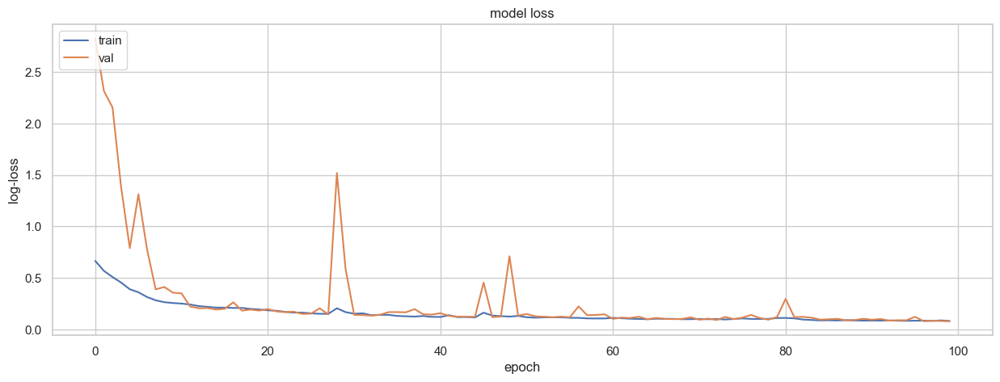

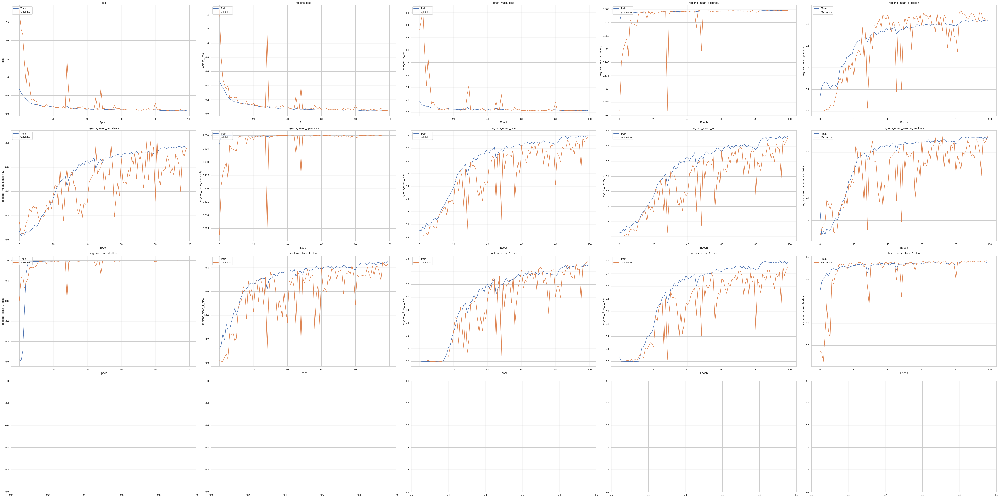

c:\Users\fmoro\SegmentationProject\SegmentationThesis\src\evaluation\inference.py:645: FutureWarning:



Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.


c:\Users\fmoro\SegmentationProject\SegmentationThesis\src\evaluation\inference.py:645: FutureWarning:



Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.


c:\Users\fmoro\SegmentationProject\SegmentationThesis\src\evaluation\inference.py:645: FutureWarning:



Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.


c:\Users\fmoro\SegmentationProject\SegmentationThesis\src\evaluation\inference.py:645: FutureWarning:



Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.


c:\Users\fmoro\SegmentationProject\S

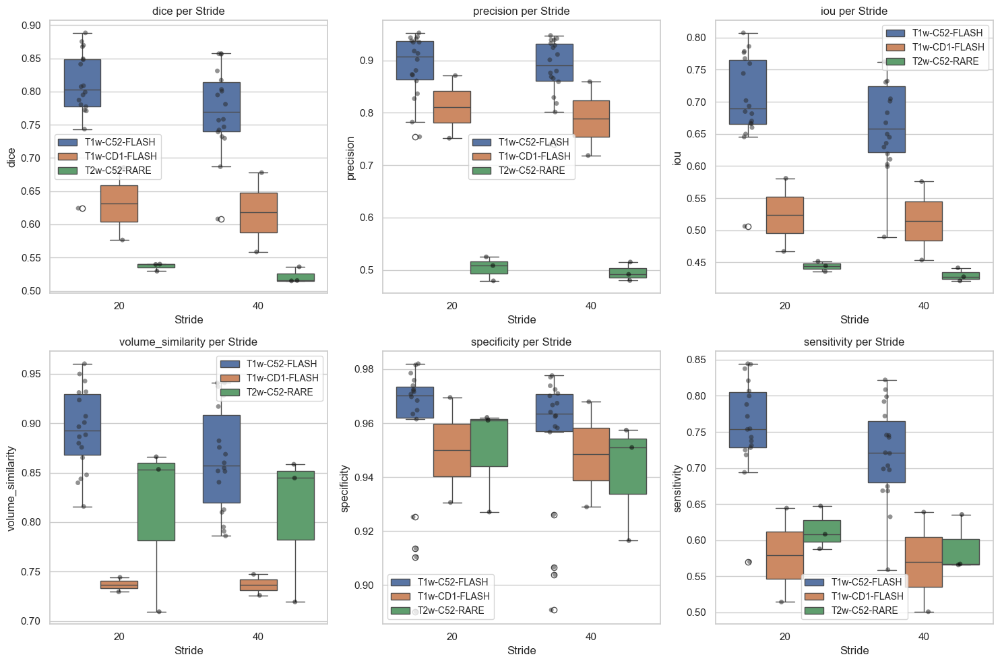

c:\Users\fmoro\SegmentationProject\SegmentationThesis\src\evaluation\inference.py:645: FutureWarning:



Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.


c:\Users\fmoro\SegmentationProject\SegmentationThesis\src\evaluation\inference.py:645: FutureWarning:



Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.


c:\Users\fmoro\SegmentationProject\SegmentationThesis\src\evaluation\inference.py:645: FutureWarning:



Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.


c:\Users\fmoro\SegmentationProject\SegmentationThesis\src\evaluation\inference.py:645: FutureWarning:



Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.


c:\Users\fmoro\SegmentationProject\S

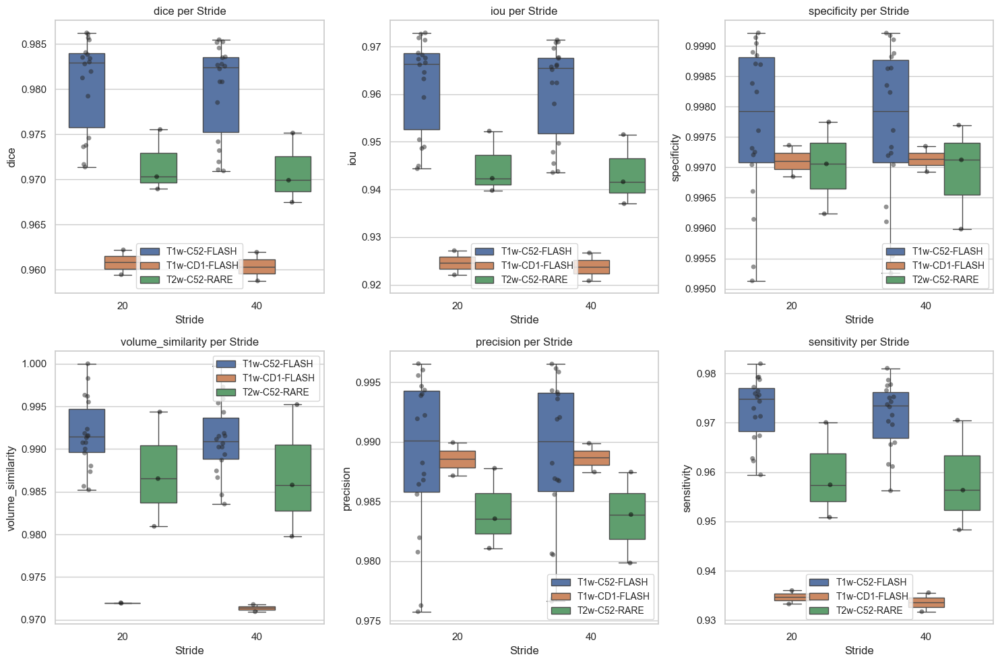

Trainig on:  267  mice
Validating on:  69  mice
Generator configuration:
- Dataset path: ..\dataset_roi
- Dimensions: (80, 80, 80)
- Batch size: 8
- Number of input channels: 1
- Number of classes: 4
- Shuffle: True

Generator configuration:
- Dataset path: ..\dataset_roi
- Dimensions: (80, 80, 80)
- Batch size: 8
- Number of input channels: 1
- Number of classes: 4
- Shuffle: True


FOLD 1
Training on 267 examples (92 unique IDs)
Unique Train IDs: ['Isch_PAL_PPIAKO_1767' 'Isch_PAL_PPIAKO_1777' 'Isch_PAL_PPIAKO_1781'
 'Isch_PAL_PPIAKO_1782' 'Isch_PAL_PPIAKO_1783' 'Isch_PAL_PPIAKO_1785'
 'Isch_PAL_PPIAKO_1789' 'Isch_PAL_PPIAKO_1790' 'Isch_PAL_PPIAKO_1815'
 'Isch_PAL_PPIAKO_1817' 'Isch_PAL_PPIAKO_1818' 'Isch_PAL_PPIAKO_1820'
 'Isch_PAL_PPIAKO_1823' 'T1w-C52-FLASH' 'T1w-CD1-FLASH' 'T2w-C52-RARE'
 'TBI_AAV_PPIAKO_1779' 'TBI_AAV_PPIAKO_1788' 'TBI_AAV_PPIAKO_1793'
 'TBI_AAV_PPIAKO_1802' 'TBI_AAV_PPIAKO_1805' 'TBI_AAV_PPIAKO_1809'
 'TBI_AAV_PPIAKO_1810' 'TBI_AAV_PPIAKO_1811' 'TBI_AAV_PPIAKO_1

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


33/33 [==============================] - 101s 3s/step - loss: 0.6928 - regions_loss: 0.4605 - brain_mask_loss: 0.1958 - regions_mean_accuracy: 0.9625 - regions_mean_precision: 0.0996 - regions_mean_sensitivity: 0.0980 - regions_mean_specificity: 0.9683 - regions_mean_dice: 0.0653 - regions_mean_iou: 0.0375 - regions_mean_volume_similarity: 0.3762 - regions_class_0_dice: 0.0506 - regions_class_1_dice: 0.1909 - regions_class_2_dice: 0.0037 - regions_class_3_dice: 0.0014 - brain_mask_class_0_dice: 0.8220 - val_loss: 3.3850 - val_regions_loss: 1.9491 - val_brain_mask_loss: 1.4021 - val_regions_mean_accuracy: 0.7377 - val_regions_mean_precision: 0.0073 - val_regions_mean_sensitivity: 0.2789 - val_regions_mean_specificity: 0.7424 - val_regions_mean_dice: 0.0131 - val_regions_mean_iou: 0.0066 - val_regions_mean_volume_similarity: 0.0807 - val_regions_class_0_dice: 0.3699 - val_regions_class_1_dice: 0.0299 - val_regions_class_2_dice: 0.0053 - val_regions_class_3_dice: 0.0040 - val_brain_mask_c

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


33/33 [==============================] - 90s 3s/step - loss: 0.5721 - regions_loss: 0.4039 - brain_mask_loss: 0.1362 - regions_mean_accuracy: 0.9927 - regions_mean_precision: 0.1949 - regions_mean_sensitivity: 0.0345 - regions_mean_specificity: 0.9996 - regions_mean_dice: 0.0560 - regions_mean_iou: 0.0322 - regions_mean_volume_similarity: 0.1112 - regions_class_0_dice: 0.0024 - regions_class_1_dice: 0.1667 - regions_class_2_dice: 0.0011 - regions_class_3_dice: 5.5323e-05 - brain_mask_class_0_dice: 0.8806 - val_loss: 3.3215 - val_regions_loss: 1.7861 - val_brain_mask_loss: 1.5051 - val_regions_mean_accuracy: 0.7502 - val_regions_mean_precision: 0.0080 - val_regions_mean_sensitivity: 0.2711 - val_regions_mean_specificity: 0.7522 - val_regions_mean_dice: 0.0153 - val_regions_mean_iou: 0.0078 - val_regions_mean_volume_similarity: 0.0434 - val_regions_class_0_dice: 0.4034 - val_regions_class_1_dice: 0.0377 - val_regions_class_2_dice: 0.0049 - val_regions_class_3_dice: 0.0032 - val_brain_mas

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


33/33 [==============================] - 88s 3s/step - loss: 0.4989 - regions_loss: 0.3631 - brain_mask_loss: 0.1067 - regions_mean_accuracy: 0.9934 - regions_mean_precision: 0.2068 - regions_mean_sensitivity: 0.0314 - regions_mean_specificity: 0.9998 - regions_mean_dice: 0.0502 - regions_mean_iou: 0.0293 - regions_mean_volume_similarity: 0.0771 - regions_class_0_dice: 0.0370 - regions_class_1_dice: 0.1505 - regions_class_2_dice: 8.5406e-05 - regions_class_3_dice: 1.4617e-09 - brain_mask_class_0_dice: 0.9111 - val_loss: 2.4078 - val_regions_loss: 1.0432 - val_brain_mask_loss: 1.3366 - val_regions_mean_accuracy: 0.7976 - val_regions_mean_precision: 0.0121 - val_regions_mean_sensitivity: 0.2255 - val_regions_mean_specificity: 0.8004 - val_regions_mean_dice: 0.0226 - val_regions_mean_iou: 0.0117 - val_regions_mean_volume_similarity: 0.0693 - val_regions_class_0_dice: 0.4948 - val_regions_class_1_dice: 0.0601 - val_regions_class_2_dice: 0.0038 - val_regions_class_3_dice: 0.0039 - val_brain

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


33/33 [==============================] - 87s 3s/step - loss: 0.4710 - regions_loss: 0.3183 - brain_mask_loss: 0.1250 - regions_mean_accuracy: 0.9923 - regions_mean_precision: 0.1933 - regions_mean_sensitivity: 0.0248 - regions_mean_specificity: 0.9998 - regions_mean_dice: 0.0389 - regions_mean_iou: 0.0232 - regions_mean_volume_similarity: 0.0556 - regions_class_0_dice: 0.5475 - regions_class_1_dice: 0.1166 - regions_class_2_dice: 2.9343e-05 - regions_class_3_dice: 1.4367e-09 - brain_mask_class_0_dice: 0.8888 - val_loss: 2.1832 - val_regions_loss: 1.1030 - val_brain_mask_loss: 1.0529 - val_regions_mean_accuracy: 0.8100 - val_regions_mean_precision: 0.0109 - val_regions_mean_sensitivity: 0.1441 - val_regions_mean_specificity: 0.8144 - val_regions_mean_dice: 0.0188 - val_regions_mean_iou: 0.0097 - val_regions_mean_volume_similarity: 0.0924 - val_regions_class_0_dice: 0.5545 - val_regions_class_1_dice: 0.0530 - val_regions_class_2_dice: 0.0023 - val_regions_class_3_dice: 0.0012 - val_brain

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


33/33 [==============================] - 89s 3s/step - loss: 0.3914 - regions_loss: 0.2751 - brain_mask_loss: 0.0896 - regions_mean_accuracy: 0.9931 - regions_mean_precision: 0.2063 - regions_mean_sensitivity: 0.0301 - regions_mean_specificity: 0.9999 - regions_mean_dice: 0.0489 - regions_mean_iou: 0.0287 - regions_mean_volume_similarity: 0.0651 - regions_class_0_dice: 0.8991 - regions_class_1_dice: 0.1467 - regions_class_2_dice: 9.0156e-10 - regions_class_3_dice: 1.3308e-09 - brain_mask_class_0_dice: 0.9239 - val_loss: 1.3380 - val_regions_loss: 0.4893 - val_brain_mask_loss: 0.8227 - val_regions_mean_accuracy: 0.9215 - val_regions_mean_precision: 0.0376 - val_regions_mean_sensitivity: 0.0482 - val_regions_mean_specificity: 0.9278 - val_regions_mean_dice: 0.0399 - val_regions_mean_iou: 0.0213 - val_regions_mean_volume_similarity: 0.3499 - val_regions_class_0_dice: 0.7722 - val_regions_class_1_dice: 0.1189 - val_regions_class_2_dice: 3.6636e-04 - val_regions_class_3_dice: 4.1927e-04 - v

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


33/33 [==============================] - 85s 3s/step - loss: 0.3483 - regions_loss: 0.2394 - brain_mask_loss: 0.0835 - regions_mean_accuracy: 0.9931 - regions_mean_precision: 0.2059 - regions_mean_sensitivity: 0.0336 - regions_mean_specificity: 0.9998 - regions_mean_dice: 0.0559 - regions_mean_iou: 0.0325 - regions_mean_volume_similarity: 0.0782 - regions_class_0_dice: 0.9878 - regions_class_1_dice: 0.1678 - regions_class_2_dice: 9.5667e-10 - regions_class_3_dice: 1.3456e-09 - brain_mask_class_0_dice: 0.9288 - val_loss: 0.7516 - val_regions_loss: 0.3823 - val_brain_mask_loss: 0.3444 - val_regions_mean_accuracy: 0.9587 - val_regions_mean_precision: 0.1072 - val_regions_mean_sensitivity: 0.0721 - val_regions_mean_specificity: 0.9643 - val_regions_mean_dice: 0.0835 - val_regions_mean_iou: 0.0507 - val_regions_mean_volume_similarity: 0.4379 - val_regions_class_0_dice: 0.7807 - val_regions_class_1_dice: 0.2504 - val_regions_class_2_dice: 2.1209e-05 - val_regions_class_3_dice: 3.6180e-10 - v

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


33/33 [==============================] - 89s 3s/step - loss: 0.3144 - regions_loss: 0.2137 - brain_mask_loss: 0.0761 - regions_mean_accuracy: 0.9930 - regions_mean_precision: 0.2393 - regions_mean_sensitivity: 0.0452 - regions_mean_specificity: 0.9998 - regions_mean_dice: 0.0707 - regions_mean_iou: 0.0421 - regions_mean_volume_similarity: 0.0938 - regions_class_0_dice: 0.9900 - regions_class_1_dice: 0.2121 - regions_class_2_dice: 9.7457e-10 - regions_class_3_dice: 1.4483e-09 - brain_mask_class_0_dice: 0.9342 - val_loss: 0.3931 - val_regions_loss: 0.2190 - val_brain_mask_loss: 0.1501 - val_regions_mean_accuracy: 0.9925 - val_regions_mean_precision: 0.1546 - val_regions_mean_sensitivity: 0.0349 - val_regions_mean_specificity: 0.9992 - val_regions_mean_dice: 0.0538 - val_regions_mean_iou: 0.0313 - val_regions_mean_volume_similarity: 0.2649 - val_regions_class_0_dice: 0.9523 - val_regions_class_1_dice: 0.1613 - val_regions_class_2_dice: 7.1102e-10 - val_regions_class_3_dice: 1.4483e-09 - v

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


33/33 [==============================] - 88s 3s/step - loss: 0.2891 - regions_loss: 0.1952 - brain_mask_loss: 0.0704 - regions_mean_accuracy: 0.9931 - regions_mean_precision: 0.2531 - regions_mean_sensitivity: 0.0716 - regions_mean_specificity: 0.9997 - regions_mean_dice: 0.1024 - regions_mean_iou: 0.0657 - regions_mean_volume_similarity: 0.1328 - regions_class_0_dice: 0.9902 - regions_class_1_dice: 0.3073 - regions_class_2_dice: 9.3881e-10 - regions_class_3_dice: 1.4952e-09 - brain_mask_class_0_dice: 0.9419 - val_loss: 0.2963 - val_regions_loss: 0.1996 - val_brain_mask_loss: 0.0736 - val_regions_mean_accuracy: 0.9914 - val_regions_mean_precision: 0.1447 - val_regions_mean_sensitivity: 0.0494 - val_regions_mean_specificity: 0.9988 - val_regions_mean_dice: 0.0709 - val_regions_mean_iou: 0.0410 - val_regions_mean_volume_similarity: 0.1592 - val_regions_class_0_dice: 0.9767 - val_regions_class_1_dice: 0.2128 - val_regions_class_2_dice: 9.9345e-10 - val_regions_class_3_dice: 1.1551e-09 - v

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


33/33 [==============================] - 87s 3s/step - loss: 0.2625 - regions_loss: 0.1734 - brain_mask_loss: 0.0670 - regions_mean_accuracy: 0.9926 - regions_mean_precision: 0.2170 - regions_mean_sensitivity: 0.0940 - regions_mean_specificity: 0.9990 - regions_mean_dice: 0.1209 - regions_mean_iou: 0.0784 - regions_mean_volume_similarity: 0.1879 - regions_class_0_dice: 0.9888 - regions_class_1_dice: 0.3627 - regions_class_2_dice: 7.7753e-10 - regions_class_3_dice: 1.2403e-09 - brain_mask_class_0_dice: 0.9441 - val_loss: 0.2649 - val_regions_loss: 0.1789 - val_brain_mask_loss: 0.0641 - val_regions_mean_accuracy: 0.9836 - val_regions_mean_precision: 0.0899 - val_regions_mean_sensitivity: 0.2574 - val_regions_mean_specificity: 0.9864 - val_regions_mean_dice: 0.1324 - val_regions_mean_iou: 0.0836 - val_regions_mean_volume_similarity: 0.1705 - val_regions_class_0_dice: 0.9720 - val_regions_class_1_dice: 0.3972 - val_regions_class_2_dice: 9.7754e-10 - val_regions_class_3_dice: 1.3221e-09 - v

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


33/33 [==============================] - 88s 3s/step - loss: 0.2329 - regions_loss: 0.1510 - brain_mask_loss: 0.0606 - regions_mean_accuracy: 0.9934 - regions_mean_precision: 0.3099 - regions_mean_sensitivity: 0.1557 - regions_mean_specificity: 0.9984 - regions_mean_dice: 0.1816 - regions_mean_iou: 0.1226 - regions_mean_volume_similarity: 0.2968 - regions_class_0_dice: 0.9900 - regions_class_1_dice: 0.5070 - regions_class_2_dice: 0.0377 - regions_class_3_dice: 2.0820e-04 - brain_mask_class_0_dice: 0.9477 - val_loss: 0.2183 - val_regions_loss: 0.1444 - val_brain_mask_loss: 0.0527 - val_regions_mean_accuracy: 0.9940 - val_regions_mean_precision: 0.3688 - val_regions_mean_sensitivity: 0.1003 - val_regions_mean_specificity: 0.9998 - val_regions_mean_dice: 0.1534 - val_regions_mean_iou: 0.0967 - val_regions_mean_volume_similarity: 0.1987 - val_regions_class_0_dice: 0.9918 - val_regions_class_1_dice: 0.4191 - val_regions_class_2_dice: 0.0412 - val_regions_class_3_dice: 1.4295e-09 - val_brain

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


33/33 [==============================] - 88s 3s/step - loss: 0.2179 - regions_loss: 0.1463 - brain_mask_loss: 0.0506 - regions_mean_accuracy: 0.9933 - regions_mean_precision: 0.3961 - regions_mean_sensitivity: 0.1852 - regions_mean_specificity: 0.9982 - regions_mean_dice: 0.2044 - regions_mean_iou: 0.1421 - regions_mean_volume_similarity: 0.3151 - regions_class_0_dice: 0.9900 - regions_class_1_dice: 0.5575 - regions_class_2_dice: 0.0525 - regions_class_3_dice: 0.0034 - brain_mask_class_0_dice: 0.9595 - val_loss: 0.2092 - val_regions_loss: 0.1365 - val_brain_mask_loss: 0.0518 - val_regions_mean_accuracy: 0.9951 - val_regions_mean_precision: 0.3253 - val_regions_mean_sensitivity: 0.1891 - val_regions_mean_specificity: 0.9988 - val_regions_mean_dice: 0.2143 - val_regions_mean_iou: 0.1530 - val_regions_mean_volume_similarity: 0.3210 - val_regions_class_0_dice: 0.9929 - val_regions_class_1_dice: 0.6108 - val_regions_class_2_dice: 0.0304 - val_regions_class_3_dice: 0.0017 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


33/33 [==============================] - 89s 3s/step - loss: 0.2097 - regions_loss: 0.1385 - brain_mask_loss: 0.0506 - regions_mean_accuracy: 0.9944 - regions_mean_precision: 0.4851 - regions_mean_sensitivity: 0.2237 - regions_mean_specificity: 0.9986 - regions_mean_dice: 0.2680 - regions_mean_iou: 0.1841 - regions_mean_volume_similarity: 0.4147 - regions_class_0_dice: 0.9918 - regions_class_1_dice: 0.6100 - regions_class_2_dice: 0.1524 - regions_class_3_dice: 0.0415 - brain_mask_class_0_dice: 0.9586 - val_loss: 0.1989 - val_regions_loss: 0.1377 - val_brain_mask_loss: 0.0407 - val_regions_mean_accuracy: 0.9943 - val_regions_mean_precision: 0.4628 - val_regions_mean_sensitivity: 0.1314 - val_regions_mean_specificity: 0.9998 - val_regions_mean_dice: 0.1957 - val_regions_mean_iou: 0.1278 - val_regions_mean_volume_similarity: 0.2446 - val_regions_class_0_dice: 0.9918 - val_regions_class_1_dice: 0.4972 - val_regions_class_2_dice: 0.0789 - val_regions_class_3_dice: 0.0110 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


33/33 [==============================] - 91s 3s/step - loss: 0.2078 - regions_loss: 0.1349 - brain_mask_loss: 0.0524 - regions_mean_accuracy: 0.9941 - regions_mean_precision: 0.5331 - regions_mean_sensitivity: 0.2502 - regions_mean_specificity: 0.9985 - regions_mean_dice: 0.2989 - regions_mean_iou: 0.2033 - regions_mean_volume_similarity: 0.4766 - regions_class_0_dice: 0.9914 - regions_class_1_dice: 0.6112 - regions_class_2_dice: 0.1984 - regions_class_3_dice: 0.0871 - brain_mask_class_0_dice: 0.9558 - val_loss: 0.1888 - val_regions_loss: 0.1258 - val_brain_mask_loss: 0.0427 - val_regions_mean_accuracy: 0.9952 - val_regions_mean_precision: 0.4886 - val_regions_mean_sensitivity: 0.2520 - val_regions_mean_specificity: 0.9984 - val_regions_mean_dice: 0.2779 - val_regions_mean_iou: 0.2057 - val_regions_mean_volume_similarity: 0.4184 - val_regions_class_0_dice: 0.9931 - val_regions_class_1_dice: 0.7063 - val_regions_class_2_dice: 0.0821 - val_regions_class_3_dice: 0.0453 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


33/33 [==============================] - 88s 3s/step - loss: 0.1949 - regions_loss: 0.1246 - brain_mask_loss: 0.0498 - regions_mean_accuracy: 0.9946 - regions_mean_precision: 0.5610 - regions_mean_sensitivity: 0.3286 - regions_mean_specificity: 0.9984 - regions_mean_dice: 0.3829 - regions_mean_iou: 0.2634 - regions_mean_volume_similarity: 0.6171 - regions_class_0_dice: 0.9922 - regions_class_1_dice: 0.6538 - regions_class_2_dice: 0.3393 - regions_class_3_dice: 0.1555 - brain_mask_class_0_dice: 0.9590 - val_loss: 0.1847 - val_regions_loss: 0.1219 - val_brain_mask_loss: 0.0424 - val_regions_mean_accuracy: 0.9953 - val_regions_mean_precision: 0.4685 - val_regions_mean_sensitivity: 0.3291 - val_regions_mean_specificity: 0.9976 - val_regions_mean_dice: 0.3433 - val_regions_mean_iou: 0.2394 - val_regions_mean_volume_similarity: 0.5509 - val_regions_class_0_dice: 0.9933 - val_regions_class_1_dice: 0.6765 - val_regions_class_2_dice: 0.2195 - val_regions_class_3_dice: 0.1339 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


33/33 [==============================] - 88s 3s/step - loss: 0.1839 - regions_loss: 0.1174 - brain_mask_loss: 0.0462 - regions_mean_accuracy: 0.9944 - regions_mean_precision: 0.6048 - regions_mean_sensitivity: 0.3776 - regions_mean_specificity: 0.9981 - regions_mean_dice: 0.4257 - regions_mean_iou: 0.2931 - regions_mean_volume_similarity: 0.6593 - regions_class_0_dice: 0.9918 - regions_class_1_dice: 0.6453 - regions_class_2_dice: 0.3722 - regions_class_3_dice: 0.2595 - brain_mask_class_0_dice: 0.9612 - val_loss: 0.1776 - val_regions_loss: 0.1132 - val_brain_mask_loss: 0.0442 - val_regions_mean_accuracy: 0.9952 - val_regions_mean_precision: 0.5812 - val_regions_mean_sensitivity: 0.3523 - val_regions_mean_specificity: 0.9985 - val_regions_mean_dice: 0.4128 - val_regions_mean_iou: 0.2900 - val_regions_mean_volume_similarity: 0.6645 - val_regions_class_0_dice: 0.9929 - val_regions_class_1_dice: 0.7182 - val_regions_class_2_dice: 0.2946 - val_regions_class_3_dice: 0.2256 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


33/33 [==============================] - 89s 3s/step - loss: 0.1766 - regions_loss: 0.1125 - brain_mask_loss: 0.0441 - regions_mean_accuracy: 0.9947 - regions_mean_precision: 0.5961 - regions_mean_sensitivity: 0.4028 - regions_mean_specificity: 0.9982 - regions_mean_dice: 0.4435 - regions_mean_iou: 0.3119 - regions_mean_volume_similarity: 0.6750 - regions_class_0_dice: 0.9924 - regions_class_1_dice: 0.6888 - regions_class_2_dice: 0.3886 - regions_class_3_dice: 0.2530 - brain_mask_class_0_dice: 0.9636 - val_loss: 0.1769 - val_regions_loss: 0.1140 - val_brain_mask_loss: 0.0430 - val_regions_mean_accuracy: 0.9951 - val_regions_mean_precision: 0.6149 - val_regions_mean_sensitivity: 0.3581 - val_regions_mean_specificity: 0.9990 - val_regions_mean_dice: 0.4218 - val_regions_mean_iou: 0.2806 - val_regions_mean_volume_similarity: 0.7015 - val_regions_class_0_dice: 0.9927 - val_regions_class_1_dice: 0.5504 - val_regions_class_2_dice: 0.3717 - val_regions_class_3_dice: 0.3432 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


33/33 [==============================] - 90s 3s/step - loss: 0.1840 - regions_loss: 0.1130 - brain_mask_loss: 0.0507 - regions_mean_accuracy: 0.9950 - regions_mean_precision: 0.5958 - regions_mean_sensitivity: 0.3926 - regions_mean_specificity: 0.9984 - regions_mean_dice: 0.4337 - regions_mean_iou: 0.2999 - regions_mean_volume_similarity: 0.6640 - regions_class_0_dice: 0.9927 - regions_class_1_dice: 0.6333 - regions_class_2_dice: 0.3720 - regions_class_3_dice: 0.2957 - brain_mask_class_0_dice: 0.9569 - val_loss: 0.1719 - val_regions_loss: 0.1093 - val_brain_mask_loss: 0.0419 - val_regions_mean_accuracy: 0.9947 - val_regions_mean_precision: 0.4718 - val_regions_mean_sensitivity: 0.4510 - val_regions_mean_specificity: 0.9969 - val_regions_mean_dice: 0.4440 - val_regions_mean_iou: 0.3085 - val_regions_mean_volume_similarity: 0.8232 - val_regions_class_0_dice: 0.9922 - val_regions_class_1_dice: 0.6796 - val_regions_class_2_dice: 0.3587 - val_regions_class_3_dice: 0.2938 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


33/33 [==============================] - 90s 3s/step - loss: 0.1655 - regions_loss: 0.1037 - brain_mask_loss: 0.0413 - regions_mean_accuracy: 0.9953 - regions_mean_precision: 0.6593 - regions_mean_sensitivity: 0.4394 - regions_mean_specificity: 0.9985 - regions_mean_dice: 0.4920 - regions_mean_iou: 0.3431 - regions_mean_volume_similarity: 0.7130 - regions_class_0_dice: 0.9932 - regions_class_1_dice: 0.6810 - regions_class_2_dice: 0.4282 - regions_class_3_dice: 0.3670 - brain_mask_class_0_dice: 0.9653 - val_loss: 0.1634 - val_regions_loss: 0.1002 - val_brain_mask_loss: 0.0429 - val_regions_mean_accuracy: 0.9963 - val_regions_mean_precision: 0.6685 - val_regions_mean_sensitivity: 0.3887 - val_regions_mean_specificity: 0.9988 - val_regions_mean_dice: 0.4644 - val_regions_mean_iou: 0.3274 - val_regions_mean_volume_similarity: 0.6685 - val_regions_class_0_dice: 0.9945 - val_regions_class_1_dice: 0.6907 - val_regions_class_2_dice: 0.3898 - val_regions_class_3_dice: 0.3126 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


33/33 [==============================] - 87s 3s/step - loss: 0.1650 - regions_loss: 0.1003 - brain_mask_loss: 0.0444 - regions_mean_accuracy: 0.9955 - regions_mean_precision: 0.6328 - regions_mean_sensitivity: 0.4682 - regions_mean_specificity: 0.9984 - regions_mean_dice: 0.5097 - regions_mean_iou: 0.3609 - regions_mean_volume_similarity: 0.7632 - regions_class_0_dice: 0.9934 - regions_class_1_dice: 0.6962 - regions_class_2_dice: 0.4387 - regions_class_3_dice: 0.3943 - brain_mask_class_0_dice: 0.9628 - val_loss: 0.1607 - val_regions_loss: 0.1058 - val_brain_mask_loss: 0.0347 - val_regions_mean_accuracy: 0.9956 - val_regions_mean_precision: 0.7780 - val_regions_mean_sensitivity: 0.2877 - val_regions_mean_specificity: 0.9992 - val_regions_mean_dice: 0.3609 - val_regions_mean_iou: 0.2650 - val_regions_mean_volume_similarity: 0.4222 - val_regions_class_0_dice: 0.9934 - val_regions_class_1_dice: 0.7542 - val_regions_class_2_dice: 0.2037 - val_regions_class_3_dice: 0.1249 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


33/33 [==============================] - 89s 3s/step - loss: 0.1620 - regions_loss: 0.0960 - brain_mask_loss: 0.0459 - regions_mean_accuracy: 0.9953 - regions_mean_precision: 0.6759 - regions_mean_sensitivity: 0.4931 - regions_mean_specificity: 0.9984 - regions_mean_dice: 0.5357 - regions_mean_iou: 0.3830 - regions_mean_volume_similarity: 0.7749 - regions_class_0_dice: 0.9931 - regions_class_1_dice: 0.6989 - regions_class_2_dice: 0.4406 - regions_class_3_dice: 0.4677 - brain_mask_class_0_dice: 0.9622 - val_loss: 0.1544 - val_regions_loss: 0.0989 - val_brain_mask_loss: 0.0354 - val_regions_mean_accuracy: 0.9951 - val_regions_mean_precision: 0.7253 - val_regions_mean_sensitivity: 0.3425 - val_regions_mean_specificity: 0.9993 - val_regions_mean_dice: 0.4399 - val_regions_mean_iou: 0.3090 - val_regions_mean_volume_similarity: 0.5593 - val_regions_class_0_dice: 0.9928 - val_regions_class_1_dice: 0.6864 - val_regions_class_2_dice: 0.4350 - val_regions_class_3_dice: 0.1983 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


33/33 [==============================] - 89s 3s/step - loss: 0.1581 - regions_loss: 0.0886 - brain_mask_loss: 0.0482 - regions_mean_accuracy: 0.9952 - regions_mean_precision: 0.6684 - regions_mean_sensitivity: 0.5371 - regions_mean_specificity: 0.9984 - regions_mean_dice: 0.5641 - regions_mean_iou: 0.4052 - regions_mean_volume_similarity: 0.7905 - regions_class_0_dice: 0.9930 - regions_class_1_dice: 0.6939 - regions_class_2_dice: 0.4827 - regions_class_3_dice: 0.5157 - brain_mask_class_0_dice: 0.9603 - val_loss: 0.1462 - val_regions_loss: 0.0856 - val_brain_mask_loss: 0.0392 - val_regions_mean_accuracy: 0.9950 - val_regions_mean_precision: 0.5634 - val_regions_mean_sensitivity: 0.6701 - val_regions_mean_specificity: 0.9966 - val_regions_mean_dice: 0.5680 - val_regions_mean_iou: 0.4185 - val_regions_mean_volume_similarity: 0.7630 - val_regions_class_0_dice: 0.9931 - val_regions_class_1_dice: 0.7610 - val_regions_class_2_dice: 0.3494 - val_regions_class_3_dice: 0.5937 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


33/33 [==============================] - 88s 3s/step - loss: 0.1390 - regions_loss: 0.0755 - brain_mask_loss: 0.0427 - regions_mean_accuracy: 0.9960 - regions_mean_precision: 0.7141 - regions_mean_sensitivity: 0.5995 - regions_mean_specificity: 0.9985 - regions_mean_dice: 0.6287 - regions_mean_iou: 0.4698 - regions_mean_volume_similarity: 0.8350 - regions_class_0_dice: 0.9943 - regions_class_1_dice: 0.7496 - regions_class_2_dice: 0.5318 - regions_class_3_dice: 0.6046 - brain_mask_class_0_dice: 0.9642 - val_loss: 0.1392 - val_regions_loss: 0.0747 - val_brain_mask_loss: 0.0438 - val_regions_mean_accuracy: 0.9965 - val_regions_mean_precision: 0.8515 - val_regions_mean_sensitivity: 0.4602 - val_regions_mean_specificity: 0.9995 - val_regions_mean_dice: 0.5867 - val_regions_mean_iou: 0.4254 - val_regions_mean_volume_similarity: 0.6934 - val_regions_class_0_dice: 0.9949 - val_regions_class_1_dice: 0.7230 - val_regions_class_2_dice: 0.5104 - val_regions_class_3_dice: 0.5266 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


33/33 [==============================] - 89s 3s/step - loss: 0.1286 - regions_loss: 0.0697 - brain_mask_loss: 0.0385 - regions_mean_accuracy: 0.9958 - regions_mean_precision: 0.7391 - regions_mean_sensitivity: 0.6239 - regions_mean_specificity: 0.9984 - regions_mean_dice: 0.6563 - regions_mean_iou: 0.4990 - regions_mean_volume_similarity: 0.8408 - regions_class_0_dice: 0.9939 - regions_class_1_dice: 0.7605 - regions_class_2_dice: 0.5650 - regions_class_3_dice: 0.6433 - brain_mask_class_0_dice: 0.9689 - val_loss: 0.1214 - val_regions_loss: 0.0685 - val_brain_mask_loss: 0.0326 - val_regions_mean_accuracy: 0.9972 - val_regions_mean_precision: 0.7772 - val_regions_mean_sensitivity: 0.5731 - val_regions_mean_specificity: 0.9989 - val_regions_mean_dice: 0.6461 - val_regions_mean_iou: 0.4891 - val_regions_mean_volume_similarity: 0.8324 - val_regions_class_0_dice: 0.9961 - val_regions_class_1_dice: 0.7647 - val_regions_class_2_dice: 0.5367 - val_regions_class_3_dice: 0.6370 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


33/33 [==============================] - 91s 3s/step - loss: 0.1270 - regions_loss: 0.0657 - brain_mask_loss: 0.0393 - regions_mean_accuracy: 0.9961 - regions_mean_precision: 0.7401 - regions_mean_sensitivity: 0.6461 - regions_mean_specificity: 0.9984 - regions_mean_dice: 0.6722 - regions_mean_iou: 0.5160 - regions_mean_volume_similarity: 0.8596 - regions_class_0_dice: 0.9945 - regions_class_1_dice: 0.7799 - regions_class_2_dice: 0.5799 - regions_class_3_dice: 0.6569 - brain_mask_class_0_dice: 0.9675 - val_loss: 0.1177 - val_regions_loss: 0.0623 - val_brain_mask_loss: 0.0336 - val_regions_mean_accuracy: 0.9971 - val_regions_mean_precision: 0.8143 - val_regions_mean_sensitivity: 0.5756 - val_regions_mean_specificity: 0.9994 - val_regions_mean_dice: 0.6561 - val_regions_mean_iou: 0.5061 - val_regions_mean_volume_similarity: 0.8019 - val_regions_class_0_dice: 0.9959 - val_regions_class_1_dice: 0.7686 - val_regions_class_2_dice: 0.5292 - val_regions_class_3_dice: 0.6704 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


33/33 [==============================] - 90s 3s/step - loss: 0.1216 - regions_loss: 0.0621 - brain_mask_loss: 0.0387 - regions_mean_accuracy: 0.9965 - regions_mean_precision: 0.7566 - regions_mean_sensitivity: 0.6616 - regions_mean_specificity: 0.9987 - regions_mean_dice: 0.6856 - regions_mean_iou: 0.5321 - regions_mean_volume_similarity: 0.8556 - regions_class_0_dice: 0.9950 - regions_class_1_dice: 0.7913 - regions_class_2_dice: 0.6063 - regions_class_3_dice: 0.6592 - brain_mask_class_0_dice: 0.9679 - val_loss: 0.1142 - val_regions_loss: 0.0595 - val_brain_mask_loss: 0.0340 - val_regions_mean_accuracy: 0.9967 - val_regions_mean_precision: 0.8711 - val_regions_mean_sensitivity: 0.5776 - val_regions_mean_specificity: 0.9993 - val_regions_mean_dice: 0.6870 - val_regions_mean_iou: 0.5301 - val_regions_mean_volume_similarity: 0.7913 - val_regions_class_0_dice: 0.9952 - val_regions_class_1_dice: 0.7838 - val_regions_class_2_dice: 0.6328 - val_regions_class_3_dice: 0.6443 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


33/33 [==============================] - 89s 3s/step - loss: 0.1155 - regions_loss: 0.0579 - brain_mask_loss: 0.0379 - regions_mean_accuracy: 0.9965 - regions_mean_precision: 0.7733 - regions_mean_sensitivity: 0.6820 - regions_mean_specificity: 0.9987 - regions_mean_dice: 0.7139 - regions_mean_iou: 0.5606 - regions_mean_volume_similarity: 0.8887 - regions_class_0_dice: 0.9950 - regions_class_1_dice: 0.7758 - regions_class_2_dice: 0.6564 - regions_class_3_dice: 0.7096 - brain_mask_class_0_dice: 0.9682 - val_loss: 0.1120 - val_regions_loss: 0.0615 - val_brain_mask_loss: 0.0309 - val_regions_mean_accuracy: 0.9968 - val_regions_mean_precision: 0.8512 - val_regions_mean_sensitivity: 0.5686 - val_regions_mean_specificity: 0.9993 - val_regions_mean_dice: 0.6698 - val_regions_mean_iou: 0.5115 - val_regions_mean_volume_similarity: 0.7957 - val_regions_class_0_dice: 0.9954 - val_regions_class_1_dice: 0.7786 - val_regions_class_2_dice: 0.6304 - val_regions_class_3_dice: 0.6006 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


33/33 [==============================] - 91s 3s/step - loss: 0.1115 - regions_loss: 0.0598 - brain_mask_loss: 0.0325 - regions_mean_accuracy: 0.9965 - regions_mean_precision: 0.7579 - regions_mean_sensitivity: 0.6834 - regions_mean_specificity: 0.9985 - regions_mean_dice: 0.6982 - regions_mean_iou: 0.5457 - regions_mean_volume_similarity: 0.8609 - regions_class_0_dice: 0.9950 - regions_class_1_dice: 0.7859 - regions_class_2_dice: 0.6348 - regions_class_3_dice: 0.6741 - brain_mask_class_0_dice: 0.9732 - val_loss: 0.1092 - val_regions_loss: 0.0556 - val_brain_mask_loss: 0.0345 - val_regions_mean_accuracy: 0.9965 - val_regions_mean_precision: 0.7981 - val_regions_mean_sensitivity: 0.6997 - val_regions_mean_specificity: 0.9990 - val_regions_mean_dice: 0.7425 - val_regions_mean_iou: 0.5938 - val_regions_mean_volume_similarity: 0.9213 - val_regions_class_0_dice: 0.9951 - val_regions_class_1_dice: 0.7948 - val_regions_class_2_dice: 0.6681 - val_regions_class_3_dice: 0.7644 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


33/33 [==============================] - 87s 3s/step - loss: 0.1168 - regions_loss: 0.0580 - brain_mask_loss: 0.0396 - regions_mean_accuracy: 0.9966 - regions_mean_precision: 0.7671 - regions_mean_sensitivity: 0.6909 - regions_mean_specificity: 0.9986 - regions_mean_dice: 0.7099 - regions_mean_iou: 0.5575 - regions_mean_volume_similarity: 0.8710 - regions_class_0_dice: 0.9951 - regions_class_1_dice: 0.7811 - regions_class_2_dice: 0.6435 - regions_class_3_dice: 0.7050 - brain_mask_class_0_dice: 0.9668 - val_loss: 0.1085 - val_regions_loss: 0.0599 - val_brain_mask_loss: 0.0292 - val_regions_mean_accuracy: 0.9972 - val_regions_mean_precision: 0.8379 - val_regions_mean_sensitivity: 0.5839 - val_regions_mean_specificity: 0.9995 - val_regions_mean_dice: 0.6827 - val_regions_mean_iou: 0.5251 - val_regions_mean_volume_similarity: 0.8167 - val_regions_class_0_dice: 0.9959 - val_regions_class_1_dice: 0.6990 - val_regions_class_2_dice: 0.6337 - val_regions_class_3_dice: 0.7155 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


33/33 [==============================] - 89s 3s/step - loss: 0.1132 - regions_loss: 0.0576 - brain_mask_loss: 0.0361 - regions_mean_accuracy: 0.9967 - regions_mean_precision: 0.7661 - regions_mean_sensitivity: 0.6890 - regions_mean_specificity: 0.9987 - regions_mean_dice: 0.7088 - regions_mean_iou: 0.5560 - regions_mean_volume_similarity: 0.8672 - regions_class_0_dice: 0.9953 - regions_class_1_dice: 0.7794 - regions_class_2_dice: 0.6373 - regions_class_3_dice: 0.7096 - brain_mask_class_0_dice: 0.9690 - val_loss: 0.1032 - val_regions_loss: 0.0569 - val_brain_mask_loss: 0.0268 - val_regions_mean_accuracy: 0.9972 - val_regions_mean_precision: 0.7583 - val_regions_mean_sensitivity: 0.7116 - val_regions_mean_specificity: 0.9992 - val_regions_mean_dice: 0.7239 - val_regions_mean_iou: 0.5741 - val_regions_mean_volume_similarity: 0.9024 - val_regions_class_0_dice: 0.9962 - val_regions_class_1_dice: 0.7703 - val_regions_class_2_dice: 0.6375 - val_regions_class_3_dice: 0.7637 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


33/33 [==============================] - 89s 3s/step - loss: 0.1065 - regions_loss: 0.0531 - brain_mask_loss: 0.0351 - regions_mean_accuracy: 0.9968 - regions_mean_precision: 0.7860 - regions_mean_sensitivity: 0.7110 - regions_mean_specificity: 0.9987 - regions_mean_dice: 0.7317 - regions_mean_iou: 0.5842 - regions_mean_volume_similarity: 0.8851 - regions_class_0_dice: 0.9955 - regions_class_1_dice: 0.8106 - regions_class_2_dice: 0.6677 - regions_class_3_dice: 0.7167 - brain_mask_class_0_dice: 0.9710 - val_loss: 0.0967 - val_regions_loss: 0.0498 - val_brain_mask_loss: 0.0286 - val_regions_mean_accuracy: 0.9971 - val_regions_mean_precision: 0.8045 - val_regions_mean_sensitivity: 0.7359 - val_regions_mean_specificity: 0.9992 - val_regions_mean_dice: 0.7626 - val_regions_mean_iou: 0.6195 - val_regions_mean_volume_similarity: 0.9228 - val_regions_class_0_dice: 0.9959 - val_regions_class_1_dice: 0.7947 - val_regions_class_2_dice: 0.6976 - val_regions_class_3_dice: 0.7955 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


33/33 [==============================] - 87s 3s/step - loss: 0.1046 - regions_loss: 0.0525 - brain_mask_loss: 0.0338 - regions_mean_accuracy: 0.9970 - regions_mean_precision: 0.7836 - regions_mean_sensitivity: 0.7104 - regions_mean_specificity: 0.9988 - regions_mean_dice: 0.7347 - regions_mean_iou: 0.5856 - regions_mean_volume_similarity: 0.8986 - regions_class_0_dice: 0.9958 - regions_class_1_dice: 0.8049 - regions_class_2_dice: 0.6769 - regions_class_3_dice: 0.7222 - brain_mask_class_0_dice: 0.9715 - val_loss: 0.0927 - val_regions_loss: 0.0478 - val_brain_mask_loss: 0.0266 - val_regions_mean_accuracy: 0.9977 - val_regions_mean_precision: 0.8545 - val_regions_mean_sensitivity: 0.6835 - val_regions_mean_specificity: 0.9994 - val_regions_mean_dice: 0.7561 - val_regions_mean_iou: 0.6141 - val_regions_mean_volume_similarity: 0.8850 - val_regions_class_0_dice: 0.9968 - val_regions_class_1_dice: 0.8039 - val_regions_class_2_dice: 0.6724 - val_regions_class_3_dice: 0.7919 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


33/33 [==============================] - 89s 3s/step - loss: 0.1034 - regions_loss: 0.0523 - brain_mask_loss: 0.0332 - regions_mean_accuracy: 0.9970 - regions_mean_precision: 0.7861 - regions_mean_sensitivity: 0.7103 - regions_mean_specificity: 0.9988 - regions_mean_dice: 0.7342 - regions_mean_iou: 0.5857 - regions_mean_volume_similarity: 0.8919 - regions_class_0_dice: 0.9958 - regions_class_1_dice: 0.8007 - regions_class_2_dice: 0.6771 - regions_class_3_dice: 0.7248 - brain_mask_class_0_dice: 0.9726 - val_loss: 0.0922 - val_regions_loss: 0.0495 - val_brain_mask_loss: 0.0249 - val_regions_mean_accuracy: 0.9972 - val_regions_mean_precision: 0.8322 - val_regions_mean_sensitivity: 0.6957 - val_regions_mean_specificity: 0.9992 - val_regions_mean_dice: 0.7562 - val_regions_mean_iou: 0.6120 - val_regions_mean_volume_similarity: 0.9096 - val_regions_class_0_dice: 0.9960 - val_regions_class_1_dice: 0.8062 - val_regions_class_2_dice: 0.6945 - val_regions_class_3_dice: 0.7679 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


33/33 [==============================] - 91s 3s/step - loss: 0.0896 - regions_loss: 0.0444 - brain_mask_loss: 0.0281 - regions_mean_accuracy: 0.9971 - regions_mean_precision: 0.8202 - regions_mean_sensitivity: 0.7553 - regions_mean_specificity: 0.9988 - regions_mean_dice: 0.7807 - regions_mean_iou: 0.6438 - regions_mean_volume_similarity: 0.9195 - regions_class_0_dice: 0.9960 - regions_class_1_dice: 0.8347 - regions_class_2_dice: 0.7355 - regions_class_3_dice: 0.7718 - brain_mask_class_0_dice: 0.9770 - val_loss: 0.0904 - val_regions_loss: 0.0466 - val_brain_mask_loss: 0.0267 - val_regions_mean_accuracy: 0.9976 - val_regions_mean_precision: 0.8653 - val_regions_mean_sensitivity: 0.6717 - val_regions_mean_specificity: 0.9992 - val_regions_mean_dice: 0.7516 - val_regions_mean_iou: 0.6091 - val_regions_mean_volume_similarity: 0.8661 - val_regions_class_0_dice: 0.9967 - val_regions_class_1_dice: 0.8357 - val_regions_class_2_dice: 0.6645 - val_regions_class_3_dice: 0.7545 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


33/33 [==============================] - 90s 3s/step - loss: 0.0866 - regions_loss: 0.0436 - brain_mask_loss: 0.0271 - regions_mean_accuracy: 0.9975 - regions_mean_precision: 0.8201 - regions_mean_sensitivity: 0.7578 - regions_mean_specificity: 0.9990 - regions_mean_dice: 0.7826 - regions_mean_iou: 0.6476 - regions_mean_volume_similarity: 0.9260 - regions_class_0_dice: 0.9964 - regions_class_1_dice: 0.8254 - regions_class_2_dice: 0.7403 - regions_class_3_dice: 0.7821 - brain_mask_class_0_dice: 0.9773 - val_loss: 0.0854 - val_regions_loss: 0.0443 - val_brain_mask_loss: 0.0254 - val_regions_mean_accuracy: 0.9978 - val_regions_mean_precision: 0.8610 - val_regions_mean_sensitivity: 0.7251 - val_regions_mean_specificity: 0.9993 - val_regions_mean_dice: 0.7837 - val_regions_mean_iou: 0.6470 - val_regions_mean_volume_similarity: 0.9106 - val_regions_class_0_dice: 0.9969 - val_regions_class_1_dice: 0.8223 - val_regions_class_2_dice: 0.7582 - val_regions_class_3_dice: 0.7706 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


33/33 [==============================] - 90s 3s/step - loss: 0.0846 - regions_loss: 0.0423 - brain_mask_loss: 0.0270 - regions_mean_accuracy: 0.9974 - regions_mean_precision: 0.8254 - regions_mean_sensitivity: 0.7674 - regions_mean_specificity: 0.9989 - regions_mean_dice: 0.7911 - regions_mean_iou: 0.6580 - regions_mean_volume_similarity: 0.9343 - regions_class_0_dice: 0.9963 - regions_class_1_dice: 0.8293 - regions_class_2_dice: 0.7548 - regions_class_3_dice: 0.7893 - brain_mask_class_0_dice: 0.9772 - val_loss: 0.0819 - val_regions_loss: 0.0409 - val_brain_mask_loss: 0.0258 - val_regions_mean_accuracy: 0.9980 - val_regions_mean_precision: 0.9185 - val_regions_mean_sensitivity: 0.6977 - val_regions_mean_specificity: 0.9995 - val_regions_mean_dice: 0.7879 - val_regions_mean_iou: 0.6555 - val_regions_mean_volume_similarity: 0.8588 - val_regions_class_0_dice: 0.9972 - val_regions_class_1_dice: 0.8699 - val_regions_class_2_dice: 0.7465 - val_regions_class_3_dice: 0.7473 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_1\assets


33/33 [==============================] - 89s 3s/step - loss: 0.0843 - regions_loss: 0.0431 - brain_mask_loss: 0.0265 - regions_mean_accuracy: 0.9973 - regions_mean_precision: 0.8177 - regions_mean_sensitivity: 0.7701 - regions_mean_specificity: 0.9989 - regions_mean_dice: 0.7873 - regions_mean_iou: 0.6533 - regions_mean_volume_similarity: 0.9299 - regions_class_0_dice: 0.9962 - regions_class_1_dice: 0.8276 - regions_class_2_dice: 0.7467 - regions_class_3_dice: 0.7875 - brain_mask_class_0_dice: 0.9778 - val_loss: 0.0782 - val_regions_loss: 0.0408 - val_brain_mask_loss: 0.0227 - val_regions_mean_accuracy: 0.9976 - val_regions_mean_precision: 0.8880 - val_regions_mean_sensitivity: 0.7253 - val_regions_mean_specificity: 0.9991 - val_regions_mean_dice: 0.7942 - val_regions_mean_iou: 0.6624 - val_regions_mean_volume_similarity: 0.8943 - val_regions_class_0_dice: 0.9966 - val_regions_class_1_dice: 0.8508 - val_regions_class_2_dice: 0.7423 - val_regions_class_3_dice: 0.7895 - val_brain_mask_cl

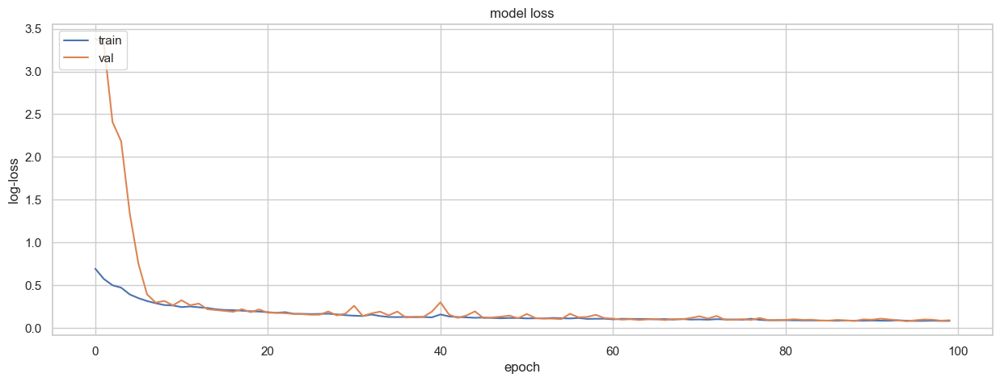

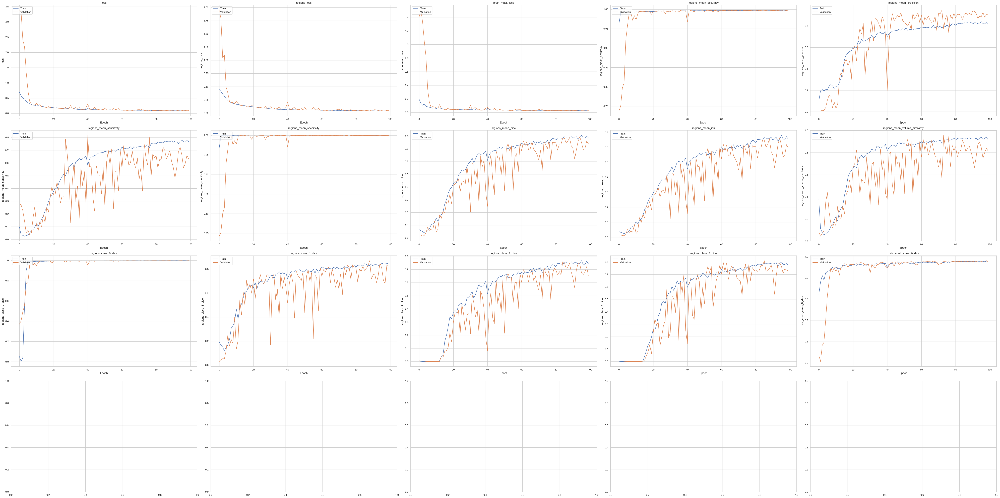

c:\Users\fmoro\SegmentationProject\SegmentationThesis\src\evaluation\inference.py:645: FutureWarning:



Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.


c:\Users\fmoro\SegmentationProject\SegmentationThesis\src\evaluation\inference.py:645: FutureWarning:



Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.


c:\Users\fmoro\SegmentationProject\SegmentationThesis\src\evaluation\inference.py:645: FutureWarning:



Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.


c:\Users\fmoro\SegmentationProject\SegmentationThesis\src\evaluation\inference.py:645: FutureWarning:



Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.


c:\Users\fmoro\SegmentationProject\S

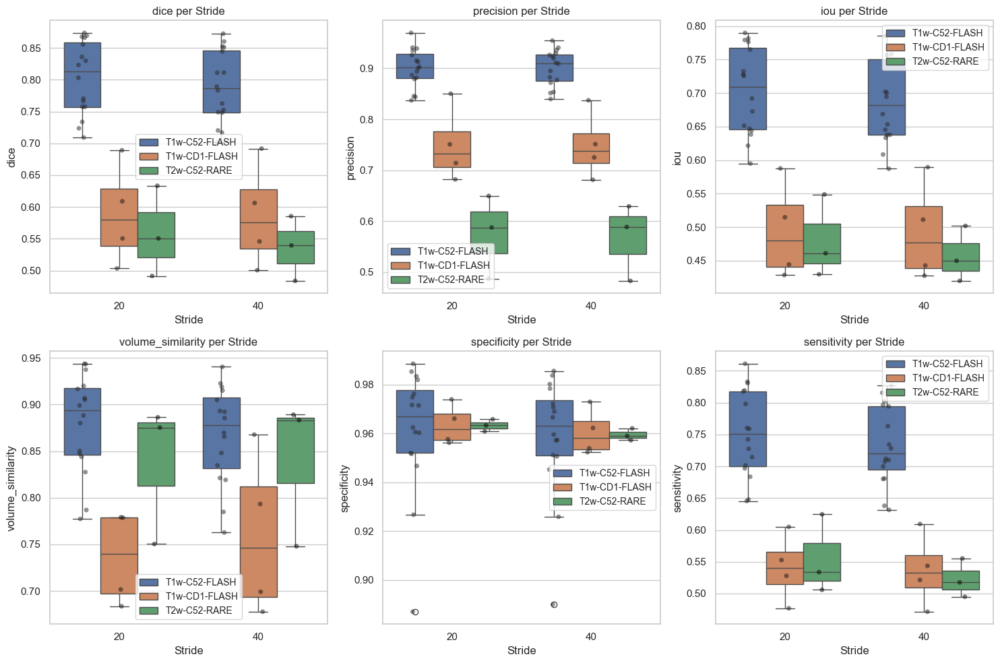

c:\Users\fmoro\SegmentationProject\SegmentationThesis\src\evaluation\inference.py:645: FutureWarning:



Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.


c:\Users\fmoro\SegmentationProject\SegmentationThesis\src\evaluation\inference.py:645: FutureWarning:



Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.


c:\Users\fmoro\SegmentationProject\SegmentationThesis\src\evaluation\inference.py:645: FutureWarning:



Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.


c:\Users\fmoro\SegmentationProject\SegmentationThesis\src\evaluation\inference.py:645: FutureWarning:



Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.


c:\Users\fmoro\SegmentationProject\S

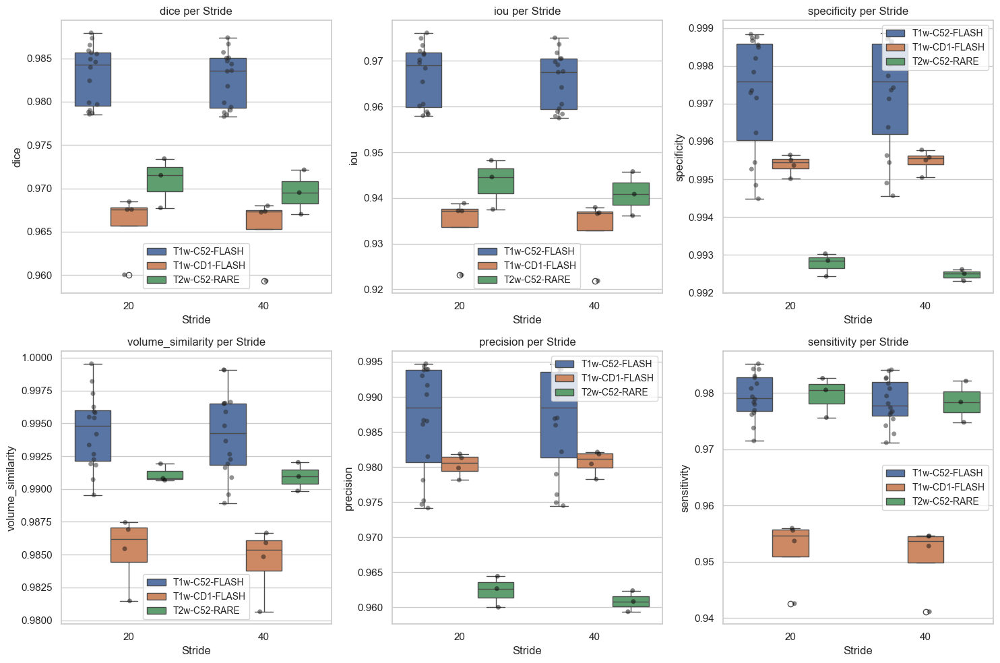

Trainig on:  270  mice
Validating on:  66  mice
Generator configuration:
- Dataset path: ..\dataset_roi
- Dimensions: (80, 80, 80)
- Batch size: 8
- Number of input channels: 1
- Number of classes: 4
- Shuffle: True

Generator configuration:
- Dataset path: ..\dataset_roi
- Dimensions: (80, 80, 80)
- Batch size: 8
- Number of input channels: 1
- Number of classes: 4
- Shuffle: True


FOLD 2
Training on 270 examples (93 unique IDs)
Unique Train IDs: ['Isch_PAL_PPIAKO_1767' 'Isch_PAL_PPIAKO_1777' 'Isch_PAL_PPIAKO_1781'
 'Isch_PAL_PPIAKO_1783' 'Isch_PAL_PPIAKO_1784' 'Isch_PAL_PPIAKO_1795'
 'Isch_PAL_PPIAKO_1815' 'Isch_PAL_PPIAKO_1817' 'Isch_PAL_PPIAKO_1818'
 'Isch_PAL_PPIAKO_1823' 'T1w-C52-FLASH' 'T1w-CD1-FLASH' 'T2w-C52-RARE'
 'TBI_AAV_PPIAKO_1768' 'TBI_AAV_PPIAKO_1776' 'TBI_AAV_PPIAKO_1788'
 'TBI_AAV_PPIAKO_1802' 'TBI_AAV_PPIAKO_1805' 'TBI_AAV_PPIAKO_1807'
 'TBI_AAV_PPIAKO_1809' 'TBI_AAV_PPIAKO_1824' 'TBI_AAV_PPIAKO_1827'
 'TBI_MC_fp_22_126_5M' 'TBI_MC_fp_22_127_5M' 'TBI_MC_fp_22_127_5W

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


33/33 [==============================] - 102s 3s/step - loss: 0.6676 - regions_loss: 0.4505 - brain_mask_loss: 0.1808 - regions_mean_accuracy: 0.9821 - regions_mean_precision: 0.1332 - regions_mean_sensitivity: 0.0496 - regions_mean_specificity: 0.9883 - regions_mean_dice: 0.0410 - regions_mean_iou: 0.0224 - regions_mean_volume_similarity: 0.2569 - regions_class_0_dice: 0.0300 - regions_class_1_dice: 0.1105 - regions_class_2_dice: 0.0098 - regions_class_3_dice: 0.0027 - brain_mask_class_0_dice: 0.8327 - val_loss: 3.0422 - val_regions_loss: 1.6437 - val_brain_mask_loss: 1.3651 - val_regions_mean_accuracy: 0.7812 - val_regions_mean_precision: 0.0036 - val_regions_mean_sensitivity: 0.1744 - val_regions_mean_specificity: 0.7872 - val_regions_mean_dice: 0.0068 - val_regions_mean_iou: 0.0034 - val_regions_mean_volume_similarity: 0.0790 - val_regions_class_0_dice: 0.5266 - val_regions_class_1_dice: 0.0090 - val_regions_class_2_dice: 0.0083 - val_regions_class_3_dice: 0.0032 - val_brain_mask_c

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


33/33 [==============================] - 91s 3s/step - loss: 0.5808 - regions_loss: 0.4089 - brain_mask_loss: 0.1406 - regions_mean_accuracy: 0.9928 - regions_mean_precision: 0.2271 - regions_mean_sensitivity: 0.0318 - regions_mean_specificity: 0.9998 - regions_mean_dice: 0.0515 - regions_mean_iou: 0.0302 - regions_mean_volume_similarity: 0.0933 - regions_class_0_dice: 0.0014 - regions_class_1_dice: 0.1529 - regions_class_2_dice: 0.0016 - regions_class_3_dice: 1.4074e-09 - brain_mask_class_0_dice: 0.8736 - val_loss: 2.9664 - val_regions_loss: 1.5309 - val_brain_mask_loss: 1.4062 - val_regions_mean_accuracy: 0.7683 - val_regions_mean_precision: 0.0072 - val_regions_mean_sensitivity: 0.2106 - val_regions_mean_specificity: 0.7731 - val_regions_mean_dice: 0.0135 - val_regions_mean_iou: 0.0068 - val_regions_mean_volume_similarity: 0.0663 - val_regions_class_0_dice: 0.4694 - val_regions_class_1_dice: 0.0271 - val_regions_class_2_dice: 0.0087 - val_regions_class_3_dice: 0.0047 - val_brain_mas

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


33/33 [==============================] - 90s 3s/step - loss: 0.5147 - regions_loss: 0.3670 - brain_mask_loss: 0.1201 - regions_mean_accuracy: 0.9932 - regions_mean_precision: 0.2322 - regions_mean_sensitivity: 0.0267 - regions_mean_specificity: 0.9999 - regions_mean_dice: 0.0455 - regions_mean_iou: 0.0260 - regions_mean_volume_similarity: 0.0618 - regions_class_0_dice: 0.0430 - regions_class_1_dice: 0.1364 - regions_class_2_dice: 1.1183e-05 - regions_class_3_dice: 1.4271e-09 - brain_mask_class_0_dice: 0.8934 - val_loss: 2.1539 - val_regions_loss: 1.1771 - val_brain_mask_loss: 0.9507 - val_regions_mean_accuracy: 0.7926 - val_regions_mean_precision: 0.0058 - val_regions_mean_sensitivity: 0.2287 - val_regions_mean_specificity: 0.7976 - val_regions_mean_dice: 0.0110 - val_regions_mean_iou: 0.0056 - val_regions_mean_volume_similarity: 0.0682 - val_regions_class_0_dice: 0.4983 - val_regions_class_1_dice: 0.0173 - val_regions_class_2_dice: 0.0101 - val_regions_class_3_dice: 0.0057 - val_brain

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


33/33 [==============================] - 90s 3s/step - loss: 0.4479 - regions_loss: 0.3178 - brain_mask_loss: 0.1051 - regions_mean_accuracy: 0.9930 - regions_mean_precision: 0.1879 - regions_mean_sensitivity: 0.0173 - regions_mean_specificity: 0.9999 - regions_mean_dice: 0.0304 - regions_mean_iou: 0.0168 - regions_mean_volume_similarity: 0.0413 - regions_class_0_dice: 0.5272 - regions_class_1_dice: 0.0913 - regions_class_2_dice: 9.5211e-10 - regions_class_3_dice: 1.3594e-09 - brain_mask_class_0_dice: 0.9094 - val_loss: 2.0427 - val_regions_loss: 0.5178 - val_brain_mask_loss: 1.5009 - val_regions_mean_accuracy: 0.8988 - val_regions_mean_precision: 0.0227 - val_regions_mean_sensitivity: 0.1777 - val_regions_mean_specificity: 0.9043 - val_regions_mean_dice: 0.0390 - val_regions_mean_iou: 0.0206 - val_regions_mean_volume_similarity: 0.1495 - val_regions_class_0_dice: 0.6283 - val_regions_class_1_dice: 0.1044 - val_regions_class_2_dice: 0.0087 - val_regions_class_3_dice: 0.0039 - val_brain

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


33/33 [==============================] - 88s 3s/step - loss: 0.3840 - regions_loss: 0.2694 - brain_mask_loss: 0.0915 - regions_mean_accuracy: 0.9925 - regions_mean_precision: 0.2462 - regions_mean_sensitivity: 0.0388 - regions_mean_specificity: 0.9998 - regions_mean_dice: 0.0635 - regions_mean_iou: 0.0372 - regions_mean_volume_similarity: 0.0815 - regions_class_0_dice: 0.9420 - regions_class_1_dice: 0.1906 - regions_class_2_dice: 9.1394e-10 - regions_class_3_dice: 1.2763e-09 - brain_mask_class_0_dice: 0.9234 - val_loss: 0.9154 - val_regions_loss: 0.2744 - val_brain_mask_loss: 0.6187 - val_regions_mean_accuracy: 0.9686 - val_regions_mean_precision: 0.0348 - val_regions_mean_sensitivity: 0.1863 - val_regions_mean_specificity: 0.9720 - val_regions_mean_dice: 0.0569 - val_regions_mean_iou: 0.0315 - val_regions_mean_volume_similarity: 0.5735 - val_regions_class_0_dice: 0.8354 - val_regions_class_1_dice: 0.1676 - val_regions_class_2_dice: 1.6944e-05 - val_regions_class_3_dice: 0.0030 - val_b

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


33/33 [==============================] - 93s 3s/step - loss: 0.3334 - regions_loss: 0.2317 - brain_mask_loss: 0.0800 - regions_mean_accuracy: 0.9930 - regions_mean_precision: 0.2070 - regions_mean_sensitivity: 0.0515 - regions_mean_specificity: 0.9998 - regions_mean_dice: 0.0776 - regions_mean_iou: 0.0485 - regions_mean_volume_similarity: 0.0964 - regions_class_0_dice: 0.9885 - regions_class_1_dice: 0.2329 - regions_class_2_dice: 9.4406e-10 - regions_class_3_dice: 1.3179e-09 - brain_mask_class_0_dice: 0.9334 - val_loss: 0.6850 - val_regions_loss: 0.2288 - val_brain_mask_loss: 0.4351 - val_regions_mean_accuracy: 0.9840 - val_regions_mean_precision: 0.0956 - val_regions_mean_sensitivity: 0.1830 - val_regions_mean_specificity: 0.9893 - val_regions_mean_dice: 0.1218 - val_regions_mean_iou: 0.0749 - val_regions_mean_volume_similarity: 0.2690 - val_regions_class_0_dice: 0.9335 - val_regions_class_1_dice: 0.3653 - val_regions_class_2_dice: 6.8128e-10 - val_regions_class_3_dice: 1.6239e-04 - v

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


33/33 [==============================] - 90s 3s/step - loss: 0.3215 - regions_loss: 0.2065 - brain_mask_loss: 0.0939 - regions_mean_accuracy: 0.9935 - regions_mean_precision: 0.2022 - regions_mean_sensitivity: 0.0412 - regions_mean_specificity: 0.9998 - regions_mean_dice: 0.0653 - regions_mean_iou: 0.0392 - regions_mean_volume_similarity: 0.0826 - regions_class_0_dice: 0.9906 - regions_class_1_dice: 0.1959 - regions_class_2_dice: 1.1174e-09 - regions_class_3_dice: 1.5333e-09 - brain_mask_class_0_dice: 0.9150 - val_loss: 0.4982 - val_regions_loss: 0.2012 - val_brain_mask_loss: 0.2761 - val_regions_mean_accuracy: 0.9870 - val_regions_mean_precision: 0.1419 - val_regions_mean_sensitivity: 0.0835 - val_regions_mean_specificity: 0.9950 - val_regions_mean_dice: 0.0845 - val_regions_mean_iou: 0.0486 - val_regions_mean_volume_similarity: 0.3138 - val_regions_class_0_dice: 0.9709 - val_regions_class_1_dice: 0.2507 - val_regions_class_2_dice: 6.9199e-10 - val_regions_class_3_dice: 0.0027 - val_b

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


33/33 [==============================] - 88s 3s/step - loss: 0.2795 - regions_loss: 0.1902 - brain_mask_loss: 0.0688 - regions_mean_accuracy: 0.9924 - regions_mean_precision: 0.2218 - regions_mean_sensitivity: 0.0553 - regions_mean_specificity: 0.9997 - regions_mean_dice: 0.0836 - regions_mean_iou: 0.0516 - regions_mean_volume_similarity: 0.1101 - regions_class_0_dice: 0.9889 - regions_class_1_dice: 0.2507 - regions_class_2_dice: 9.3738e-10 - regions_class_3_dice: 1.2020e-09 - brain_mask_class_0_dice: 0.9441 - val_loss: 0.3844 - val_regions_loss: 0.1822 - val_brain_mask_loss: 0.1821 - val_regions_mean_accuracy: 0.9877 - val_regions_mean_precision: 0.0970 - val_regions_mean_sensitivity: 0.1694 - val_regions_mean_specificity: 0.9921 - val_regions_mean_dice: 0.1220 - val_regions_mean_iou: 0.0765 - val_regions_mean_volume_similarity: 0.2388 - val_regions_class_0_dice: 0.9768 - val_regions_class_1_dice: 0.3661 - val_regions_class_2_dice: 9.0089e-10 - val_regions_class_3_dice: 1.4709e-09 - v

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


33/33 [==============================] - 90s 3s/step - loss: 0.2648 - regions_loss: 0.1777 - brain_mask_loss: 0.0674 - regions_mean_accuracy: 0.9934 - regions_mean_precision: 0.2287 - regions_mean_sensitivity: 0.0676 - regions_mean_specificity: 0.9995 - regions_mean_dice: 0.0970 - regions_mean_iou: 0.0600 - regions_mean_volume_similarity: 0.1394 - regions_class_0_dice: 0.9901 - regions_class_1_dice: 0.2909 - regions_class_2_dice: 1.0645e-09 - regions_class_3_dice: 1.4035e-09 - brain_mask_class_0_dice: 0.9437 - val_loss: 0.2626 - val_regions_loss: 0.1710 - val_brain_mask_loss: 0.0723 - val_regions_mean_accuracy: 0.9907 - val_regions_mean_precision: 0.1295 - val_regions_mean_sensitivity: 0.1324 - val_regions_mean_specificity: 0.9961 - val_regions_mean_dice: 0.1296 - val_regions_mean_iou: 0.0839 - val_regions_mean_volume_similarity: 0.3071 - val_regions_class_0_dice: 0.9852 - val_regions_class_1_dice: 0.3888 - val_regions_class_2_dice: 8.2928e-10 - val_regions_class_3_dice: 1.3406e-09 - v

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


33/33 [==============================] - 91s 3s/step - loss: 0.2381 - regions_loss: 0.1576 - brain_mask_loss: 0.0614 - regions_mean_accuracy: 0.9936 - regions_mean_precision: 0.2415 - regions_mean_sensitivity: 0.1163 - regions_mean_specificity: 0.9989 - regions_mean_dice: 0.1390 - regions_mean_iou: 0.0936 - regions_mean_volume_similarity: 0.2092 - regions_class_0_dice: 0.9905 - regions_class_1_dice: 0.4167 - regions_class_2_dice: 1.5369e-04 - regions_class_3_dice: 1.3790e-09 - brain_mask_class_0_dice: 0.9480 - val_loss: 0.2339 - val_regions_loss: 0.1618 - val_brain_mask_loss: 0.0532 - val_regions_mean_accuracy: 0.9862 - val_regions_mean_precision: 0.1537 - val_regions_mean_sensitivity: 0.2149 - val_regions_mean_specificity: 0.9907 - val_regions_mean_dice: 0.1503 - val_regions_mean_iou: 0.0978 - val_regions_mean_volume_similarity: 0.2369 - val_regions_class_0_dice: 0.9786 - val_regions_class_1_dice: 0.4506 - val_regions_class_2_dice: 3.3468e-04 - val_regions_class_3_dice: 2.8430e-05 - v

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


33/33 [==============================] - 89s 3s/step - loss: 0.2330 - regions_loss: 0.1540 - brain_mask_loss: 0.0602 - regions_mean_accuracy: 0.9936 - regions_mean_precision: 0.2959 - regions_mean_sensitivity: 0.1259 - regions_mean_specificity: 0.9987 - regions_mean_dice: 0.1488 - regions_mean_iou: 0.0981 - regions_mean_volume_similarity: 0.2384 - regions_class_0_dice: 0.9907 - regions_class_1_dice: 0.4394 - regions_class_2_dice: 0.0064 - regions_class_3_dice: 5.7428e-04 - brain_mask_class_0_dice: 0.9482 - val_loss: 0.2099 - val_regions_loss: 0.1486 - val_brain_mask_loss: 0.0427 - val_regions_mean_accuracy: 0.9913 - val_regions_mean_precision: 0.3300 - val_regions_mean_sensitivity: 0.2313 - val_regions_mean_specificity: 0.9956 - val_regions_mean_dice: 0.2088 - val_regions_mean_iou: 0.1528 - val_regions_mean_volume_similarity: 0.2971 - val_regions_class_0_dice: 0.9870 - val_regions_class_1_dice: 0.6242 - val_regions_class_2_dice: 6.8160e-04 - val_regions_class_3_dice: 0.0014 - val_brain

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


33/33 [==============================] - 91s 3s/step - loss: 0.1992 - regions_loss: 0.1309 - brain_mask_loss: 0.0498 - regions_mean_accuracy: 0.9946 - regions_mean_precision: 0.4798 - regions_mean_sensitivity: 0.2394 - regions_mean_specificity: 0.9986 - regions_mean_dice: 0.2842 - regions_mean_iou: 0.1917 - regions_mean_volume_similarity: 0.5042 - regions_class_0_dice: 0.9924 - regions_class_1_dice: 0.5892 - regions_class_2_dice: 0.0995 - regions_class_3_dice: 0.1640 - brain_mask_class_0_dice: 0.9583 - val_loss: 0.1812 - val_regions_loss: 0.1284 - val_brain_mask_loss: 0.0343 - val_regions_mean_accuracy: 0.9934 - val_regions_mean_precision: 0.5474 - val_regions_mean_sensitivity: 0.1948 - val_regions_mean_specificity: 0.9992 - val_regions_mean_dice: 0.2641 - val_regions_mean_iou: 0.1700 - val_regions_mean_volume_similarity: 0.4600 - val_regions_class_0_dice: 0.9912 - val_regions_class_1_dice: 0.5115 - val_regions_class_2_dice: 0.0796 - val_regions_class_3_dice: 0.2011 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


33/33 [==============================] - 89s 3s/step - loss: 0.1978 - regions_loss: 0.1271 - brain_mask_loss: 0.0522 - regions_mean_accuracy: 0.9945 - regions_mean_precision: 0.4709 - regions_mean_sensitivity: 0.2648 - regions_mean_specificity: 0.9985 - regions_mean_dice: 0.3079 - regions_mean_iou: 0.2102 - regions_mean_volume_similarity: 0.5352 - regions_class_0_dice: 0.9923 - regions_class_1_dice: 0.6206 - regions_class_2_dice: 0.1106 - regions_class_3_dice: 0.1926 - brain_mask_class_0_dice: 0.9554 - val_loss: 0.1790 - val_regions_loss: 0.1241 - val_brain_mask_loss: 0.0362 - val_regions_mean_accuracy: 0.9938 - val_regions_mean_precision: 0.4988 - val_regions_mean_sensitivity: 0.2434 - val_regions_mean_specificity: 0.9987 - val_regions_mean_dice: 0.3026 - val_regions_mean_iou: 0.2004 - val_regions_mean_volume_similarity: 0.5351 - val_regions_class_0_dice: 0.9920 - val_regions_class_1_dice: 0.5697 - val_regions_class_2_dice: 0.0715 - val_regions_class_3_dice: 0.2666 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


33/33 [==============================] - 89s 3s/step - loss: 0.1913 - regions_loss: 0.1224 - brain_mask_loss: 0.0501 - regions_mean_accuracy: 0.9948 - regions_mean_precision: 0.4953 - regions_mean_sensitivity: 0.2967 - regions_mean_specificity: 0.9985 - regions_mean_dice: 0.3406 - regions_mean_iou: 0.2316 - regions_mean_volume_similarity: 0.5891 - regions_class_0_dice: 0.9926 - regions_class_1_dice: 0.6386 - regions_class_2_dice: 0.1558 - regions_class_3_dice: 0.2273 - brain_mask_class_0_dice: 0.9578 - val_loss: 0.1742 - val_regions_loss: 0.1228 - val_brain_mask_loss: 0.0327 - val_regions_mean_accuracy: 0.9934 - val_regions_mean_precision: 0.5677 - val_regions_mean_sensitivity: 0.2950 - val_regions_mean_specificity: 0.9992 - val_regions_mean_dice: 0.3377 - val_regions_mean_iou: 0.2167 - val_regions_mean_volume_similarity: 0.5303 - val_regions_class_0_dice: 0.9914 - val_regions_class_1_dice: 0.4845 - val_regions_class_2_dice: 0.1168 - val_regions_class_3_dice: 0.4119 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


33/33 [==============================] - 92s 3s/step - loss: 0.1807 - regions_loss: 0.1151 - brain_mask_loss: 0.0464 - regions_mean_accuracy: 0.9948 - regions_mean_precision: 0.5790 - regions_mean_sensitivity: 0.3609 - regions_mean_specificity: 0.9983 - regions_mean_dice: 0.4127 - regions_mean_iou: 0.2837 - regions_mean_volume_similarity: 0.6965 - regions_class_0_dice: 0.9926 - regions_class_1_dice: 0.6486 - regions_class_2_dice: 0.2430 - regions_class_3_dice: 0.3464 - brain_mask_class_0_dice: 0.9607 - val_loss: 0.1560 - val_regions_loss: 0.1030 - val_brain_mask_loss: 0.0339 - val_regions_mean_accuracy: 0.9952 - val_regions_mean_precision: 0.6154 - val_regions_mean_sensitivity: 0.4314 - val_regions_mean_specificity: 0.9986 - val_regions_mean_dice: 0.4634 - val_regions_mean_iou: 0.3319 - val_regions_mean_volume_similarity: 0.6734 - val_regions_class_0_dice: 0.9933 - val_regions_class_1_dice: 0.7174 - val_regions_class_2_dice: 0.1896 - val_regions_class_3_dice: 0.4833 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


33/33 [==============================] - 90s 3s/step - loss: 0.1648 - regions_loss: 0.1009 - brain_mask_loss: 0.0445 - regions_mean_accuracy: 0.9950 - regions_mean_precision: 0.6257 - regions_mean_sensitivity: 0.4627 - regions_mean_specificity: 0.9983 - regions_mean_dice: 0.4938 - regions_mean_iou: 0.3448 - regions_mean_volume_similarity: 0.7548 - regions_class_0_dice: 0.9930 - regions_class_1_dice: 0.6637 - regions_class_2_dice: 0.3516 - regions_class_3_dice: 0.4661 - brain_mask_class_0_dice: 0.9627 - val_loss: 0.1559 - val_regions_loss: 0.1057 - val_brain_mask_loss: 0.0309 - val_regions_mean_accuracy: 0.9929 - val_regions_mean_precision: 0.4620 - val_regions_mean_sensitivity: 0.5712 - val_regions_mean_specificity: 0.9966 - val_regions_mean_dice: 0.4654 - val_regions_mean_iou: 0.3214 - val_regions_mean_volume_similarity: 0.7608 - val_regions_class_0_dice: 0.9907 - val_regions_class_1_dice: 0.6994 - val_regions_class_2_dice: 0.3222 - val_regions_class_3_dice: 0.3745 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


33/33 [==============================] - 93s 3s/step - loss: 0.1542 - regions_loss: 0.0923 - brain_mask_loss: 0.0427 - regions_mean_accuracy: 0.9954 - regions_mean_precision: 0.6555 - regions_mean_sensitivity: 0.5015 - regions_mean_specificity: 0.9984 - regions_mean_dice: 0.5498 - regions_mean_iou: 0.3944 - regions_mean_volume_similarity: 0.8258 - regions_class_0_dice: 0.9933 - regions_class_1_dice: 0.7092 - regions_class_2_dice: 0.4190 - regions_class_3_dice: 0.5212 - brain_mask_class_0_dice: 0.9649 - val_loss: 0.1469 - val_regions_loss: 0.0843 - val_brain_mask_loss: 0.0434 - val_regions_mean_accuracy: 0.9951 - val_regions_mean_precision: 0.8029 - val_regions_mean_sensitivity: 0.4418 - val_regions_mean_specificity: 0.9991 - val_regions_mean_dice: 0.5495 - val_regions_mean_iou: 0.3990 - val_regions_mean_volume_similarity: 0.6801 - val_regions_class_0_dice: 0.9930 - val_regions_class_1_dice: 0.7569 - val_regions_class_2_dice: 0.3799 - val_regions_class_3_dice: 0.5119 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


33/33 [==============================] - 90s 3s/step - loss: 0.1622 - regions_loss: 0.0948 - brain_mask_loss: 0.0480 - regions_mean_accuracy: 0.9954 - regions_mean_precision: 0.6432 - regions_mean_sensitivity: 0.4948 - regions_mean_specificity: 0.9984 - regions_mean_dice: 0.5263 - regions_mean_iou: 0.3738 - regions_mean_volume_similarity: 0.7684 - regions_class_0_dice: 0.9933 - regions_class_1_dice: 0.6550 - regions_class_2_dice: 0.3949 - regions_class_3_dice: 0.5290 - brain_mask_class_0_dice: 0.9586 - val_loss: 0.1365 - val_regions_loss: 0.0821 - val_brain_mask_loss: 0.0350 - val_regions_mean_accuracy: 0.9954 - val_regions_mean_precision: 0.8106 - val_regions_mean_sensitivity: 0.4549 - val_regions_mean_specificity: 0.9993 - val_regions_mean_dice: 0.5634 - val_regions_mean_iou: 0.4069 - val_regions_mean_volume_similarity: 0.6972 - val_regions_class_0_dice: 0.9933 - val_regions_class_1_dice: 0.6712 - val_regions_class_2_dice: 0.4132 - val_regions_class_3_dice: 0.6059 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


33/33 [==============================] - 93s 3s/step - loss: 0.1463 - regions_loss: 0.0825 - brain_mask_loss: 0.0448 - regions_mean_accuracy: 0.9959 - regions_mean_precision: 0.6921 - regions_mean_sensitivity: 0.5502 - regions_mean_specificity: 0.9986 - regions_mean_dice: 0.5869 - regions_mean_iou: 0.4284 - regions_mean_volume_similarity: 0.8053 - regions_class_0_dice: 0.9940 - regions_class_1_dice: 0.7141 - regions_class_2_dice: 0.4637 - regions_class_3_dice: 0.5828 - brain_mask_class_0_dice: 0.9624 - val_loss: 0.1270 - val_regions_loss: 0.0731 - val_brain_mask_loss: 0.0348 - val_regions_mean_accuracy: 0.9954 - val_regions_mean_precision: 0.7063 - val_regions_mean_sensitivity: 0.6135 - val_regions_mean_specificity: 0.9986 - val_regions_mean_dice: 0.6404 - val_regions_mean_iou: 0.4802 - val_regions_mean_volume_similarity: 0.8538 - val_regions_class_0_dice: 0.9935 - val_regions_class_1_dice: 0.7601 - val_regions_class_2_dice: 0.5476 - val_regions_class_3_dice: 0.6136 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


33/33 [==============================] - 89s 3s/step - loss: 0.1375 - regions_loss: 0.0793 - brain_mask_loss: 0.0393 - regions_mean_accuracy: 0.9958 - regions_mean_precision: 0.7011 - regions_mean_sensitivity: 0.5661 - regions_mean_specificity: 0.9985 - regions_mean_dice: 0.6040 - regions_mean_iou: 0.4467 - regions_mean_volume_similarity: 0.8281 - regions_class_0_dice: 0.9939 - regions_class_1_dice: 0.7359 - regions_class_2_dice: 0.4932 - regions_class_3_dice: 0.5829 - brain_mask_class_0_dice: 0.9681 - val_loss: 0.1265 - val_regions_loss: 0.0742 - val_brain_mask_loss: 0.0334 - val_regions_mean_accuracy: 0.9962 - val_regions_mean_precision: 0.8425 - val_regions_mean_sensitivity: 0.4759 - val_regions_mean_specificity: 0.9994 - val_regions_mean_dice: 0.5948 - val_regions_mean_iou: 0.4400 - val_regions_mean_volume_similarity: 0.7035 - val_regions_class_0_dice: 0.9946 - val_regions_class_1_dice: 0.7074 - val_regions_class_2_dice: 0.5102 - val_regions_class_3_dice: 0.5669 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


33/33 [==============================] - 89s 3s/step - loss: 0.1306 - regions_loss: 0.0729 - brain_mask_loss: 0.0393 - regions_mean_accuracy: 0.9962 - regions_mean_precision: 0.7138 - regions_mean_sensitivity: 0.6014 - regions_mean_specificity: 0.9986 - regions_mean_dice: 0.6306 - regions_mean_iou: 0.4732 - regions_mean_volume_similarity: 0.8388 - regions_class_0_dice: 0.9945 - regions_class_1_dice: 0.7404 - regions_class_2_dice: 0.5395 - regions_class_3_dice: 0.6119 - brain_mask_class_0_dice: 0.9674 - val_loss: 0.1206 - val_regions_loss: 0.0678 - val_brain_mask_loss: 0.0343 - val_regions_mean_accuracy: 0.9958 - val_regions_mean_precision: 0.8433 - val_regions_mean_sensitivity: 0.5111 - val_regions_mean_specificity: 0.9995 - val_regions_mean_dice: 0.6291 - val_regions_mean_iou: 0.4667 - val_regions_mean_volume_similarity: 0.7526 - val_regions_class_0_dice: 0.9938 - val_regions_class_1_dice: 0.6950 - val_regions_class_2_dice: 0.5242 - val_regions_class_3_dice: 0.6681 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


33/33 [==============================] - 88s 3s/step - loss: 0.1265 - regions_loss: 0.0683 - brain_mask_loss: 0.0397 - regions_mean_accuracy: 0.9964 - regions_mean_precision: 0.7315 - regions_mean_sensitivity: 0.6241 - regions_mean_specificity: 0.9987 - regions_mean_dice: 0.6540 - regions_mean_iou: 0.4971 - regions_mean_volume_similarity: 0.8458 - regions_class_0_dice: 0.9948 - regions_class_1_dice: 0.7678 - regions_class_2_dice: 0.5618 - regions_class_3_dice: 0.6323 - brain_mask_class_0_dice: 0.9673 - val_loss: 0.1102 - val_regions_loss: 0.0624 - val_brain_mask_loss: 0.0293 - val_regions_mean_accuracy: 0.9953 - val_regions_mean_precision: 0.7813 - val_regions_mean_sensitivity: 0.6551 - val_regions_mean_specificity: 0.9991 - val_regions_mean_dice: 0.6983 - val_regions_mean_iou: 0.5442 - val_regions_mean_volume_similarity: 0.8765 - val_regions_class_0_dice: 0.9931 - val_regions_class_1_dice: 0.6939 - val_regions_class_2_dice: 0.6622 - val_regions_class_3_dice: 0.7387 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


33/33 [==============================] - 90s 3s/step - loss: 0.1248 - regions_loss: 0.0642 - brain_mask_loss: 0.0391 - regions_mean_accuracy: 0.9966 - regions_mean_precision: 0.7430 - regions_mean_sensitivity: 0.6411 - regions_mean_specificity: 0.9987 - regions_mean_dice: 0.6727 - regions_mean_iou: 0.5160 - regions_mean_volume_similarity: 0.8604 - regions_class_0_dice: 0.9951 - regions_class_1_dice: 0.7645 - regions_class_2_dice: 0.5844 - regions_class_3_dice: 0.6690 - brain_mask_class_0_dice: 0.9674 - val_loss: 0.1076 - val_regions_loss: 0.0581 - val_brain_mask_loss: 0.0284 - val_regions_mean_accuracy: 0.9958 - val_regions_mean_precision: 0.8567 - val_regions_mean_sensitivity: 0.6013 - val_regions_mean_specificity: 0.9994 - val_regions_mean_dice: 0.7018 - val_regions_mean_iou: 0.5437 - val_regions_mean_volume_similarity: 0.8192 - val_regions_class_0_dice: 0.9939 - val_regions_class_1_dice: 0.7113 - val_regions_class_2_dice: 0.6570 - val_regions_class_3_dice: 0.7370 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


33/33 [==============================] - 90s 3s/step - loss: 0.1145 - regions_loss: 0.0588 - brain_mask_loss: 0.0359 - regions_mean_accuracy: 0.9968 - regions_mean_precision: 0.7595 - regions_mean_sensitivity: 0.6712 - regions_mean_specificity: 0.9988 - regions_mean_dice: 0.7003 - regions_mean_iou: 0.5459 - regions_mean_volume_similarity: 0.8815 - regions_class_0_dice: 0.9955 - regions_class_1_dice: 0.7777 - regions_class_2_dice: 0.6242 - regions_class_3_dice: 0.6990 - brain_mask_class_0_dice: 0.9697 - val_loss: 0.1038 - val_regions_loss: 0.0545 - val_brain_mask_loss: 0.0297 - val_regions_mean_accuracy: 0.9962 - val_regions_mean_precision: 0.8467 - val_regions_mean_sensitivity: 0.6575 - val_regions_mean_specificity: 0.9993 - val_regions_mean_dice: 0.7330 - val_regions_mean_iou: 0.5848 - val_regions_mean_volume_similarity: 0.8637 - val_regions_class_0_dice: 0.9944 - val_regions_class_1_dice: 0.7563 - val_regions_class_2_dice: 0.6600 - val_regions_class_3_dice: 0.7827 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


33/33 [==============================] - 88s 3s/step - loss: 0.1109 - regions_loss: 0.0567 - brain_mask_loss: 0.0354 - regions_mean_accuracy: 0.9969 - regions_mean_precision: 0.7758 - regions_mean_sensitivity: 0.6819 - regions_mean_specificity: 0.9988 - regions_mean_dice: 0.7121 - regions_mean_iou: 0.5581 - regions_mean_volume_similarity: 0.8735 - regions_class_0_dice: 0.9955 - regions_class_1_dice: 0.7772 - regions_class_2_dice: 0.6648 - regions_class_3_dice: 0.6944 - brain_mask_class_0_dice: 0.9706 - val_loss: 0.1000 - val_regions_loss: 0.0542 - val_brain_mask_loss: 0.0271 - val_regions_mean_accuracy: 0.9964 - val_regions_mean_precision: 0.8749 - val_regions_mean_sensitivity: 0.6257 - val_regions_mean_specificity: 0.9994 - val_regions_mean_dice: 0.7202 - val_regions_mean_iou: 0.5695 - val_regions_mean_volume_similarity: 0.8278 - val_regions_class_0_dice: 0.9947 - val_regions_class_1_dice: 0.7926 - val_regions_class_2_dice: 0.6478 - val_regions_class_3_dice: 0.7202 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


33/33 [==============================] - 92s 3s/step - loss: 0.1112 - regions_loss: 0.0555 - brain_mask_loss: 0.0344 - regions_mean_accuracy: 0.9969 - regions_mean_precision: 0.7717 - regions_mean_sensitivity: 0.6885 - regions_mean_specificity: 0.9988 - regions_mean_dice: 0.7179 - regions_mean_iou: 0.5656 - regions_mean_volume_similarity: 0.8984 - regions_class_0_dice: 0.9956 - regions_class_1_dice: 0.7796 - regions_class_2_dice: 0.6575 - regions_class_3_dice: 0.7168 - brain_mask_class_0_dice: 0.9712 - val_loss: 0.0973 - val_regions_loss: 0.0469 - val_brain_mask_loss: 0.0294 - val_regions_mean_accuracy: 0.9971 - val_regions_mean_precision: 0.8177 - val_regions_mean_sensitivity: 0.7382 - val_regions_mean_specificity: 0.9988 - val_regions_mean_dice: 0.7713 - val_regions_mean_iou: 0.6330 - val_regions_mean_volume_similarity: 0.9323 - val_regions_class_0_dice: 0.9958 - val_regions_class_1_dice: 0.8282 - val_regions_class_2_dice: 0.7047 - val_regions_class_3_dice: 0.7810 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


33/33 [==============================] - 88s 3s/step - loss: 0.1017 - regions_loss: 0.0516 - brain_mask_loss: 0.0325 - regions_mean_accuracy: 0.9969 - regions_mean_precision: 0.7922 - regions_mean_sensitivity: 0.7173 - regions_mean_specificity: 0.9987 - regions_mean_dice: 0.7442 - regions_mean_iou: 0.5973 - regions_mean_volume_similarity: 0.9067 - regions_class_0_dice: 0.9955 - regions_class_1_dice: 0.8066 - regions_class_2_dice: 0.6897 - regions_class_3_dice: 0.7364 - brain_mask_class_0_dice: 0.9734 - val_loss: 0.0914 - val_regions_loss: 0.0470 - val_brain_mask_loss: 0.0269 - val_regions_mean_accuracy: 0.9967 - val_regions_mean_precision: 0.8834 - val_regions_mean_sensitivity: 0.6879 - val_regions_mean_specificity: 0.9988 - val_regions_mean_dice: 0.7652 - val_regions_mean_iou: 0.6264 - val_regions_mean_volume_similarity: 0.8623 - val_regions_class_0_dice: 0.9954 - val_regions_class_1_dice: 0.8369 - val_regions_class_2_dice: 0.6890 - val_regions_class_3_dice: 0.7697 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


33/33 [==============================] - 93s 3s/step - loss: 0.1042 - regions_loss: 0.0531 - brain_mask_loss: 0.0334 - regions_mean_accuracy: 0.9966 - regions_mean_precision: 0.7824 - regions_mean_sensitivity: 0.7136 - regions_mean_specificity: 0.9986 - regions_mean_dice: 0.7360 - regions_mean_iou: 0.5873 - regions_mean_volume_similarity: 0.9000 - regions_class_0_dice: 0.9951 - regions_class_1_dice: 0.7955 - regions_class_2_dice: 0.6786 - regions_class_3_dice: 0.7341 - brain_mask_class_0_dice: 0.9731 - val_loss: 0.0905 - val_regions_loss: 0.0483 - val_brain_mask_loss: 0.0245 - val_regions_mean_accuracy: 0.9966 - val_regions_mean_precision: 0.9072 - val_regions_mean_sensitivity: 0.6401 - val_regions_mean_specificity: 0.9994 - val_regions_mean_dice: 0.7465 - val_regions_mean_iou: 0.6001 - val_regions_mean_volume_similarity: 0.8237 - val_regions_class_0_dice: 0.9950 - val_regions_class_1_dice: 0.8106 - val_regions_class_2_dice: 0.6813 - val_regions_class_3_dice: 0.7476 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


33/33 [==============================] - 89s 3s/step - loss: 0.1087 - regions_loss: 0.0542 - brain_mask_loss: 0.0373 - regions_mean_accuracy: 0.9969 - regions_mean_precision: 0.7674 - regions_mean_sensitivity: 0.7037 - regions_mean_specificity: 0.9987 - regions_mean_dice: 0.7214 - regions_mean_iou: 0.5712 - regions_mean_volume_similarity: 0.8881 - regions_class_0_dice: 0.9956 - regions_class_1_dice: 0.7882 - regions_class_2_dice: 0.6543 - regions_class_3_dice: 0.7218 - brain_mask_class_0_dice: 0.9680 - val_loss: 0.0892 - val_regions_loss: 0.0486 - val_brain_mask_loss: 0.0233 - val_regions_mean_accuracy: 0.9970 - val_regions_mean_precision: 0.8248 - val_regions_mean_sensitivity: 0.7029 - val_regions_mean_specificity: 0.9993 - val_regions_mean_dice: 0.7480 - val_regions_mean_iou: 0.6057 - val_regions_mean_volume_similarity: 0.8925 - val_regions_class_0_dice: 0.9957 - val_regions_class_1_dice: 0.7824 - val_regions_class_2_dice: 0.6848 - val_regions_class_3_dice: 0.7767 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


33/33 [==============================] - 88s 3s/step - loss: 0.1008 - regions_loss: 0.0494 - brain_mask_loss: 0.0341 - regions_mean_accuracy: 0.9971 - regions_mean_precision: 0.7964 - regions_mean_sensitivity: 0.7264 - regions_mean_specificity: 0.9988 - regions_mean_dice: 0.7504 - regions_mean_iou: 0.6054 - regions_mean_volume_similarity: 0.9025 - regions_class_0_dice: 0.9958 - regions_class_1_dice: 0.8199 - regions_class_2_dice: 0.6875 - regions_class_3_dice: 0.7437 - brain_mask_class_0_dice: 0.9722 - val_loss: 0.0885 - val_regions_loss: 0.0462 - val_brain_mask_loss: 0.0252 - val_regions_mean_accuracy: 0.9973 - val_regions_mean_precision: 0.8846 - val_regions_mean_sensitivity: 0.6667 - val_regions_mean_specificity: 0.9992 - val_regions_mean_dice: 0.7528 - val_regions_mean_iou: 0.6110 - val_regions_mean_volume_similarity: 0.8520 - val_regions_class_0_dice: 0.9962 - val_regions_class_1_dice: 0.8403 - val_regions_class_2_dice: 0.6899 - val_regions_class_3_dice: 0.7283 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


33/33 [==============================] - 90s 3s/step - loss: 0.1023 - regions_loss: 0.0515 - brain_mask_loss: 0.0339 - regions_mean_accuracy: 0.9968 - regions_mean_precision: 0.7886 - regions_mean_sensitivity: 0.7190 - regions_mean_specificity: 0.9987 - regions_mean_dice: 0.7414 - regions_mean_iou: 0.5933 - regions_mean_volume_similarity: 0.8959 - regions_class_0_dice: 0.9953 - regions_class_1_dice: 0.7964 - regions_class_2_dice: 0.6932 - regions_class_3_dice: 0.7345 - brain_mask_class_0_dice: 0.9718 - val_loss: 0.0815 - val_regions_loss: 0.0403 - val_brain_mask_loss: 0.0243 - val_regions_mean_accuracy: 0.9974 - val_regions_mean_precision: 0.8106 - val_regions_mean_sensitivity: 0.8097 - val_regions_mean_specificity: 0.9987 - val_regions_mean_dice: 0.8064 - val_regions_mean_iou: 0.6777 - val_regions_mean_volume_similarity: 0.9390 - val_regions_class_0_dice: 0.9963 - val_regions_class_1_dice: 0.8411 - val_regions_class_2_dice: 0.7801 - val_regions_class_3_dice: 0.7981 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_2\assets


33/33 [==============================] - 90s 3s/step - loss: 0.0931 - regions_loss: 0.0446 - brain_mask_loss: 0.0309 - regions_mean_accuracy: 0.9972 - regions_mean_precision: 0.8098 - regions_mean_sensitivity: 0.7548 - regions_mean_specificity: 0.9988 - regions_mean_dice: 0.7766 - regions_mean_iou: 0.6385 - regions_mean_volume_similarity: 0.9302 - regions_class_0_dice: 0.9961 - regions_class_1_dice: 0.8306 - regions_class_2_dice: 0.7303 - regions_class_3_dice: 0.7688 - brain_mask_class_0_dice: 0.9748 - val_loss: 0.0778 - val_regions_loss: 0.0383 - val_brain_mask_loss: 0.0221 - val_regions_mean_accuracy: 0.9976 - val_regions_mean_precision: 0.8538 - val_regions_mean_sensitivity: 0.7713 - val_regions_mean_specificity: 0.9992 - val_regions_mean_dice: 0.8088 - val_regions_mean_iou: 0.6816 - val_regions_mean_volume_similarity: 0.9434 - val_regions_class_0_dice: 0.9966 - val_regions_class_1_dice: 0.8506 - val_regions_class_2_dice: 0.7585 - val_regions_class_3_dice: 0.8171 - val_brain_mask_cl

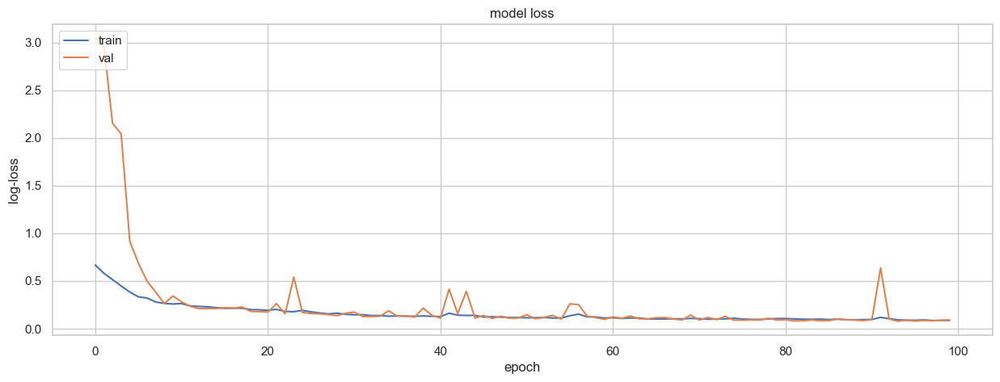

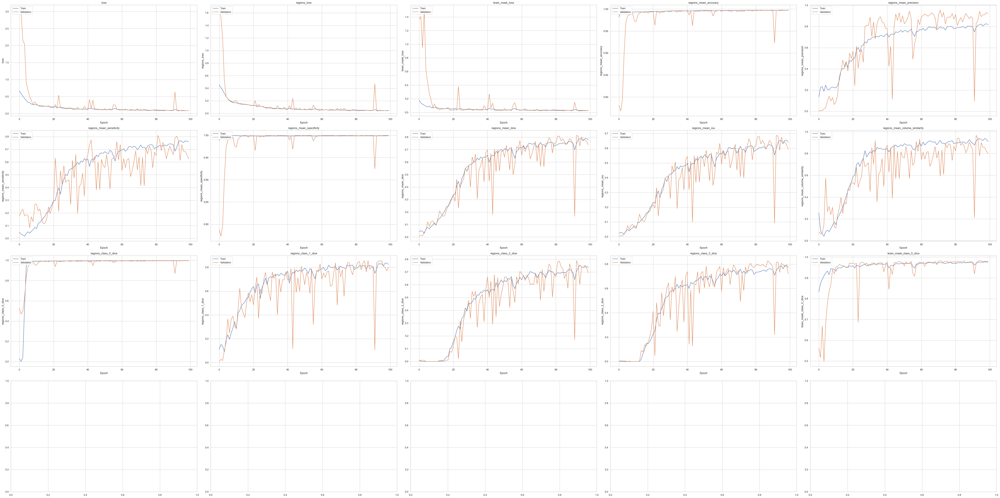

c:\Users\fmoro\SegmentationProject\SegmentationThesis\src\evaluation\inference.py:645: FutureWarning:



Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.


c:\Users\fmoro\SegmentationProject\SegmentationThesis\src\evaluation\inference.py:645: FutureWarning:



Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.


c:\Users\fmoro\SegmentationProject\SegmentationThesis\src\evaluation\inference.py:645: FutureWarning:



Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.


c:\Users\fmoro\SegmentationProject\SegmentationThesis\src\evaluation\inference.py:645: FutureWarning:



Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.


c:\Users\fmoro\SegmentationProject\S

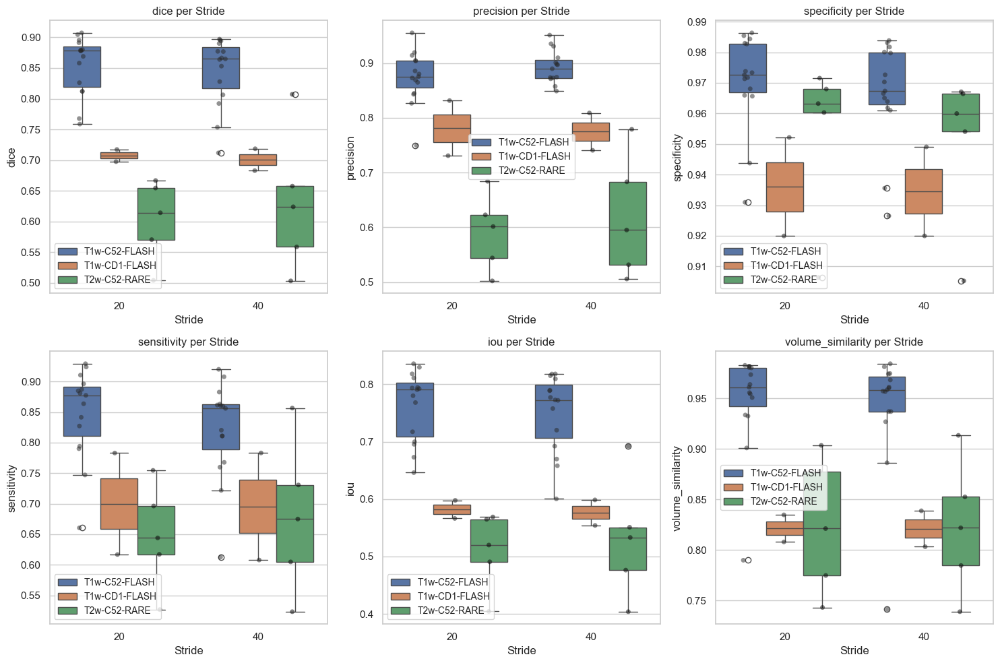

c:\Users\fmoro\SegmentationProject\SegmentationThesis\src\evaluation\inference.py:645: FutureWarning:



Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.


c:\Users\fmoro\SegmentationProject\SegmentationThesis\src\evaluation\inference.py:645: FutureWarning:



Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.


c:\Users\fmoro\SegmentationProject\SegmentationThesis\src\evaluation\inference.py:645: FutureWarning:



Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.


c:\Users\fmoro\SegmentationProject\SegmentationThesis\src\evaluation\inference.py:645: FutureWarning:



Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.


c:\Users\fmoro\SegmentationProject\S

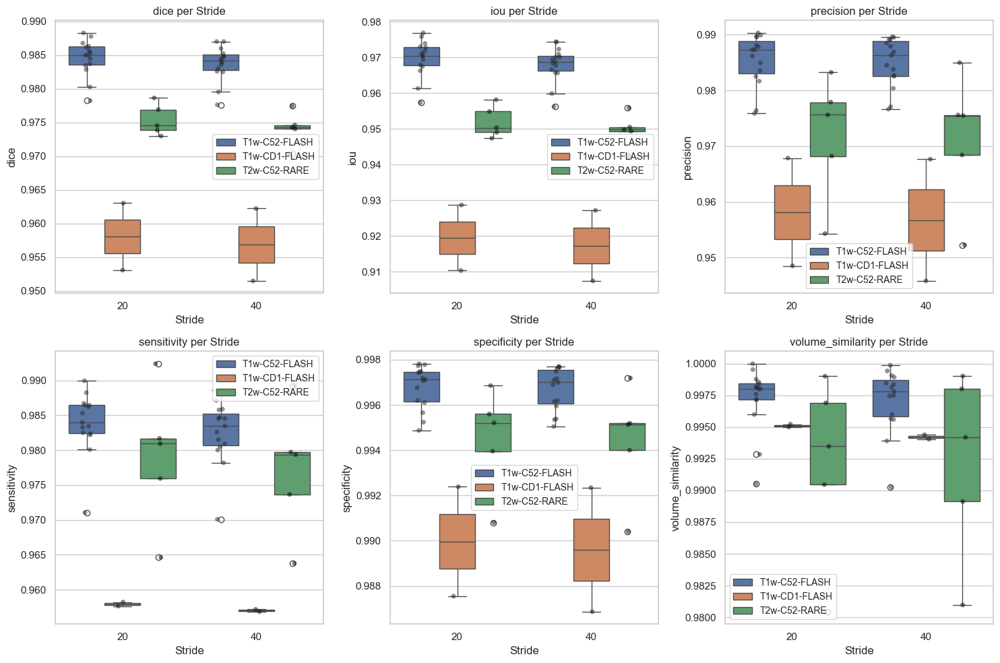

Trainig on:  270  mice
Validating on:  66  mice
Generator configuration:
- Dataset path: ..\dataset_roi
- Dimensions: (80, 80, 80)
- Batch size: 8
- Number of input channels: 1
- Number of classes: 4
- Shuffle: True

Generator configuration:
- Dataset path: ..\dataset_roi
- Dimensions: (80, 80, 80)
- Batch size: 8
- Number of input channels: 1
- Number of classes: 4
- Shuffle: True


FOLD 3
Training on 270 examples (93 unique IDs)
Unique Train IDs: ['Isch_PAL_PPIAKO_1767' 'Isch_PAL_PPIAKO_1777' 'Isch_PAL_PPIAKO_1781'
 'Isch_PAL_PPIAKO_1782' 'Isch_PAL_PPIAKO_1783' 'Isch_PAL_PPIAKO_1784'
 'Isch_PAL_PPIAKO_1785' 'Isch_PAL_PPIAKO_1789' 'Isch_PAL_PPIAKO_1790'
 'Isch_PAL_PPIAKO_1795' 'Isch_PAL_PPIAKO_1815' 'Isch_PAL_PPIAKO_1817'
 'Isch_PAL_PPIAKO_1818' 'Isch_PAL_PPIAKO_1820' 'Isch_PAL_PPIAKO_1823'
 'T1w-C52-FLASH' 'T1w-CD1-FLASH' 'T2w-C52-RARE' 'TBI_AAV_PPIAKO_1768'
 'TBI_AAV_PPIAKO_1776' 'TBI_AAV_PPIAKO_1779' 'TBI_AAV_PPIAKO_1788'
 'TBI_AAV_PPIAKO_1793' 'TBI_AAV_PPIAKO_1802' 'TBI_AAV_PPIAKO

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


33/33 [==============================] - 102s 3s/step - loss: 0.6711 - regions_loss: 0.4516 - brain_mask_loss: 0.1833 - regions_mean_accuracy: 0.9800 - regions_mean_precision: 0.1186 - regions_mean_sensitivity: 0.0550 - regions_mean_specificity: 0.9865 - regions_mean_dice: 0.0429 - regions_mean_iou: 0.0242 - regions_mean_volume_similarity: 0.2583 - regions_class_0_dice: 0.0350 - regions_class_1_dice: 0.1149 - regions_class_2_dice: 0.0113 - regions_class_3_dice: 0.0024 - brain_mask_class_0_dice: 0.8301 - val_loss: 3.8921 - val_regions_loss: 1.6351 - val_brain_mask_loss: 2.2237 - val_regions_mean_accuracy: 0.7817 - val_regions_mean_precision: 0.0063 - val_regions_mean_sensitivity: 0.2050 - val_regions_mean_specificity: 0.7866 - val_regions_mean_dice: 0.0116 - val_regions_mean_iou: 0.0058 - val_regions_mean_volume_similarity: 0.0760 - val_regions_class_0_dice: 0.5250 - val_regions_class_1_dice: 0.0238 - val_regions_class_2_dice: 0.0080 - val_regions_class_3_dice: 0.0029 - val_brain_mask_c

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


33/33 [==============================] - 91s 3s/step - loss: 0.5718 - regions_loss: 0.4087 - brain_mask_loss: 0.1320 - regions_mean_accuracy: 0.9923 - regions_mean_precision: 0.1930 - regions_mean_sensitivity: 0.0229 - regions_mean_specificity: 0.9998 - regions_mean_dice: 0.0378 - regions_mean_iou: 0.0215 - regions_mean_volume_similarity: 0.0594 - regions_class_0_dice: 0.0036 - regions_class_1_dice: 0.1132 - regions_class_2_dice: 1.0982e-04 - regions_class_3_dice: 6.2072e-06 - brain_mask_class_0_dice: 0.8824 - val_loss: 2.1199 - val_regions_loss: 1.1863 - val_brain_mask_loss: 0.9044 - val_regions_mean_accuracy: 0.8046 - val_regions_mean_precision: 0.0107 - val_regions_mean_sensitivity: 0.1662 - val_regions_mean_specificity: 0.8100 - val_regions_mean_dice: 0.0193 - val_regions_mean_iou: 0.0099 - val_regions_mean_volume_similarity: 0.0904 - val_regions_class_0_dice: 0.5681 - val_regions_class_1_dice: 0.0491 - val_regions_class_2_dice: 0.0065 - val_regions_class_3_dice: 0.0022 - val_brain

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


33/33 [==============================] - 91s 3s/step - loss: 0.5044 - regions_loss: 0.3665 - brain_mask_loss: 0.1104 - regions_mean_accuracy: 0.9926 - regions_mean_precision: 0.1968 - regions_mean_sensitivity: 0.0196 - regions_mean_specificity: 0.9999 - regions_mean_dice: 0.0335 - regions_mean_iou: 0.0189 - regions_mean_volume_similarity: 0.0481 - regions_class_0_dice: 0.0890 - regions_class_1_dice: 0.1006 - regions_class_2_dice: 9.0693e-10 - regions_class_3_dice: 1.3946e-09 - brain_mask_class_0_dice: 0.9023 - val_loss: 1.1720 - val_regions_loss: 0.4747 - val_brain_mask_loss: 0.6713 - val_regions_mean_accuracy: 0.9013 - val_regions_mean_precision: 0.0243 - val_regions_mean_sensitivity: 0.1982 - val_regions_mean_specificity: 0.9051 - val_regions_mean_dice: 0.0419 - val_regions_mean_iou: 0.0223 - val_regions_mean_volume_similarity: 0.1276 - val_regions_class_0_dice: 0.5632 - val_regions_class_1_dice: 0.1127 - val_regions_class_2_dice: 0.0116 - val_regions_class_3_dice: 0.0013 - val_brain

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


33/33 [==============================] - 93s 3s/step - loss: 0.3340 - regions_loss: 0.2314 - brain_mask_loss: 0.0803 - regions_mean_accuracy: 0.9933 - regions_mean_precision: 0.2000 - regions_mean_sensitivity: 0.0242 - regions_mean_specificity: 0.9999 - regions_mean_dice: 0.0396 - regions_mean_iou: 0.0234 - regions_mean_volume_similarity: 0.0516 - regions_class_0_dice: 0.9898 - regions_class_1_dice: 0.1187 - regions_class_2_dice: 1.0426e-09 - regions_class_3_dice: 1.5952e-09 - brain_mask_class_0_dice: 0.9308 - val_loss: 0.5749 - val_regions_loss: 0.2559 - val_brain_mask_loss: 0.2973 - val_regions_mean_accuracy: 0.9885 - val_regions_mean_precision: 0.0817 - val_regions_mean_sensitivity: 0.1311 - val_regions_mean_specificity: 0.9932 - val_regions_mean_dice: 0.0983 - val_regions_mean_iou: 0.0593 - val_regions_mean_volume_similarity: 0.4688 - val_regions_class_0_dice: 0.8983 - val_regions_class_1_dice: 0.2948 - val_regions_class_2_dice: 6.4351e-10 - val_regions_class_3_dice: 1.1566e-09 - v

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


33/33 [==============================] - 92s 3s/step - loss: 0.2987 - regions_loss: 0.2068 - brain_mask_loss: 0.0704 - regions_mean_accuracy: 0.9926 - regions_mean_precision: 0.2081 - regions_mean_sensitivity: 0.0278 - regions_mean_specificity: 0.9998 - regions_mean_dice: 0.0464 - regions_mean_iou: 0.0266 - regions_mean_volume_similarity: 0.0642 - regions_class_0_dice: 0.9895 - regions_class_1_dice: 0.1392 - regions_class_2_dice: 9.0433e-10 - regions_class_3_dice: 1.3440e-09 - brain_mask_class_0_dice: 0.9405 - val_loss: 0.3946 - val_regions_loss: 0.1970 - val_brain_mask_loss: 0.1765 - val_regions_mean_accuracy: 0.9913 - val_regions_mean_precision: 0.1457 - val_regions_mean_sensitivity: 0.1427 - val_regions_mean_specificity: 0.9968 - val_regions_mean_dice: 0.1409 - val_regions_mean_iou: 0.0920 - val_regions_mean_volume_similarity: 0.2884 - val_regions_class_0_dice: 0.9736 - val_regions_class_1_dice: 0.4228 - val_regions_class_2_dice: 8.3739e-10 - val_regions_class_3_dice: 1.1010e-09 - v

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


33/33 [==============================] - 91s 3s/step - loss: 0.2765 - regions_loss: 0.1911 - brain_mask_loss: 0.0646 - regions_mean_accuracy: 0.9923 - regions_mean_precision: 0.1988 - regions_mean_sensitivity: 0.0479 - regions_mean_specificity: 0.9997 - regions_mean_dice: 0.0722 - regions_mean_iou: 0.0441 - regions_mean_volume_similarity: 0.0973 - regions_class_0_dice: 0.9887 - regions_class_1_dice: 0.2165 - regions_class_2_dice: 8.7659e-10 - regions_class_3_dice: 1.3162e-09 - brain_mask_class_0_dice: 0.9473 - val_loss: 0.3794 - val_regions_loss: 0.1858 - val_brain_mask_loss: 0.1731 - val_regions_mean_accuracy: 0.9924 - val_regions_mean_precision: 0.1821 - val_regions_mean_sensitivity: 0.1176 - val_regions_mean_specificity: 0.9985 - val_regions_mean_dice: 0.1366 - val_regions_mean_iou: 0.0906 - val_regions_mean_volume_similarity: 0.2438 - val_regions_class_0_dice: 0.9839 - val_regions_class_1_dice: 0.4099 - val_regions_class_2_dice: 7.4159e-10 - val_regions_class_3_dice: 1.0346e-09 - v

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


33/33 [==============================] - 90s 3s/step - loss: 0.2444 - regions_loss: 0.1663 - brain_mask_loss: 0.0580 - regions_mean_accuracy: 0.9939 - regions_mean_precision: 0.2294 - regions_mean_sensitivity: 0.0729 - regions_mean_specificity: 0.9995 - regions_mean_dice: 0.0934 - regions_mean_iou: 0.0614 - regions_mean_volume_similarity: 0.1351 - regions_class_0_dice: 0.9910 - regions_class_1_dice: 0.2802 - regions_class_2_dice: 1.0901e-09 - regions_class_3_dice: 1.5776e-09 - brain_mask_class_0_dice: 0.9509 - val_loss: 0.2602 - val_regions_loss: 0.1637 - val_brain_mask_loss: 0.0768 - val_regions_mean_accuracy: 0.9873 - val_regions_mean_precision: 0.0996 - val_regions_mean_sensitivity: 0.2221 - val_regions_mean_specificity: 0.9906 - val_regions_mean_dice: 0.1358 - val_regions_mean_iou: 0.0878 - val_regions_mean_volume_similarity: 0.2041 - val_regions_class_0_dice: 0.9797 - val_regions_class_1_dice: 0.4074 - val_regions_class_2_dice: 8.9801e-10 - val_regions_class_3_dice: 1.2074e-09 - v

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


33/33 [==============================] - 93s 3s/step - loss: 0.2407 - regions_loss: 0.1569 - brain_mask_loss: 0.0644 - regions_mean_accuracy: 0.9927 - regions_mean_precision: 0.2710 - regions_mean_sensitivity: 0.1208 - regions_mean_specificity: 0.9985 - regions_mean_dice: 0.1409 - regions_mean_iou: 0.0923 - regions_mean_volume_similarity: 0.2430 - regions_class_0_dice: 0.9892 - regions_class_1_dice: 0.4074 - regions_class_2_dice: 0.0152 - regions_class_3_dice: 1.3991e-09 - brain_mask_class_0_dice: 0.9441 - val_loss: 0.2503 - val_regions_loss: 0.1548 - val_brain_mask_loss: 0.0758 - val_regions_mean_accuracy: 0.9927 - val_regions_mean_precision: 0.3170 - val_regions_mean_sensitivity: 0.1435 - val_regions_mean_specificity: 0.9975 - val_regions_mean_dice: 0.1679 - val_regions_mean_iou: 0.1038 - val_regions_mean_volume_similarity: 0.3381 - val_regions_class_0_dice: 0.9873 - val_regions_class_1_dice: 0.4175 - val_regions_class_2_dice: 0.0861 - val_regions_class_3_dice: 1.1399e-09 - val_brain

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


33/33 [==============================] - 91s 3s/step - loss: 0.2282 - regions_loss: 0.1524 - brain_mask_loss: 0.0560 - regions_mean_accuracy: 0.9932 - regions_mean_precision: 0.2946 - regions_mean_sensitivity: 0.1497 - regions_mean_specificity: 0.9983 - regions_mean_dice: 0.1724 - regions_mean_iou: 0.1134 - regions_mean_volume_similarity: 0.3057 - regions_class_0_dice: 0.9900 - regions_class_1_dice: 0.4622 - regions_class_2_dice: 0.0550 - regions_class_3_dice: 1.5263e-09 - brain_mask_class_0_dice: 0.9528 - val_loss: 0.2174 - val_regions_loss: 0.1429 - val_brain_mask_loss: 0.0550 - val_regions_mean_accuracy: 0.9938 - val_regions_mean_precision: 0.3124 - val_regions_mean_sensitivity: 0.1705 - val_regions_mean_specificity: 0.9985 - val_regions_mean_dice: 0.2066 - val_regions_mean_iou: 0.1378 - val_regions_mean_volume_similarity: 0.3786 - val_regions_class_0_dice: 0.9910 - val_regions_class_1_dice: 0.5217 - val_regions_class_2_dice: 0.0982 - val_regions_class_3_dice: 1.0279e-09 - val_brain

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


33/33 [==============================] - 89s 3s/step - loss: 0.2090 - regions_loss: 0.1430 - brain_mask_loss: 0.0468 - regions_mean_accuracy: 0.9940 - regions_mean_precision: 0.3928 - regions_mean_sensitivity: 0.1924 - regions_mean_specificity: 0.9983 - regions_mean_dice: 0.2218 - regions_mean_iou: 0.1497 - regions_mean_volume_similarity: 0.3937 - regions_class_0_dice: 0.9912 - regions_class_1_dice: 0.5565 - regions_class_2_dice: 0.0996 - regions_class_3_dice: 0.0093 - brain_mask_class_0_dice: 0.9606 - val_loss: 0.2109 - val_regions_loss: 0.1390 - val_brain_mask_loss: 0.0530 - val_regions_mean_accuracy: 0.9947 - val_regions_mean_precision: 0.5095 - val_regions_mean_sensitivity: 0.1586 - val_regions_mean_specificity: 0.9993 - val_regions_mean_dice: 0.2238 - val_regions_mean_iou: 0.1424 - val_regions_mean_volume_similarity: 0.3668 - val_regions_class_0_dice: 0.9923 - val_regions_class_1_dice: 0.5031 - val_regions_class_2_dice: 0.0825 - val_regions_class_3_dice: 0.0857 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


33/33 [==============================] - 93s 3s/step - loss: 0.2036 - regions_loss: 0.1390 - brain_mask_loss: 0.0458 - regions_mean_accuracy: 0.9940 - regions_mean_precision: 0.4823 - regions_mean_sensitivity: 0.2106 - regions_mean_specificity: 0.9984 - regions_mean_dice: 0.2467 - regions_mean_iou: 0.1695 - regions_mean_volume_similarity: 0.4015 - regions_class_0_dice: 0.9914 - regions_class_1_dice: 0.5900 - regions_class_2_dice: 0.0938 - regions_class_3_dice: 0.0562 - brain_mask_class_0_dice: 0.9618 - val_loss: 0.2012 - val_regions_loss: 0.1296 - val_brain_mask_loss: 0.0528 - val_regions_mean_accuracy: 0.9942 - val_regions_mean_precision: 0.5154 - val_regions_mean_sensitivity: 0.2137 - val_regions_mean_specificity: 0.9993 - val_regions_mean_dice: 0.2905 - val_regions_mean_iou: 0.1922 - val_regions_mean_volume_similarity: 0.4794 - val_regions_class_0_dice: 0.9920 - val_regions_class_1_dice: 0.5850 - val_regions_class_2_dice: 0.1692 - val_regions_class_3_dice: 0.1174 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


33/33 [==============================] - 90s 3s/step - loss: 0.2030 - regions_loss: 0.1357 - brain_mask_loss: 0.0485 - regions_mean_accuracy: 0.9943 - regions_mean_precision: 0.4660 - regions_mean_sensitivity: 0.2347 - regions_mean_specificity: 0.9983 - regions_mean_dice: 0.2700 - regions_mean_iou: 0.1806 - regions_mean_volume_similarity: 0.4563 - regions_class_0_dice: 0.9917 - regions_class_1_dice: 0.5777 - regions_class_2_dice: 0.1360 - regions_class_3_dice: 0.0964 - brain_mask_class_0_dice: 0.9578 - val_loss: 0.1857 - val_regions_loss: 0.1244 - val_brain_mask_loss: 0.0425 - val_regions_mean_accuracy: 0.9950 - val_regions_mean_precision: 0.5548 - val_regions_mean_sensitivity: 0.2399 - val_regions_mean_specificity: 0.9993 - val_regions_mean_dice: 0.3267 - val_regions_mean_iou: 0.2160 - val_regions_mean_volume_similarity: 0.5419 - val_regions_class_0_dice: 0.9931 - val_regions_class_1_dice: 0.6040 - val_regions_class_2_dice: 0.1975 - val_regions_class_3_dice: 0.1785 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


33/33 [==============================] - 91s 3s/step - loss: 0.2032 - regions_loss: 0.1284 - brain_mask_loss: 0.0558 - regions_mean_accuracy: 0.9948 - regions_mean_precision: 0.5209 - regions_mean_sensitivity: 0.2818 - regions_mean_specificity: 0.9986 - regions_mean_dice: 0.3278 - regions_mean_iou: 0.2176 - regions_mean_volume_similarity: 0.5662 - regions_class_0_dice: 0.9926 - regions_class_1_dice: 0.5818 - regions_class_2_dice: 0.2581 - regions_class_3_dice: 0.1435 - brain_mask_class_0_dice: 0.9508 - val_loss: 0.1835 - val_regions_loss: 0.1141 - val_brain_mask_loss: 0.0501 - val_regions_mean_accuracy: 0.9947 - val_regions_mean_precision: 0.5066 - val_regions_mean_sensitivity: 0.3633 - val_regions_mean_specificity: 0.9979 - val_regions_mean_dice: 0.4046 - val_regions_mean_iou: 0.2793 - val_regions_mean_volume_similarity: 0.7151 - val_regions_class_0_dice: 0.9928 - val_regions_class_1_dice: 0.6800 - val_regions_class_2_dice: 0.2920 - val_regions_class_3_dice: 0.2418 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


33/33 [==============================] - 89s 3s/step - loss: 0.1832 - regions_loss: 0.1219 - brain_mask_loss: 0.0422 - regions_mean_accuracy: 0.9945 - regions_mean_precision: 0.5083 - regions_mean_sensitivity: 0.3154 - regions_mean_specificity: 0.9982 - regions_mean_dice: 0.3595 - regions_mean_iou: 0.2447 - regions_mean_volume_similarity: 0.6260 - regions_class_0_dice: 0.9921 - regions_class_1_dice: 0.6394 - regions_class_2_dice: 0.2942 - regions_class_3_dice: 0.1450 - brain_mask_class_0_dice: 0.9655 - val_loss: 0.1814 - val_regions_loss: 0.1133 - val_brain_mask_loss: 0.0491 - val_regions_mean_accuracy: 0.9944 - val_regions_mean_precision: 0.5435 - val_regions_mean_sensitivity: 0.4438 - val_regions_mean_specificity: 0.9978 - val_regions_mean_dice: 0.4504 - val_regions_mean_iou: 0.3104 - val_regions_mean_volume_similarity: 0.7286 - val_regions_class_0_dice: 0.9935 - val_regions_class_1_dice: 0.6939 - val_regions_class_2_dice: 0.3242 - val_regions_class_3_dice: 0.3330 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


33/33 [==============================] - 90s 3s/step - loss: 0.1811 - regions_loss: 0.1183 - brain_mask_loss: 0.0438 - regions_mean_accuracy: 0.9945 - regions_mean_precision: 0.5308 - regions_mean_sensitivity: 0.3492 - regions_mean_specificity: 0.9981 - regions_mean_dice: 0.3874 - regions_mean_iou: 0.2657 - regions_mean_volume_similarity: 0.6528 - regions_class_0_dice: 0.9920 - regions_class_1_dice: 0.6530 - regions_class_2_dice: 0.3296 - regions_class_3_dice: 0.1796 - brain_mask_class_0_dice: 0.9631 - val_loss: 0.1649 - val_regions_loss: 0.1044 - val_brain_mask_loss: 0.0417 - val_regions_mean_accuracy: 0.9952 - val_regions_mean_precision: 0.5583 - val_regions_mean_sensitivity: 0.4337 - val_regions_mean_specificity: 0.9983 - val_regions_mean_dice: 0.4688 - val_regions_mean_iou: 0.3396 - val_regions_mean_volume_similarity: 0.7836 - val_regions_class_0_dice: 0.9932 - val_regions_class_1_dice: 0.7537 - val_regions_class_2_dice: 0.3361 - val_regions_class_3_dice: 0.3165 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


33/33 [==============================] - 92s 3s/step - loss: 0.1594 - regions_loss: 0.0979 - brain_mask_loss: 0.0420 - regions_mean_accuracy: 0.9947 - regions_mean_precision: 0.6577 - regions_mean_sensitivity: 0.4808 - regions_mean_specificity: 0.9983 - regions_mean_dice: 0.5240 - regions_mean_iou: 0.3707 - regions_mean_volume_similarity: 0.7696 - regions_class_0_dice: 0.9925 - regions_class_1_dice: 0.6919 - regions_class_2_dice: 0.4246 - regions_class_3_dice: 0.4556 - brain_mask_class_0_dice: 0.9658 - val_loss: 0.1492 - val_regions_loss: 0.0847 - val_brain_mask_loss: 0.0450 - val_regions_mean_accuracy: 0.9955 - val_regions_mean_precision: 0.6659 - val_regions_mean_sensitivity: 0.5987 - val_regions_mean_specificity: 0.9984 - val_regions_mean_dice: 0.6199 - val_regions_mean_iou: 0.4590 - val_regions_mean_volume_similarity: 0.8705 - val_regions_class_0_dice: 0.9939 - val_regions_class_1_dice: 0.7394 - val_regions_class_2_dice: 0.5030 - val_regions_class_3_dice: 0.6173 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


33/33 [==============================] - 89s 3s/step - loss: 0.1543 - regions_loss: 0.0870 - brain_mask_loss: 0.0451 - regions_mean_accuracy: 0.9956 - regions_mean_precision: 0.6763 - regions_mean_sensitivity: 0.5407 - regions_mean_specificity: 0.9985 - regions_mean_dice: 0.5669 - regions_mean_iou: 0.4112 - regions_mean_volume_similarity: 0.7898 - regions_class_0_dice: 0.9936 - regions_class_1_dice: 0.7145 - regions_class_2_dice: 0.4536 - regions_class_3_dice: 0.5326 - brain_mask_class_0_dice: 0.9614 - val_loss: 0.1448 - val_regions_loss: 0.0809 - val_brain_mask_loss: 0.0419 - val_regions_mean_accuracy: 0.9945 - val_regions_mean_precision: 0.5223 - val_regions_mean_sensitivity: 0.7540 - val_regions_mean_specificity: 0.9962 - val_regions_mean_dice: 0.5970 - val_regions_mean_iou: 0.4349 - val_regions_mean_volume_similarity: 0.7921 - val_regions_class_0_dice: 0.9920 - val_regions_class_1_dice: 0.7278 - val_regions_class_2_dice: 0.5506 - val_regions_class_3_dice: 0.5126 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


33/33 [==============================] - 89s 3s/step - loss: 0.1416 - regions_loss: 0.0803 - brain_mask_loss: 0.0396 - regions_mean_accuracy: 0.9957 - regions_mean_precision: 0.6902 - regions_mean_sensitivity: 0.5720 - regions_mean_specificity: 0.9984 - regions_mean_dice: 0.6014 - regions_mean_iou: 0.4417 - regions_mean_volume_similarity: 0.8250 - regions_class_0_dice: 0.9937 - regions_class_1_dice: 0.7257 - regions_class_2_dice: 0.5087 - regions_class_3_dice: 0.5697 - brain_mask_class_0_dice: 0.9670 - val_loss: 0.1378 - val_regions_loss: 0.0715 - val_brain_mask_loss: 0.0448 - val_regions_mean_accuracy: 0.9958 - val_regions_mean_precision: 0.7825 - val_regions_mean_sensitivity: 0.5256 - val_regions_mean_specificity: 0.9993 - val_regions_mean_dice: 0.6197 - val_regions_mean_iou: 0.4551 - val_regions_mean_volume_similarity: 0.7941 - val_regions_class_0_dice: 0.9938 - val_regions_class_1_dice: 0.6812 - val_regions_class_2_dice: 0.5372 - val_regions_class_3_dice: 0.6407 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


33/33 [==============================] - 93s 3s/step - loss: 0.1312 - regions_loss: 0.0733 - brain_mask_loss: 0.0372 - regions_mean_accuracy: 0.9958 - regions_mean_precision: 0.7229 - regions_mean_sensitivity: 0.6021 - regions_mean_specificity: 0.9984 - regions_mean_dice: 0.6407 - regions_mean_iou: 0.4808 - regions_mean_volume_similarity: 0.8507 - regions_class_0_dice: 0.9938 - regions_class_1_dice: 0.7568 - regions_class_2_dice: 0.5421 - regions_class_3_dice: 0.6231 - brain_mask_class_0_dice: 0.9698 - val_loss: 0.1372 - val_regions_loss: 0.0637 - val_brain_mask_loss: 0.0530 - val_regions_mean_accuracy: 0.9962 - val_regions_mean_precision: 0.7722 - val_regions_mean_sensitivity: 0.6061 - val_regions_mean_specificity: 0.9991 - val_regions_mean_dice: 0.6699 - val_regions_mean_iou: 0.5104 - val_regions_mean_volume_similarity: 0.8573 - val_regions_class_0_dice: 0.9946 - val_regions_class_1_dice: 0.7281 - val_regions_class_2_dice: 0.5766 - val_regions_class_3_dice: 0.7049 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


33/33 [==============================] - 92s 3s/step - loss: 0.1289 - regions_loss: 0.0722 - brain_mask_loss: 0.0369 - regions_mean_accuracy: 0.9960 - regions_mean_precision: 0.7187 - regions_mean_sensitivity: 0.6150 - regions_mean_specificity: 0.9985 - regions_mean_dice: 0.6380 - regions_mean_iou: 0.4789 - regions_mean_volume_similarity: 0.8322 - regions_class_0_dice: 0.9942 - regions_class_1_dice: 0.7360 - regions_class_2_dice: 0.5640 - regions_class_3_dice: 0.6141 - brain_mask_class_0_dice: 0.9695 - val_loss: 0.1318 - val_regions_loss: 0.0637 - val_brain_mask_loss: 0.0484 - val_regions_mean_accuracy: 0.9958 - val_regions_mean_precision: 0.7582 - val_regions_mean_sensitivity: 0.6486 - val_regions_mean_specificity: 0.9990 - val_regions_mean_dice: 0.6843 - val_regions_mean_iou: 0.5282 - val_regions_mean_volume_similarity: 0.8798 - val_regions_class_0_dice: 0.9942 - val_regions_class_1_dice: 0.7089 - val_regions_class_2_dice: 0.6162 - val_regions_class_3_dice: 0.7279 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


33/33 [==============================] - 89s 3s/step - loss: 0.1240 - regions_loss: 0.0669 - brain_mask_loss: 0.0374 - regions_mean_accuracy: 0.9967 - regions_mean_precision: 0.7381 - regions_mean_sensitivity: 0.6268 - regions_mean_specificity: 0.9987 - regions_mean_dice: 0.6642 - regions_mean_iou: 0.5043 - regions_mean_volume_similarity: 0.8633 - regions_class_0_dice: 0.9952 - regions_class_1_dice: 0.7534 - regions_class_2_dice: 0.6080 - regions_class_3_dice: 0.6311 - brain_mask_class_0_dice: 0.9679 - val_loss: 0.1241 - val_regions_loss: 0.0625 - val_brain_mask_loss: 0.0418 - val_regions_mean_accuracy: 0.9966 - val_regions_mean_precision: 0.8632 - val_regions_mean_sensitivity: 0.5514 - val_regions_mean_specificity: 0.9996 - val_regions_mean_dice: 0.6588 - val_regions_mean_iou: 0.5000 - val_regions_mean_volume_similarity: 0.7658 - val_regions_class_0_dice: 0.9950 - val_regions_class_1_dice: 0.6770 - val_regions_class_2_dice: 0.5658 - val_regions_class_3_dice: 0.7335 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


33/33 [==============================] - 90s 3s/step - loss: 0.1306 - regions_loss: 0.0677 - brain_mask_loss: 0.0405 - regions_mean_accuracy: 0.9962 - regions_mean_precision: 0.7284 - regions_mean_sensitivity: 0.6379 - regions_mean_specificity: 0.9985 - regions_mean_dice: 0.6583 - regions_mean_iou: 0.5010 - regions_mean_volume_similarity: 0.8431 - regions_class_0_dice: 0.9945 - regions_class_1_dice: 0.7461 - regions_class_2_dice: 0.5955 - regions_class_3_dice: 0.6335 - brain_mask_class_0_dice: 0.9656 - val_loss: 0.1234 - val_regions_loss: 0.0612 - val_brain_mask_loss: 0.0400 - val_regions_mean_accuracy: 0.9959 - val_regions_mean_precision: 0.6936 - val_regions_mean_sensitivity: 0.6812 - val_regions_mean_specificity: 0.9981 - val_regions_mean_dice: 0.6811 - val_regions_mean_iou: 0.5215 - val_regions_mean_volume_similarity: 0.9190 - val_regions_class_0_dice: 0.9940 - val_regions_class_1_dice: 0.7464 - val_regions_class_2_dice: 0.6331 - val_regions_class_3_dice: 0.6637 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


33/33 [==============================] - 91s 3s/step - loss: 0.1261 - regions_loss: 0.0650 - brain_mask_loss: 0.0391 - regions_mean_accuracy: 0.9963 - regions_mean_precision: 0.7403 - regions_mean_sensitivity: 0.6397 - regions_mean_specificity: 0.9986 - regions_mean_dice: 0.6707 - regions_mean_iou: 0.5127 - regions_mean_volume_similarity: 0.8590 - regions_class_0_dice: 0.9947 - regions_class_1_dice: 0.7685 - regions_class_2_dice: 0.5876 - regions_class_3_dice: 0.6561 - brain_mask_class_0_dice: 0.9675 - val_loss: 0.1163 - val_regions_loss: 0.0577 - val_brain_mask_loss: 0.0367 - val_regions_mean_accuracy: 0.9966 - val_regions_mean_precision: 0.8167 - val_regions_mean_sensitivity: 0.6197 - val_regions_mean_specificity: 0.9986 - val_regions_mean_dice: 0.6858 - val_regions_mean_iou: 0.5351 - val_regions_mean_volume_similarity: 0.8333 - val_regions_class_0_dice: 0.9950 - val_regions_class_1_dice: 0.7925 - val_regions_class_2_dice: 0.5988 - val_regions_class_3_dice: 0.6660 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


33/33 [==============================] - 88s 3s/step - loss: 0.1196 - regions_loss: 0.0623 - brain_mask_loss: 0.0357 - regions_mean_accuracy: 0.9966 - regions_mean_precision: 0.7465 - regions_mean_sensitivity: 0.6573 - regions_mean_specificity: 0.9987 - regions_mean_dice: 0.6856 - regions_mean_iou: 0.5309 - regions_mean_volume_similarity: 0.8782 - regions_class_0_dice: 0.9952 - regions_class_1_dice: 0.7766 - regions_class_2_dice: 0.6195 - regions_class_3_dice: 0.6608 - brain_mask_class_0_dice: 0.9699 - val_loss: 0.1124 - val_regions_loss: 0.0508 - val_brain_mask_loss: 0.0403 - val_regions_mean_accuracy: 0.9966 - val_regions_mean_precision: 0.8258 - val_regions_mean_sensitivity: 0.6746 - val_regions_mean_specificity: 0.9990 - val_regions_mean_dice: 0.7384 - val_regions_mean_iou: 0.5897 - val_regions_mean_volume_similarity: 0.8924 - val_regions_class_0_dice: 0.9949 - val_regions_class_1_dice: 0.8029 - val_regions_class_2_dice: 0.6681 - val_regions_class_3_dice: 0.7443 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


33/33 [==============================] - 93s 3s/step - loss: 0.1118 - regions_loss: 0.0564 - brain_mask_loss: 0.0361 - regions_mean_accuracy: 0.9966 - regions_mean_precision: 0.7761 - regions_mean_sensitivity: 0.6918 - regions_mean_specificity: 0.9987 - regions_mean_dice: 0.7195 - regions_mean_iou: 0.5688 - regions_mean_volume_similarity: 0.8934 - regions_class_0_dice: 0.9952 - regions_class_1_dice: 0.7978 - regions_class_2_dice: 0.6589 - regions_class_3_dice: 0.7017 - brain_mask_class_0_dice: 0.9699 - val_loss: 0.1034 - val_regions_loss: 0.0514 - val_brain_mask_loss: 0.0328 - val_regions_mean_accuracy: 0.9965 - val_regions_mean_precision: 0.7878 - val_regions_mean_sensitivity: 0.7168 - val_regions_mean_specificity: 0.9987 - val_regions_mean_dice: 0.7456 - val_regions_mean_iou: 0.5970 - val_regions_mean_volume_similarity: 0.9225 - val_regions_class_0_dice: 0.9951 - val_regions_class_1_dice: 0.7873 - val_regions_class_2_dice: 0.6989 - val_regions_class_3_dice: 0.7507 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


33/33 [==============================] - 90s 3s/step - loss: 0.1060 - regions_loss: 0.0548 - brain_mask_loss: 0.0326 - regions_mean_accuracy: 0.9969 - regions_mean_precision: 0.7714 - regions_mean_sensitivity: 0.7050 - regions_mean_specificity: 0.9987 - regions_mean_dice: 0.7241 - regions_mean_iou: 0.5737 - regions_mean_volume_similarity: 0.8893 - regions_class_0_dice: 0.9956 - regions_class_1_dice: 0.7899 - regions_class_2_dice: 0.6640 - regions_class_3_dice: 0.7184 - brain_mask_class_0_dice: 0.9724 - val_loss: 0.1032 - val_regions_loss: 0.0487 - val_brain_mask_loss: 0.0360 - val_regions_mean_accuracy: 0.9969 - val_regions_mean_precision: 0.8701 - val_regions_mean_sensitivity: 0.6554 - val_regions_mean_specificity: 0.9992 - val_regions_mean_dice: 0.7441 - val_regions_mean_iou: 0.5960 - val_regions_mean_volume_similarity: 0.8562 - val_regions_class_0_dice: 0.9956 - val_regions_class_1_dice: 0.7781 - val_regions_class_2_dice: 0.7112 - val_regions_class_3_dice: 0.7431 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


33/33 [==============================] - 91s 3s/step - loss: 0.1031 - regions_loss: 0.0525 - brain_mask_loss: 0.0327 - regions_mean_accuracy: 0.9969 - regions_mean_precision: 0.7945 - regions_mean_sensitivity: 0.7099 - regions_mean_specificity: 0.9987 - regions_mean_dice: 0.7371 - regions_mean_iou: 0.5910 - regions_mean_volume_similarity: 0.8938 - regions_class_0_dice: 0.9956 - regions_class_1_dice: 0.8004 - regions_class_2_dice: 0.6905 - regions_class_3_dice: 0.7206 - brain_mask_class_0_dice: 0.9728 - val_loss: 0.1022 - val_regions_loss: 0.0484 - val_brain_mask_loss: 0.0360 - val_regions_mean_accuracy: 0.9972 - val_regions_mean_precision: 0.7354 - val_regions_mean_sensitivity: 0.7948 - val_regions_mean_specificity: 0.9987 - val_regions_mean_dice: 0.7583 - val_regions_mean_iou: 0.6143 - val_regions_mean_volume_similarity: 0.9191 - val_regions_class_0_dice: 0.9961 - val_regions_class_1_dice: 0.8282 - val_regions_class_2_dice: 0.7065 - val_regions_class_3_dice: 0.7401 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


33/33 [==============================] - 93s 3s/step - loss: 0.1081 - regions_loss: 0.0546 - brain_mask_loss: 0.0355 - regions_mean_accuracy: 0.9968 - regions_mean_precision: 0.7729 - regions_mean_sensitivity: 0.7023 - regions_mean_specificity: 0.9987 - regions_mean_dice: 0.7229 - regions_mean_iou: 0.5719 - regions_mean_volume_similarity: 0.8848 - regions_class_0_dice: 0.9954 - regions_class_1_dice: 0.7861 - regions_class_2_dice: 0.6673 - regions_class_3_dice: 0.7153 - brain_mask_class_0_dice: 0.9698 - val_loss: 0.0996 - val_regions_loss: 0.0483 - val_brain_mask_loss: 0.0333 - val_regions_mean_accuracy: 0.9967 - val_regions_mean_precision: 0.7378 - val_regions_mean_sensitivity: 0.8045 - val_regions_mean_specificity: 0.9981 - val_regions_mean_dice: 0.7676 - val_regions_mean_iou: 0.6257 - val_regions_mean_volume_similarity: 0.9426 - val_regions_class_0_dice: 0.9954 - val_regions_class_1_dice: 0.8034 - val_regions_class_2_dice: 0.7117 - val_regions_class_3_dice: 0.7877 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


33/33 [==============================] - 91s 3s/step - loss: 0.1046 - regions_loss: 0.0536 - brain_mask_loss: 0.0332 - regions_mean_accuracy: 0.9966 - regions_mean_precision: 0.7886 - regions_mean_sensitivity: 0.7049 - regions_mean_specificity: 0.9987 - regions_mean_dice: 0.7311 - regions_mean_iou: 0.5821 - regions_mean_volume_similarity: 0.8869 - regions_class_0_dice: 0.9951 - regions_class_1_dice: 0.7998 - regions_class_2_dice: 0.6716 - regions_class_3_dice: 0.7220 - brain_mask_class_0_dice: 0.9728 - val_loss: 0.0900 - val_regions_loss: 0.0415 - val_brain_mask_loss: 0.0307 - val_regions_mean_accuracy: 0.9974 - val_regions_mean_precision: 0.7908 - val_regions_mean_sensitivity: 0.7989 - val_regions_mean_specificity: 0.9986 - val_regions_mean_dice: 0.7908 - val_regions_mean_iou: 0.6567 - val_regions_mean_volume_similarity: 0.9407 - val_regions_class_0_dice: 0.9965 - val_regions_class_1_dice: 0.8294 - val_regions_class_2_dice: 0.7434 - val_regions_class_3_dice: 0.7997 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


33/33 [==============================] - 91s 3s/step - loss: 0.0895 - regions_loss: 0.0439 - brain_mask_loss: 0.0286 - regions_mean_accuracy: 0.9974 - regions_mean_precision: 0.8202 - regions_mean_sensitivity: 0.7544 - regions_mean_specificity: 0.9989 - regions_mean_dice: 0.7809 - regions_mean_iou: 0.6437 - regions_mean_volume_similarity: 0.9277 - regions_class_0_dice: 0.9963 - regions_class_1_dice: 0.8293 - regions_class_2_dice: 0.7393 - regions_class_3_dice: 0.7742 - brain_mask_class_0_dice: 0.9760 - val_loss: 0.0881 - val_regions_loss: 0.0419 - val_brain_mask_loss: 0.0293 - val_regions_mean_accuracy: 0.9973 - val_regions_mean_precision: 0.8752 - val_regions_mean_sensitivity: 0.7243 - val_regions_mean_specificity: 0.9992 - val_regions_mean_dice: 0.7867 - val_regions_mean_iou: 0.6527 - val_regions_mean_volume_similarity: 0.8983 - val_regions_class_0_dice: 0.9962 - val_regions_class_1_dice: 0.8380 - val_regions_class_2_dice: 0.7204 - val_regions_class_3_dice: 0.8018 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


33/33 [==============================] - 94s 3s/step - loss: 0.0870 - regions_loss: 0.0442 - brain_mask_loss: 0.0272 - regions_mean_accuracy: 0.9974 - regions_mean_precision: 0.8134 - regions_mean_sensitivity: 0.7532 - regions_mean_specificity: 0.9989 - regions_mean_dice: 0.7764 - regions_mean_iou: 0.6386 - regions_mean_volume_similarity: 0.9243 - regions_class_0_dice: 0.9964 - regions_class_1_dice: 0.8200 - regions_class_2_dice: 0.7409 - regions_class_3_dice: 0.7684 - brain_mask_class_0_dice: 0.9769 - val_loss: 0.0872 - val_regions_loss: 0.0407 - val_brain_mask_loss: 0.0310 - val_regions_mean_accuracy: 0.9975 - val_regions_mean_precision: 0.8687 - val_regions_mean_sensitivity: 0.7247 - val_regions_mean_specificity: 0.9992 - val_regions_mean_dice: 0.7874 - val_regions_mean_iou: 0.6532 - val_regions_mean_volume_similarity: 0.9072 - val_regions_class_0_dice: 0.9964 - val_regions_class_1_dice: 0.8313 - val_regions_class_2_dice: 0.7462 - val_regions_class_3_dice: 0.7847 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_3\assets


33/33 [==============================] - 91s 3s/step - loss: 0.0862 - regions_loss: 0.0438 - brain_mask_loss: 0.0271 - regions_mean_accuracy: 0.9974 - regions_mean_precision: 0.8207 - regions_mean_sensitivity: 0.7607 - regions_mean_specificity: 0.9990 - regions_mean_dice: 0.7813 - regions_mean_iou: 0.6455 - regions_mean_volume_similarity: 0.9165 - regions_class_0_dice: 0.9963 - regions_class_1_dice: 0.8243 - regions_class_2_dice: 0.7423 - regions_class_3_dice: 0.7772 - brain_mask_class_0_dice: 0.9771 - val_loss: 0.0841 - val_regions_loss: 0.0406 - val_brain_mask_loss: 0.0283 - val_regions_mean_accuracy: 0.9974 - val_regions_mean_precision: 0.8076 - val_regions_mean_sensitivity: 0.7915 - val_regions_mean_specificity: 0.9989 - val_regions_mean_dice: 0.7974 - val_regions_mean_iou: 0.6665 - val_regions_mean_volume_similarity: 0.9621 - val_regions_class_0_dice: 0.9963 - val_regions_class_1_dice: 0.8386 - val_regions_class_2_dice: 0.7450 - val_regions_class_3_dice: 0.8087 - val_brain_mask_cl

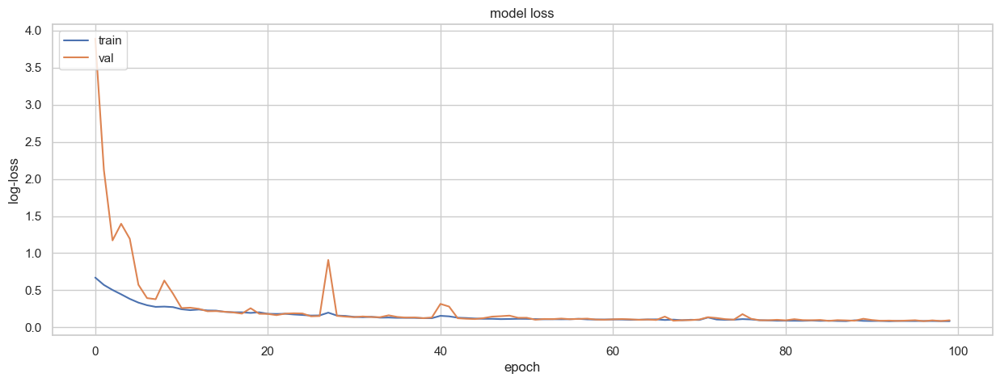

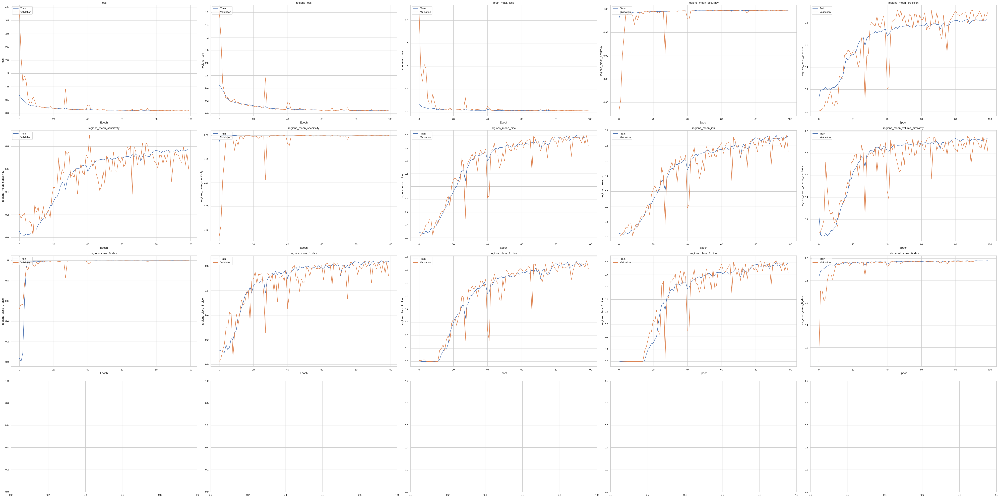

c:\Users\fmoro\SegmentationProject\SegmentationThesis\src\evaluation\inference.py:645: FutureWarning:



Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.


c:\Users\fmoro\SegmentationProject\SegmentationThesis\src\evaluation\inference.py:645: FutureWarning:



Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.


c:\Users\fmoro\SegmentationProject\SegmentationThesis\src\evaluation\inference.py:645: FutureWarning:



Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.


c:\Users\fmoro\SegmentationProject\SegmentationThesis\src\evaluation\inference.py:645: FutureWarning:



Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.


c:\Users\fmoro\SegmentationProject\S

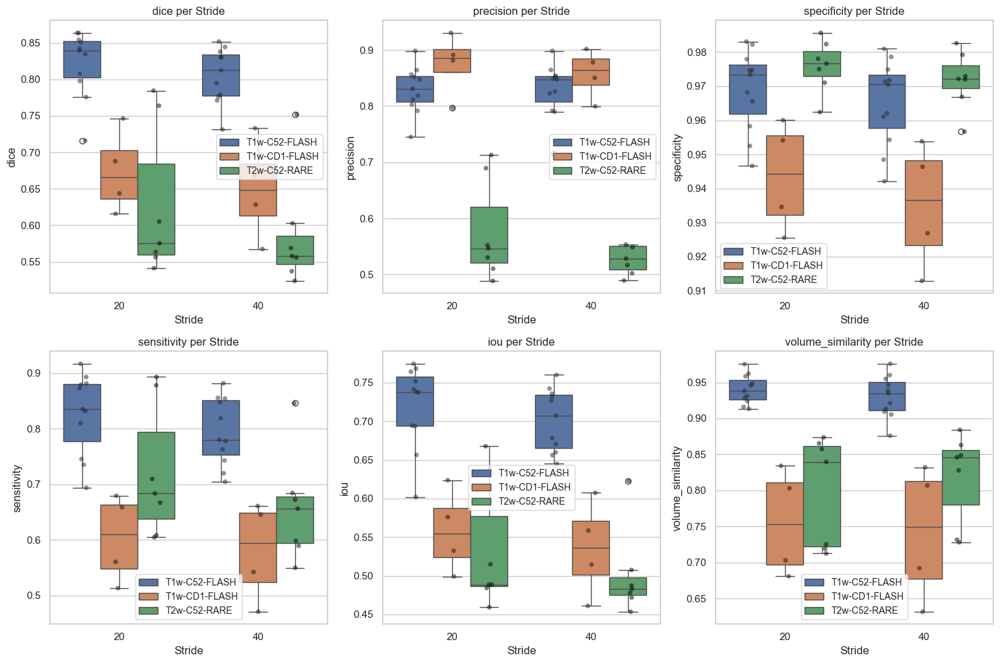

c:\Users\fmoro\SegmentationProject\SegmentationThesis\src\evaluation\inference.py:645: FutureWarning:



Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.


c:\Users\fmoro\SegmentationProject\SegmentationThesis\src\evaluation\inference.py:645: FutureWarning:



Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.


c:\Users\fmoro\SegmentationProject\SegmentationThesis\src\evaluation\inference.py:645: FutureWarning:



Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.


c:\Users\fmoro\SegmentationProject\SegmentationThesis\src\evaluation\inference.py:645: FutureWarning:



Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.


c:\Users\fmoro\SegmentationProject\S

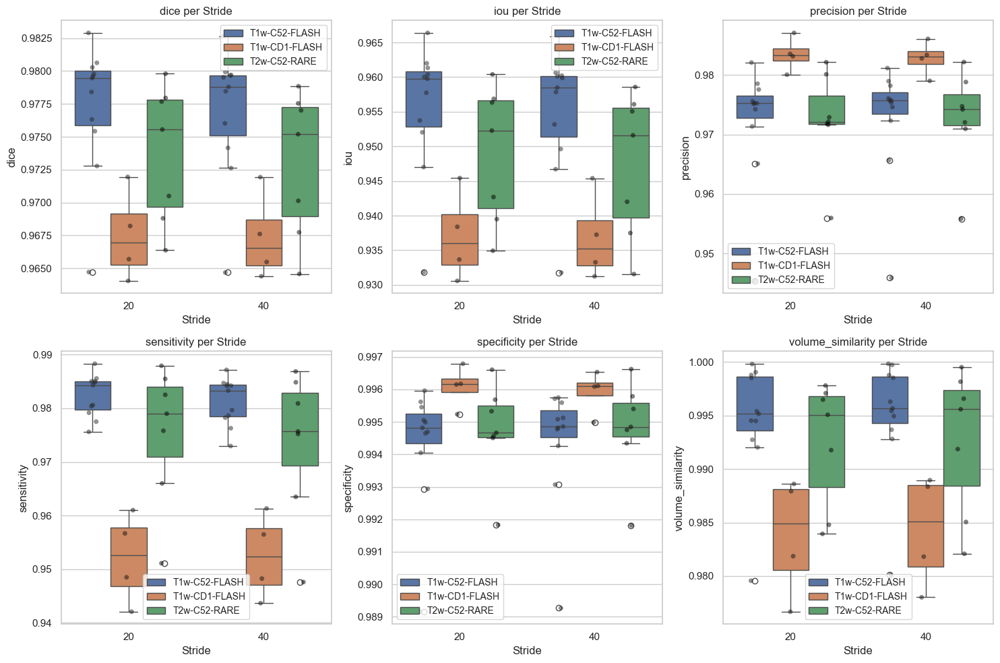

Trainig on:  270  mice
Validating on:  66  mice
Generator configuration:
- Dataset path: ..\dataset_roi
- Dimensions: (80, 80, 80)
- Batch size: 8
- Number of input channels: 1
- Number of classes: 4
- Shuffle: True

Generator configuration:
- Dataset path: ..\dataset_roi
- Dimensions: (80, 80, 80)
- Batch size: 8
- Number of input channels: 1
- Number of classes: 4
- Shuffle: True


FOLD 4
Training on 270 examples (93 unique IDs)
Unique Train IDs: ['Isch_PAL_PPIAKO_1767' 'Isch_PAL_PPIAKO_1782' 'Isch_PAL_PPIAKO_1783'
 'Isch_PAL_PPIAKO_1784' 'Isch_PAL_PPIAKO_1785' 'Isch_PAL_PPIAKO_1789'
 'Isch_PAL_PPIAKO_1790' 'Isch_PAL_PPIAKO_1795' 'Isch_PAL_PPIAKO_1815'
 'Isch_PAL_PPIAKO_1817' 'Isch_PAL_PPIAKO_1818' 'Isch_PAL_PPIAKO_1820'
 'T1w-C52-FLASH' 'T1w-CD1-FLASH' 'T2w-C52-RARE' 'TBI_AAV_PPIAKO_1768'
 'TBI_AAV_PPIAKO_1776' 'TBI_AAV_PPIAKO_1779' 'TBI_AAV_PPIAKO_1788'
 'TBI_AAV_PPIAKO_1793' 'TBI_AAV_PPIAKO_1807' 'TBI_AAV_PPIAKO_1810'
 'TBI_AAV_PPIAKO_1811' 'TBI_AAV_PPIAKO_1824' 'TBI_AAV_PPIAKO_18

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


33/33 [==============================] - 101s 3s/step - loss: 0.6730 - regions_loss: 0.4546 - brain_mask_loss: 0.1813 - regions_mean_accuracy: 0.9777 - regions_mean_precision: 0.0828 - regions_mean_sensitivity: 0.0363 - regions_mean_specificity: 0.9842 - regions_mean_dice: 0.0142 - regions_mean_iou: 0.0072 - regions_mean_volume_similarity: 0.2584 - regions_class_0_dice: 0.0344 - regions_class_1_dice: 0.0179 - regions_class_2_dice: 0.0228 - regions_class_3_dice: 0.0019 - brain_mask_class_0_dice: 0.8322 - val_loss: 3.4023 - val_regions_loss: 2.1913 - val_brain_mask_loss: 1.1762 - val_regions_mean_accuracy: 0.7036 - val_regions_mean_precision: 0.0086 - val_regions_mean_sensitivity: 0.3087 - val_regions_mean_specificity: 0.7069 - val_regions_mean_dice: 0.0163 - val_regions_mean_iou: 0.0083 - val_regions_mean_volume_similarity: 0.0540 - val_regions_class_0_dice: 0.2149 - val_regions_class_1_dice: 0.0388 - val_regions_class_2_dice: 0.0058 - val_regions_class_3_dice: 0.0044 - val_brain_mask_c

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


33/33 [==============================] - 93s 3s/step - loss: 0.4448 - regions_loss: 0.3215 - brain_mask_loss: 0.0951 - regions_mean_accuracy: 0.9921 - regions_mean_precision: 0.1839 - regions_mean_sensitivity: 0.0077 - regions_mean_specificity: 1.0000 - regions_mean_dice: 0.0144 - regions_mean_iou: 0.0076 - regions_mean_volume_similarity: 0.0196 - regions_class_0_dice: 0.4821 - regions_class_1_dice: 0.0431 - regions_class_2_dice: 5.4777e-06 - regions_class_3_dice: 1.2270e-09 - brain_mask_class_0_dice: 0.9211 - val_loss: 1.4697 - val_regions_loss: 0.5582 - val_brain_mask_loss: 0.8845 - val_regions_mean_accuracy: 0.8692 - val_regions_mean_precision: 0.0505 - val_regions_mean_sensitivity: 0.3311 - val_regions_mean_specificity: 0.8745 - val_regions_mean_dice: 0.0556 - val_regions_mean_iou: 0.0306 - val_regions_mean_volume_similarity: 0.5701 - val_regions_class_0_dice: 0.5230 - val_regions_class_1_dice: 0.1517 - val_regions_class_2_dice: 0.0147 - val_regions_class_3_dice: 3.1695e-04 - val_b

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


33/33 [==============================] - 89s 3s/step - loss: 0.3162 - regions_loss: 0.2137 - brain_mask_loss: 0.0787 - regions_mean_accuracy: 0.9924 - regions_mean_precision: 0.1715 - regions_mean_sensitivity: 0.0195 - regions_mean_specificity: 0.9999 - regions_mean_dice: 0.0324 - regions_mean_iou: 0.0187 - regions_mean_volume_similarity: 0.0451 - regions_class_0_dice: 0.9893 - regions_class_1_dice: 0.0973 - regions_class_2_dice: 1.1780e-09 - regions_class_3_dice: 1.5224e-09 - brain_mask_class_0_dice: 0.9318 - val_loss: 0.9326 - val_regions_loss: 0.2113 - val_brain_mask_loss: 0.6979 - val_regions_mean_accuracy: 0.9903 - val_regions_mean_precision: 0.1100 - val_regions_mean_sensitivity: 0.1037 - val_regions_mean_specificity: 0.9956 - val_regions_mean_dice: 0.1054 - val_regions_mean_iou: 0.0644 - val_regions_mean_volume_similarity: 0.5451 - val_regions_class_0_dice: 0.9672 - val_regions_class_1_dice: 0.3149 - val_regions_class_2_dice: 0.0014 - val_regions_class_3_dice: 1.2801e-09 - val_b

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


33/33 [==============================] - 89s 3s/step - loss: 0.2898 - regions_loss: 0.1959 - brain_mask_loss: 0.0710 - regions_mean_accuracy: 0.9931 - regions_mean_precision: 0.2104 - regions_mean_sensitivity: 0.0332 - regions_mean_specificity: 0.9999 - regions_mean_dice: 0.0547 - regions_mean_iou: 0.0319 - regions_mean_volume_similarity: 0.0707 - regions_class_0_dice: 0.9901 - regions_class_1_dice: 0.1640 - regions_class_2_dice: 1.0092e-09 - regions_class_3_dice: 1.4081e-09 - brain_mask_class_0_dice: 0.9391 - val_loss: 0.3709 - val_regions_loss: 0.1893 - val_brain_mask_loss: 0.1591 - val_regions_mean_accuracy: 0.9916 - val_regions_mean_precision: 0.1753 - val_regions_mean_sensitivity: 0.0886 - val_regions_mean_specificity: 0.9984 - val_regions_mean_dice: 0.1148 - val_regions_mean_iou: 0.0708 - val_regions_mean_volume_similarity: 0.2192 - val_regions_class_0_dice: 0.9844 - val_regions_class_1_dice: 0.3443 - val_regions_class_2_dice: 8.6100e-10 - val_regions_class_3_dice: 1.2969e-09 - v

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


33/33 [==============================] - 89s 3s/step - loss: 0.2672 - regions_loss: 0.1850 - brain_mask_loss: 0.0603 - regions_mean_accuracy: 0.9930 - regions_mean_precision: 0.1872 - regions_mean_sensitivity: 0.0426 - regions_mean_specificity: 0.9998 - regions_mean_dice: 0.0647 - regions_mean_iou: 0.0396 - regions_mean_volume_similarity: 0.0856 - regions_class_0_dice: 0.9899 - regions_class_1_dice: 0.1942 - regions_class_2_dice: 9.4278e-10 - regions_class_3_dice: 1.4218e-09 - brain_mask_class_0_dice: 0.9502 - val_loss: 0.2857 - val_regions_loss: 0.1772 - val_brain_mask_loss: 0.0871 - val_regions_mean_accuracy: 0.9931 - val_regions_mean_precision: 0.2245 - val_regions_mean_sensitivity: 0.0830 - val_regions_mean_specificity: 0.9994 - val_regions_mean_dice: 0.1170 - val_regions_mean_iou: 0.0732 - val_regions_mean_volume_similarity: 0.1735 - val_regions_class_0_dice: 0.9904 - val_regions_class_1_dice: 0.3510 - val_regions_class_2_dice: 8.0943e-10 - val_regions_class_3_dice: 1.2229e-09 - v

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


33/33 [==============================] - 92s 3s/step - loss: 0.2528 - regions_loss: 0.1781 - brain_mask_loss: 0.0536 - regions_mean_accuracy: 0.9924 - regions_mean_precision: 0.2117 - regions_mean_sensitivity: 0.0456 - regions_mean_specificity: 0.9997 - regions_mean_dice: 0.0710 - regions_mean_iou: 0.0424 - regions_mean_volume_similarity: 0.0961 - regions_class_0_dice: 0.9891 - regions_class_1_dice: 0.2130 - regions_class_2_dice: 8.8777e-10 - regions_class_3_dice: 1.2797e-09 - brain_mask_class_0_dice: 0.9561 - val_loss: 0.2608 - val_regions_loss: 0.1692 - val_brain_mask_loss: 0.0710 - val_regions_mean_accuracy: 0.9938 - val_regions_mean_precision: 0.2743 - val_regions_mean_sensitivity: 0.1041 - val_regions_mean_specificity: 0.9993 - val_regions_mean_dice: 0.1342 - val_regions_mean_iou: 0.0872 - val_regions_mean_volume_similarity: 0.2006 - val_regions_class_0_dice: 0.9913 - val_regions_class_1_dice: 0.4022 - val_regions_class_2_dice: 4.3297e-04 - val_regions_class_3_dice: 2.4139e-09 - v

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


33/33 [==============================] - 88s 3s/step - loss: 0.2422 - regions_loss: 0.1628 - brain_mask_loss: 0.0587 - regions_mean_accuracy: 0.9933 - regions_mean_precision: 0.3127 - regions_mean_sensitivity: 0.0755 - regions_mean_specificity: 0.9996 - regions_mean_dice: 0.1100 - regions_mean_iou: 0.0672 - regions_mean_volume_similarity: 0.1852 - regions_class_0_dice: 0.9903 - regions_class_1_dice: 0.2786 - regions_class_2_dice: 0.0515 - regions_class_3_dice: 1.3965e-09 - brain_mask_class_0_dice: 0.9495 - val_loss: 0.2305 - val_regions_loss: 0.1565 - val_brain_mask_loss: 0.0537 - val_regions_mean_accuracy: 0.9927 - val_regions_mean_precision: 0.4010 - val_regions_mean_sensitivity: 0.1255 - val_regions_mean_specificity: 0.9991 - val_regions_mean_dice: 0.1787 - val_regions_mean_iou: 0.1114 - val_regions_mean_volume_similarity: 0.2976 - val_regions_class_0_dice: 0.9897 - val_regions_class_1_dice: 0.3884 - val_regions_class_2_dice: 0.1476 - val_regions_class_3_dice: 1.1883e-04 - val_brain

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


33/33 [==============================] - 87s 3s/step - loss: 0.2159 - regions_loss: 0.1482 - brain_mask_loss: 0.0482 - regions_mean_accuracy: 0.9928 - regions_mean_precision: 0.3568 - regions_mean_sensitivity: 0.1641 - regions_mean_specificity: 0.9984 - regions_mean_dice: 0.2041 - regions_mean_iou: 0.1288 - regions_mean_volume_similarity: 0.3786 - regions_class_0_dice: 0.9894 - regions_class_1_dice: 0.4198 - regions_class_2_dice: 0.1921 - regions_class_3_dice: 2.9385e-04 - brain_mask_class_0_dice: 0.9603 - val_loss: 0.2113 - val_regions_loss: 0.1439 - val_brain_mask_loss: 0.0482 - val_regions_mean_accuracy: 0.9937 - val_regions_mean_precision: 0.4406 - val_regions_mean_sensitivity: 0.1254 - val_regions_mean_specificity: 0.9992 - val_regions_mean_dice: 0.1788 - val_regions_mean_iou: 0.1086 - val_regions_mean_volume_similarity: 0.3621 - val_regions_class_0_dice: 0.9908 - val_regions_class_1_dice: 0.3728 - val_regions_class_2_dice: 0.1504 - val_regions_class_3_dice: 0.0133 - val_brain_mas

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


33/33 [==============================] - 90s 3s/step - loss: 0.1945 - regions_loss: 0.1299 - brain_mask_loss: 0.0451 - regions_mean_accuracy: 0.9937 - regions_mean_precision: 0.4972 - regions_mean_sensitivity: 0.2956 - regions_mean_specificity: 0.9980 - regions_mean_dice: 0.3378 - regions_mean_iou: 0.2217 - regions_mean_volume_similarity: 0.6072 - regions_class_0_dice: 0.9909 - regions_class_1_dice: 0.5623 - regions_class_2_dice: 0.2996 - regions_class_3_dice: 0.1515 - brain_mask_class_0_dice: 0.9623 - val_loss: 0.2092 - val_regions_loss: 0.1352 - val_brain_mask_loss: 0.0547 - val_regions_mean_accuracy: 0.9940 - val_regions_mean_precision: 0.5743 - val_regions_mean_sensitivity: 0.1598 - val_regions_mean_specificity: 0.9996 - val_regions_mean_dice: 0.2389 - val_regions_mean_iou: 0.1406 - val_regions_mean_volume_similarity: 0.4612 - val_regions_class_0_dice: 0.9910 - val_regions_class_1_dice: 0.3455 - val_regions_class_2_dice: 0.2060 - val_regions_class_3_dice: 0.1651 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


33/33 [==============================] - 90s 3s/step - loss: 0.1964 - regions_loss: 0.1234 - brain_mask_loss: 0.0536 - regions_mean_accuracy: 0.9940 - regions_mean_precision: 0.5420 - regions_mean_sensitivity: 0.3295 - regions_mean_specificity: 0.9981 - regions_mean_dice: 0.3667 - regions_mean_iou: 0.2401 - regions_mean_volume_similarity: 0.6245 - regions_class_0_dice: 0.9914 - regions_class_1_dice: 0.5568 - regions_class_2_dice: 0.3239 - regions_class_3_dice: 0.2196 - brain_mask_class_0_dice: 0.9540 - val_loss: 0.1823 - val_regions_loss: 0.1149 - val_brain_mask_loss: 0.0480 - val_regions_mean_accuracy: 0.9932 - val_regions_mean_precision: 0.4823 - val_regions_mean_sensitivity: 0.4175 - val_regions_mean_specificity: 0.9967 - val_regions_mean_dice: 0.4067 - val_regions_mean_iou: 0.2755 - val_regions_mean_volume_similarity: 0.7196 - val_regions_class_0_dice: 0.9899 - val_regions_class_1_dice: 0.6457 - val_regions_class_2_dice: 0.3119 - val_regions_class_3_dice: 0.2625 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


33/33 [==============================] - 86s 3s/step - loss: 0.1771 - regions_loss: 0.1101 - brain_mask_loss: 0.0472 - regions_mean_accuracy: 0.9945 - regions_mean_precision: 0.6274 - regions_mean_sensitivity: 0.4105 - regions_mean_specificity: 0.9982 - regions_mean_dice: 0.4623 - regions_mean_iou: 0.3171 - regions_mean_volume_similarity: 0.7205 - regions_class_0_dice: 0.9919 - regions_class_1_dice: 0.6449 - regions_class_2_dice: 0.3738 - regions_class_3_dice: 0.3681 - brain_mask_class_0_dice: 0.9612 - val_loss: 0.1580 - val_regions_loss: 0.0932 - val_brain_mask_loss: 0.0451 - val_regions_mean_accuracy: 0.9947 - val_regions_mean_precision: 0.5804 - val_regions_mean_sensitivity: 0.5250 - val_regions_mean_specificity: 0.9974 - val_regions_mean_dice: 0.5366 - val_regions_mean_iou: 0.3797 - val_regions_mean_volume_similarity: 0.8696 - val_regions_class_0_dice: 0.9925 - val_regions_class_1_dice: 0.7051 - val_regions_class_2_dice: 0.4685 - val_regions_class_3_dice: 0.4363 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


33/33 [==============================] - 89s 3s/step - loss: 0.1693 - regions_loss: 0.1055 - brain_mask_loss: 0.0441 - regions_mean_accuracy: 0.9945 - regions_mean_precision: 0.6272 - regions_mean_sensitivity: 0.4444 - regions_mean_specificity: 0.9982 - regions_mean_dice: 0.4753 - regions_mean_iou: 0.3287 - regions_mean_volume_similarity: 0.7157 - regions_class_0_dice: 0.9920 - regions_class_1_dice: 0.6614 - regions_class_2_dice: 0.3746 - regions_class_3_dice: 0.3899 - brain_mask_class_0_dice: 0.9641 - val_loss: 0.1491 - val_regions_loss: 0.0857 - val_brain_mask_loss: 0.0437 - val_regions_mean_accuracy: 0.9957 - val_regions_mean_precision: 0.7150 - val_regions_mean_sensitivity: 0.4913 - val_regions_mean_specificity: 0.9990 - val_regions_mean_dice: 0.5741 - val_regions_mean_iou: 0.4143 - val_regions_mean_volume_similarity: 0.8012 - val_regions_class_0_dice: 0.9940 - val_regions_class_1_dice: 0.7136 - val_regions_class_2_dice: 0.4789 - val_regions_class_3_dice: 0.5297 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


33/33 [==============================] - 91s 3s/step - loss: 0.1553 - regions_loss: 0.0920 - brain_mask_loss: 0.0435 - regions_mean_accuracy: 0.9953 - regions_mean_precision: 0.6587 - regions_mean_sensitivity: 0.5146 - regions_mean_specificity: 0.9984 - regions_mean_dice: 0.5487 - regions_mean_iou: 0.3902 - regions_mean_volume_similarity: 0.7946 - regions_class_0_dice: 0.9931 - regions_class_1_dice: 0.6794 - regions_class_2_dice: 0.4424 - regions_class_3_dice: 0.5241 - brain_mask_class_0_dice: 0.9639 - val_loss: 0.1415 - val_regions_loss: 0.0756 - val_brain_mask_loss: 0.0461 - val_regions_mean_accuracy: 0.9958 - val_regions_mean_precision: 0.6673 - val_regions_mean_sensitivity: 0.6084 - val_regions_mean_specificity: 0.9983 - val_regions_mean_dice: 0.6230 - val_regions_mean_iou: 0.4587 - val_regions_mean_volume_similarity: 0.8714 - val_regions_class_0_dice: 0.9939 - val_regions_class_1_dice: 0.7298 - val_regions_class_2_dice: 0.5713 - val_regions_class_3_dice: 0.5678 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


33/33 [==============================] - 88s 3s/step - loss: 0.1489 - regions_loss: 0.0840 - brain_mask_loss: 0.0452 - regions_mean_accuracy: 0.9957 - regions_mean_precision: 0.6906 - regions_mean_sensitivity: 0.5446 - regions_mean_specificity: 0.9985 - regions_mean_dice: 0.5836 - regions_mean_iou: 0.4258 - regions_mean_volume_similarity: 0.8045 - regions_class_0_dice: 0.9937 - regions_class_1_dice: 0.7103 - regions_class_2_dice: 0.4670 - regions_class_3_dice: 0.5733 - brain_mask_class_0_dice: 0.9623 - val_loss: 0.1398 - val_regions_loss: 0.0747 - val_brain_mask_loss: 0.0454 - val_regions_mean_accuracy: 0.9963 - val_regions_mean_precision: 0.6798 - val_regions_mean_sensitivity: 0.6340 - val_regions_mean_specificity: 0.9984 - val_regions_mean_dice: 0.6468 - val_regions_mean_iou: 0.4886 - val_regions_mean_volume_similarity: 0.9084 - val_regions_class_0_dice: 0.9948 - val_regions_class_1_dice: 0.7172 - val_regions_class_2_dice: 0.6072 - val_regions_class_3_dice: 0.6160 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


33/33 [==============================] - 89s 3s/step - loss: 0.1412 - regions_loss: 0.0783 - brain_mask_loss: 0.0428 - regions_mean_accuracy: 0.9958 - regions_mean_precision: 0.6944 - regions_mean_sensitivity: 0.5796 - regions_mean_specificity: 0.9985 - regions_mean_dice: 0.6078 - regions_mean_iou: 0.4492 - regions_mean_volume_similarity: 0.8292 - regions_class_0_dice: 0.9939 - regions_class_1_dice: 0.7111 - regions_class_2_dice: 0.5248 - regions_class_3_dice: 0.5874 - brain_mask_class_0_dice: 0.9635 - val_loss: 0.1355 - val_regions_loss: 0.0754 - val_brain_mask_loss: 0.0399 - val_regions_mean_accuracy: 0.9956 - val_regions_mean_precision: 0.7860 - val_regions_mean_sensitivity: 0.4774 - val_regions_mean_specificity: 0.9992 - val_regions_mean_dice: 0.5838 - val_regions_mean_iou: 0.4203 - val_regions_mean_volume_similarity: 0.7493 - val_regions_class_0_dice: 0.9937 - val_regions_class_1_dice: 0.7095 - val_regions_class_2_dice: 0.5269 - val_regions_class_3_dice: 0.5150 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


33/33 [==============================] - 90s 3s/step - loss: 0.1324 - regions_loss: 0.0729 - brain_mask_loss: 0.0396 - regions_mean_accuracy: 0.9961 - regions_mean_precision: 0.7157 - regions_mean_sensitivity: 0.6151 - regions_mean_specificity: 0.9986 - regions_mean_dice: 0.6354 - regions_mean_iou: 0.4775 - regions_mean_volume_similarity: 0.8289 - regions_class_0_dice: 0.9943 - regions_class_1_dice: 0.7410 - regions_class_2_dice: 0.5354 - regions_class_3_dice: 0.6298 - brain_mask_class_0_dice: 0.9669 - val_loss: 0.1247 - val_regions_loss: 0.0643 - val_brain_mask_loss: 0.0407 - val_regions_mean_accuracy: 0.9964 - val_regions_mean_precision: 0.7864 - val_regions_mean_sensitivity: 0.5808 - val_regions_mean_specificity: 0.9989 - val_regions_mean_dice: 0.6599 - val_regions_mean_iou: 0.5008 - val_regions_mean_volume_similarity: 0.8361 - val_regions_class_0_dice: 0.9948 - val_regions_class_1_dice: 0.7696 - val_regions_class_2_dice: 0.5609 - val_regions_class_3_dice: 0.6491 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


33/33 [==============================] - 91s 3s/step - loss: 0.1267 - regions_loss: 0.0690 - brain_mask_loss: 0.0381 - regions_mean_accuracy: 0.9963 - regions_mean_precision: 0.7299 - regions_mean_sensitivity: 0.6226 - regions_mean_specificity: 0.9986 - regions_mean_dice: 0.6479 - regions_mean_iou: 0.4907 - regions_mean_volume_similarity: 0.8421 - regions_class_0_dice: 0.9946 - regions_class_1_dice: 0.7585 - regions_class_2_dice: 0.5468 - regions_class_3_dice: 0.6386 - brain_mask_class_0_dice: 0.9683 - val_loss: 0.1145 - val_regions_loss: 0.0652 - val_brain_mask_loss: 0.0299 - val_regions_mean_accuracy: 0.9963 - val_regions_mean_precision: 0.6522 - val_regions_mean_sensitivity: 0.7257 - val_regions_mean_specificity: 0.9980 - val_regions_mean_dice: 0.6798 - val_regions_mean_iou: 0.5207 - val_regions_mean_volume_similarity: 0.9034 - val_regions_class_0_dice: 0.9949 - val_regions_class_1_dice: 0.7731 - val_regions_class_2_dice: 0.6143 - val_regions_class_3_dice: 0.6521 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


33/33 [==============================] - 90s 3s/step - loss: 0.1172 - regions_loss: 0.0611 - brain_mask_loss: 0.0367 - regions_mean_accuracy: 0.9964 - regions_mean_precision: 0.7541 - regions_mean_sensitivity: 0.6598 - regions_mean_specificity: 0.9986 - regions_mean_dice: 0.6911 - regions_mean_iou: 0.5353 - regions_mean_volume_similarity: 0.8730 - regions_class_0_dice: 0.9948 - regions_class_1_dice: 0.7611 - regions_class_2_dice: 0.6313 - regions_class_3_dice: 0.6810 - brain_mask_class_0_dice: 0.9700 - val_loss: 0.1072 - val_regions_loss: 0.0535 - val_brain_mask_loss: 0.0343 - val_regions_mean_accuracy: 0.9966 - val_regions_mean_precision: 0.7506 - val_regions_mean_sensitivity: 0.7162 - val_regions_mean_specificity: 0.9984 - val_regions_mean_dice: 0.7290 - val_regions_mean_iou: 0.5790 - val_regions_mean_volume_similarity: 0.9430 - val_regions_class_0_dice: 0.9952 - val_regions_class_1_dice: 0.8053 - val_regions_class_2_dice: 0.6683 - val_regions_class_3_dice: 0.7133 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


33/33 [==============================] - 90s 3s/step - loss: 0.1118 - regions_loss: 0.0575 - brain_mask_loss: 0.0355 - regions_mean_accuracy: 0.9968 - regions_mean_precision: 0.7602 - regions_mean_sensitivity: 0.6852 - regions_mean_specificity: 0.9987 - regions_mean_dice: 0.7070 - regions_mean_iou: 0.5551 - regions_mean_volume_similarity: 0.8813 - regions_class_0_dice: 0.9954 - regions_class_1_dice: 0.7899 - regions_class_2_dice: 0.6371 - regions_class_3_dice: 0.6940 - brain_mask_class_0_dice: 0.9702 - val_loss: 0.1071 - val_regions_loss: 0.0560 - val_brain_mask_loss: 0.0325 - val_regions_mean_accuracy: 0.9967 - val_regions_mean_precision: 0.7985 - val_regions_mean_sensitivity: 0.6898 - val_regions_mean_specificity: 0.9985 - val_regions_mean_dice: 0.7330 - val_regions_mean_iou: 0.5834 - val_regions_mean_volume_similarity: 0.9066 - val_regions_class_0_dice: 0.9954 - val_regions_class_1_dice: 0.8011 - val_regions_class_2_dice: 0.7034 - val_regions_class_3_dice: 0.6945 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


33/33 [==============================] - 88s 3s/step - loss: 0.0953 - regions_loss: 0.0486 - brain_mask_loss: 0.0291 - regions_mean_accuracy: 0.9970 - regions_mean_precision: 0.8085 - regions_mean_sensitivity: 0.7289 - regions_mean_specificity: 0.9988 - regions_mean_dice: 0.7621 - regions_mean_iou: 0.6202 - regions_mean_volume_similarity: 0.9286 - regions_class_0_dice: 0.9958 - regions_class_1_dice: 0.8232 - regions_class_2_dice: 0.7139 - regions_class_3_dice: 0.7493 - brain_mask_class_0_dice: 0.9760 - val_loss: 0.1053 - val_regions_loss: 0.0502 - val_brain_mask_loss: 0.0377 - val_regions_mean_accuracy: 0.9969 - val_regions_mean_precision: 0.8992 - val_regions_mean_sensitivity: 0.6250 - val_regions_mean_specificity: 0.9994 - val_regions_mean_dice: 0.7286 - val_regions_mean_iou: 0.5829 - val_regions_mean_volume_similarity: 0.8110 - val_regions_class_0_dice: 0.9956 - val_regions_class_1_dice: 0.8387 - val_regions_class_2_dice: 0.6268 - val_regions_class_3_dice: 0.7202 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


33/33 [==============================] - 93s 3s/step - loss: 0.0984 - regions_loss: 0.0500 - brain_mask_loss: 0.0313 - regions_mean_accuracy: 0.9968 - regions_mean_precision: 0.7979 - regions_mean_sensitivity: 0.7247 - regions_mean_specificity: 0.9987 - regions_mean_dice: 0.7524 - regions_mean_iou: 0.6088 - regions_mean_volume_similarity: 0.9100 - regions_class_0_dice: 0.9955 - regions_class_1_dice: 0.8093 - regions_class_2_dice: 0.6958 - regions_class_3_dice: 0.7521 - brain_mask_class_0_dice: 0.9742 - val_loss: 0.1023 - val_regions_loss: 0.0482 - val_brain_mask_loss: 0.0370 - val_regions_mean_accuracy: 0.9968 - val_regions_mean_precision: 0.7957 - val_regions_mean_sensitivity: 0.7470 - val_regions_mean_specificity: 0.9987 - val_regions_mean_dice: 0.7680 - val_regions_mean_iou: 0.6272 - val_regions_mean_volume_similarity: 0.9540 - val_regions_class_0_dice: 0.9956 - val_regions_class_1_dice: 0.8240 - val_regions_class_2_dice: 0.7133 - val_regions_class_3_dice: 0.7666 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


33/33 [==============================] - 95s 3s/step - loss: 0.0951 - regions_loss: 0.0494 - brain_mask_loss: 0.0288 - regions_mean_accuracy: 0.9969 - regions_mean_precision: 0.7988 - regions_mean_sensitivity: 0.7299 - regions_mean_specificity: 0.9988 - regions_mean_dice: 0.7577 - regions_mean_iou: 0.6147 - regions_mean_volume_similarity: 0.9227 - regions_class_0_dice: 0.9956 - regions_class_1_dice: 0.8164 - regions_class_2_dice: 0.7150 - regions_class_3_dice: 0.7415 - brain_mask_class_0_dice: 0.9765 - val_loss: 0.0946 - val_regions_loss: 0.0479 - val_brain_mask_loss: 0.0299 - val_regions_mean_accuracy: 0.9970 - val_regions_mean_precision: 0.8635 - val_regions_mean_sensitivity: 0.6875 - val_regions_mean_specificity: 0.9990 - val_regions_mean_dice: 0.7611 - val_regions_mean_iou: 0.6185 - val_regions_mean_volume_similarity: 0.8807 - val_regions_class_0_dice: 0.9958 - val_regions_class_1_dice: 0.8151 - val_regions_class_2_dice: 0.7235 - val_regions_class_3_dice: 0.7446 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


33/33 [==============================] - 88s 3s/step - loss: 0.0888 - regions_loss: 0.0460 - brain_mask_loss: 0.0274 - regions_mean_accuracy: 0.9972 - regions_mean_precision: 0.8166 - regions_mean_sensitivity: 0.7412 - regions_mean_specificity: 0.9989 - regions_mean_dice: 0.7712 - regions_mean_iou: 0.6313 - regions_mean_volume_similarity: 0.9236 - regions_class_0_dice: 0.9961 - regions_class_1_dice: 0.8235 - regions_class_2_dice: 0.7279 - regions_class_3_dice: 0.7623 - brain_mask_class_0_dice: 0.9770 - val_loss: 0.0927 - val_regions_loss: 0.0484 - val_brain_mask_loss: 0.0288 - val_regions_mean_accuracy: 0.9973 - val_regions_mean_precision: 0.8076 - val_regions_mean_sensitivity: 0.7374 - val_regions_mean_specificity: 0.9985 - val_regions_mean_dice: 0.7655 - val_regions_mean_iou: 0.6240 - val_regions_mean_volume_similarity: 0.9231 - val_regions_class_0_dice: 0.9962 - val_regions_class_1_dice: 0.8134 - val_regions_class_2_dice: 0.7392 - val_regions_class_3_dice: 0.7438 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


33/33 [==============================] - 88s 3s/step - loss: 0.0891 - regions_loss: 0.0452 - brain_mask_loss: 0.0290 - regions_mean_accuracy: 0.9974 - regions_mean_precision: 0.8090 - regions_mean_sensitivity: 0.7520 - regions_mean_specificity: 0.9988 - regions_mean_dice: 0.7737 - regions_mean_iou: 0.6350 - regions_mean_volume_similarity: 0.9270 - regions_class_0_dice: 0.9963 - regions_class_1_dice: 0.8304 - regions_class_2_dice: 0.7208 - regions_class_3_dice: 0.7699 - brain_mask_class_0_dice: 0.9756 - val_loss: 0.0917 - val_regions_loss: 0.0472 - val_brain_mask_loss: 0.0296 - val_regions_mean_accuracy: 0.9972 - val_regions_mean_precision: 0.8682 - val_regions_mean_sensitivity: 0.6715 - val_regions_mean_specificity: 0.9992 - val_regions_mean_dice: 0.7531 - val_regions_mean_iou: 0.6103 - val_regions_mean_volume_similarity: 0.8669 - val_regions_class_0_dice: 0.9960 - val_regions_class_1_dice: 0.8134 - val_regions_class_2_dice: 0.7100 - val_regions_class_3_dice: 0.7358 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


33/33 [==============================] - 91s 3s/step - loss: 0.0871 - regions_loss: 0.0457 - brain_mask_loss: 0.0266 - regions_mean_accuracy: 0.9970 - regions_mean_precision: 0.8156 - regions_mean_sensitivity: 0.7504 - regions_mean_specificity: 0.9988 - regions_mean_dice: 0.7749 - regions_mean_iou: 0.6359 - regions_mean_volume_similarity: 0.9161 - regions_class_0_dice: 0.9958 - regions_class_1_dice: 0.8225 - regions_class_2_dice: 0.7289 - regions_class_3_dice: 0.7731 - brain_mask_class_0_dice: 0.9782 - val_loss: 0.0897 - val_regions_loss: 0.0442 - val_brain_mask_loss: 0.0307 - val_regions_mean_accuracy: 0.9972 - val_regions_mean_precision: 0.8086 - val_regions_mean_sensitivity: 0.7811 - val_regions_mean_specificity: 0.9988 - val_regions_mean_dice: 0.7927 - val_regions_mean_iou: 0.6589 - val_regions_mean_volume_similarity: 0.9598 - val_regions_class_0_dice: 0.9961 - val_regions_class_1_dice: 0.8119 - val_regions_class_2_dice: 0.7725 - val_regions_class_3_dice: 0.7938 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


33/33 [==============================] - 91s 3s/step - loss: 0.0826 - regions_loss: 0.0418 - brain_mask_loss: 0.0269 - regions_mean_accuracy: 0.9975 - regions_mean_precision: 0.8300 - regions_mean_sensitivity: 0.7679 - regions_mean_specificity: 0.9990 - regions_mean_dice: 0.7940 - regions_mean_iou: 0.6616 - regions_mean_volume_similarity: 0.9355 - regions_class_0_dice: 0.9965 - regions_class_1_dice: 0.8405 - regions_class_2_dice: 0.7483 - regions_class_3_dice: 0.7932 - brain_mask_class_0_dice: 0.9773 - val_loss: 0.0875 - val_regions_loss: 0.0446 - val_brain_mask_loss: 0.0290 - val_regions_mean_accuracy: 0.9971 - val_regions_mean_precision: 0.8344 - val_regions_mean_sensitivity: 0.7466 - val_regions_mean_specificity: 0.9986 - val_regions_mean_dice: 0.7841 - val_regions_mean_iou: 0.6486 - val_regions_mean_volume_similarity: 0.9285 - val_regions_class_0_dice: 0.9960 - val_regions_class_1_dice: 0.8381 - val_regions_class_2_dice: 0.7614 - val_regions_class_3_dice: 0.7527 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


33/33 [==============================] - 90s 3s/step - loss: 0.0800 - regions_loss: 0.0407 - brain_mask_loss: 0.0256 - regions_mean_accuracy: 0.9975 - regions_mean_precision: 0.8339 - regions_mean_sensitivity: 0.7763 - regions_mean_specificity: 0.9989 - regions_mean_dice: 0.8005 - regions_mean_iou: 0.6706 - regions_mean_volume_similarity: 0.9407 - regions_class_0_dice: 0.9964 - regions_class_1_dice: 0.8510 - regions_class_2_dice: 0.7582 - regions_class_3_dice: 0.7924 - brain_mask_class_0_dice: 0.9784 - val_loss: 0.0846 - val_regions_loss: 0.0431 - val_brain_mask_loss: 0.0277 - val_regions_mean_accuracy: 0.9977 - val_regions_mean_precision: 0.8738 - val_regions_mean_sensitivity: 0.6974 - val_regions_mean_specificity: 0.9993 - val_regions_mean_dice: 0.7707 - val_regions_mean_iou: 0.6325 - val_regions_mean_volume_similarity: 0.8819 - val_regions_class_0_dice: 0.9968 - val_regions_class_1_dice: 0.8383 - val_regions_class_2_dice: 0.7193 - val_regions_class_3_dice: 0.7544 - val_brain_mask_cl

INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


INFO:tensorflow:Assets written to: ../results/multi_task_k_fold_ep500_20-07-2024_16-26/checkpoint\fold_4\assets


33/33 [==============================] - 92s 3s/step - loss: 0.0784 - regions_loss: 0.0396 - brain_mask_loss: 0.0252 - regions_mean_accuracy: 0.9978 - regions_mean_precision: 0.8342 - regions_mean_sensitivity: 0.7773 - regions_mean_specificity: 0.9990 - regions_mean_dice: 0.8018 - regions_mean_iou: 0.6733 - regions_mean_volume_similarity: 0.9451 - regions_class_0_dice: 0.9969 - regions_class_1_dice: 0.8523 - regions_class_2_dice: 0.7571 - regions_class_3_dice: 0.7958 - brain_mask_class_0_dice: 0.9781 - val_loss: 0.0826 - val_regions_loss: 0.0419 - val_brain_mask_loss: 0.0271 - val_regions_mean_accuracy: 0.9973 - val_regions_mean_precision: 0.8607 - val_regions_mean_sensitivity: 0.7479 - val_regions_mean_specificity: 0.9991 - val_regions_mean_dice: 0.7989 - val_regions_mean_iou: 0.6677 - val_regions_mean_volume_similarity: 0.9286 - val_regions_class_0_dice: 0.9962 - val_regions_class_1_dice: 0.8296 - val_regions_class_2_dice: 0.7675 - val_regions_class_3_dice: 0.7996 - val_brain_mask_cl

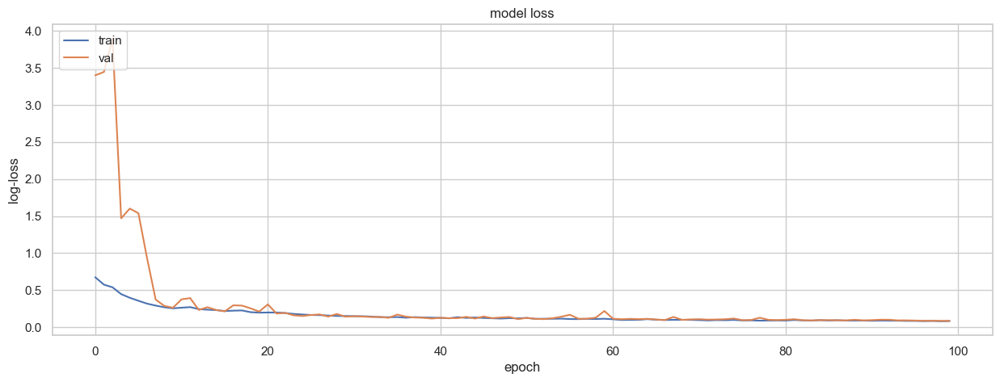

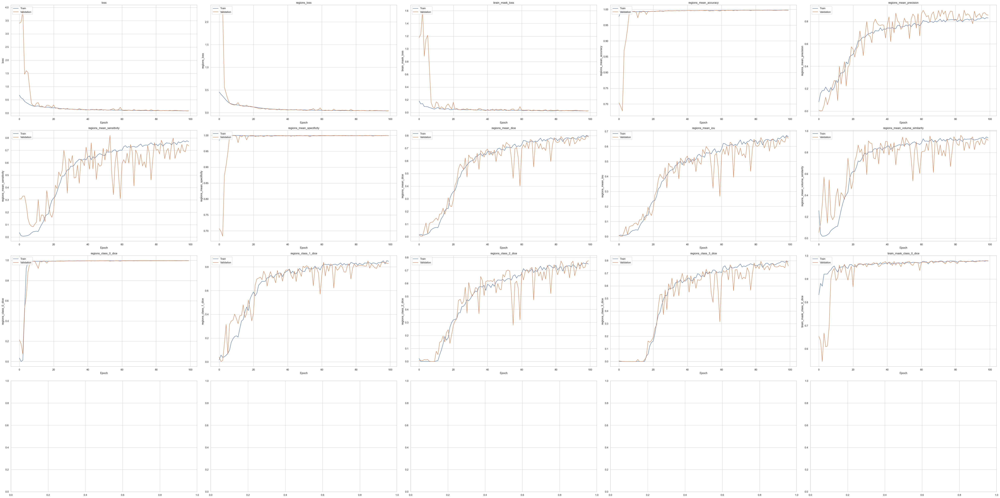

c:\Users\fmoro\SegmentationProject\SegmentationThesis\src\evaluation\inference.py:645: FutureWarning:



Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.


c:\Users\fmoro\SegmentationProject\SegmentationThesis\src\evaluation\inference.py:645: FutureWarning:



Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.


c:\Users\fmoro\SegmentationProject\SegmentationThesis\src\evaluation\inference.py:645: FutureWarning:



Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.


c:\Users\fmoro\SegmentationProject\SegmentationThesis\src\evaluation\inference.py:645: FutureWarning:



Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.


c:\Users\fmoro\SegmentationProject\S

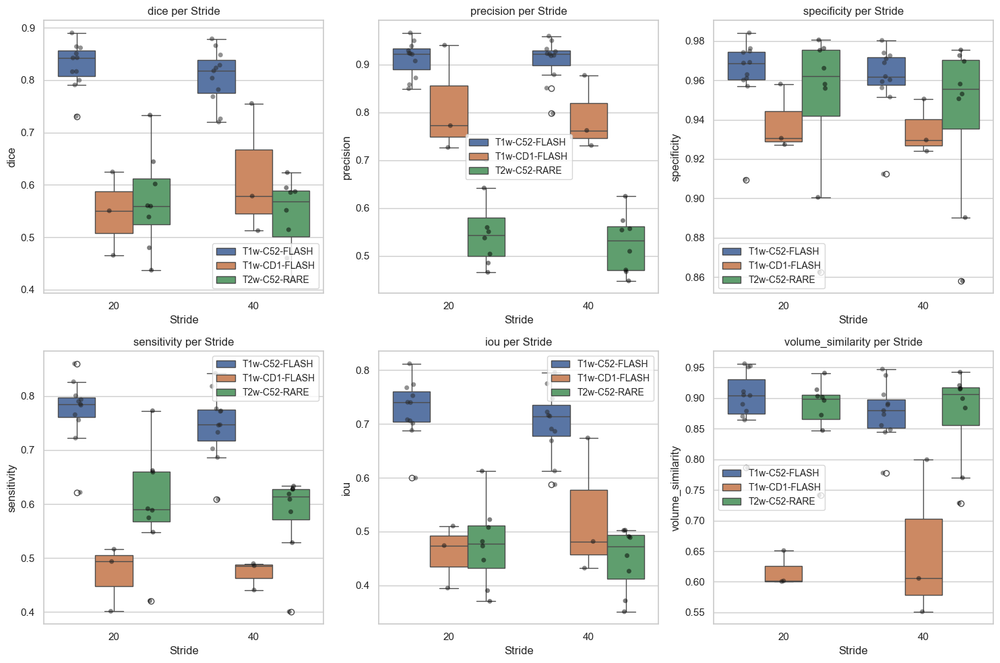

c:\Users\fmoro\SegmentationProject\SegmentationThesis\src\evaluation\inference.py:645: FutureWarning:



Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.


c:\Users\fmoro\SegmentationProject\SegmentationThesis\src\evaluation\inference.py:645: FutureWarning:



Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.


c:\Users\fmoro\SegmentationProject\SegmentationThesis\src\evaluation\inference.py:645: FutureWarning:



Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.


c:\Users\fmoro\SegmentationProject\SegmentationThesis\src\evaluation\inference.py:645: FutureWarning:



Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.


c:\Users\fmoro\SegmentationProject\S

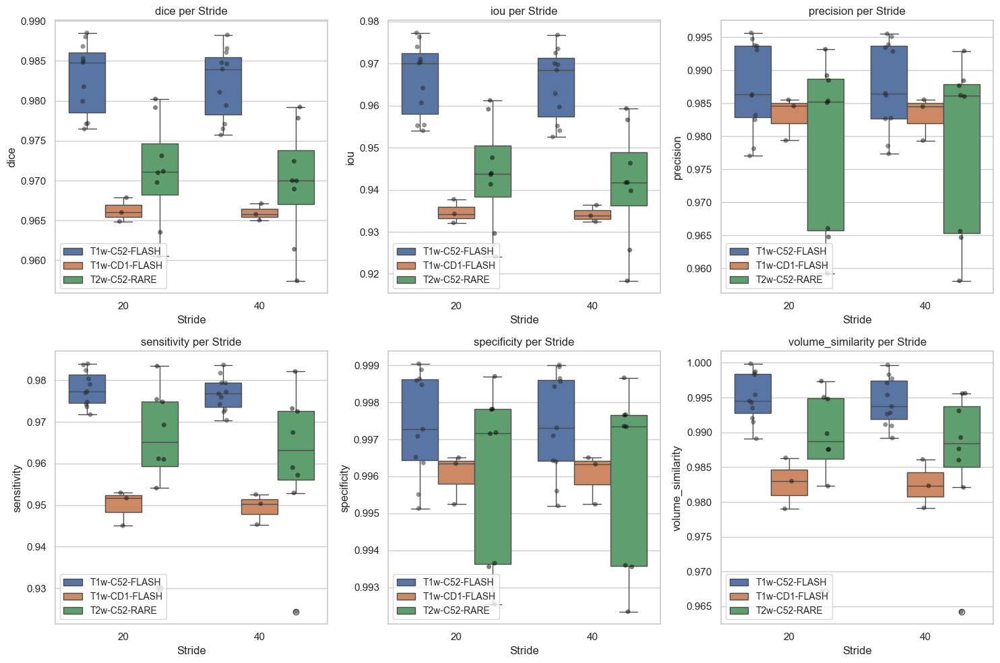

In [12]:
fve_callbacks = [fve_callback_regions, fve_callback_skullstrip]

# Call k_fold_loop to start the training
history_k, fve_evaluations = k_fold_loop(model_callback, fve_callbacks, config, train_and_test_ids, metrics)

Best metrics for each fold
|- Fold 0 -----------------
|- Best epoch: 96
|- val_regions_mean_accuracy: 0.9977063536643982
|- val_regions_mean_precision: 0.839817225933075
|- val_regions_mean_sensitivity: 0.7379903197288513
|- val_regions_mean_specificity: 0.9990919828414917
|- val_regions_mean_dice: 0.7795795202255249
|- val_regions_mean_iou: 0.6432849168777466
|- val_regions_mean_volume_similarity: 0.9170156717300415
|- val_regions_class_0_dice: 0.9968500137329102
|- val_regions_class_1_dice: 0.8453088402748108
|- val_regions_class_2_dice: 0.7332479357719421
|- val_regions_class_3_dice: 0.7601816058158875
|- Fold 1 -----------------
|- Best epoch: 94
|- val_regions_mean_accuracy: 0.9975824952125549
|- val_regions_mean_precision: 0.8880484104156494
|- val_regions_mean_sensitivity: 0.725300669670105
|- val_regions_mean_specificity: 0.9991136789321899
|- val_regions_mean_dice: 0.794197142124176
|- val_regions_mean_iou: 0.6623951196670532
|- val_regions_mean_volume_similarity: 0.894320607

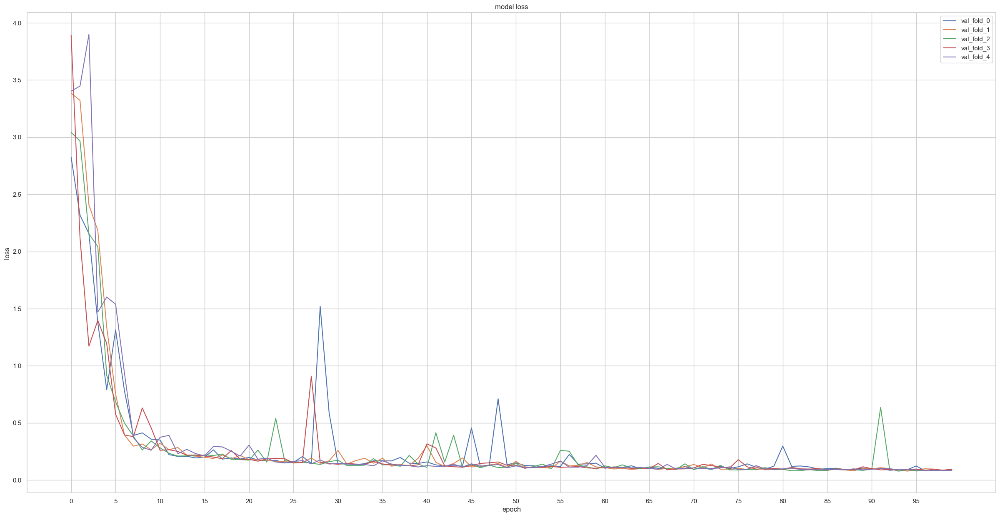

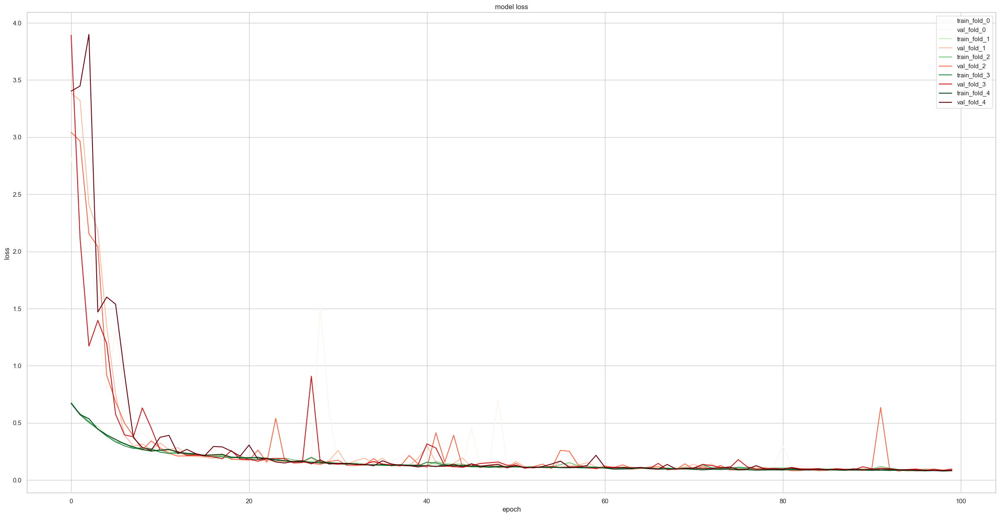

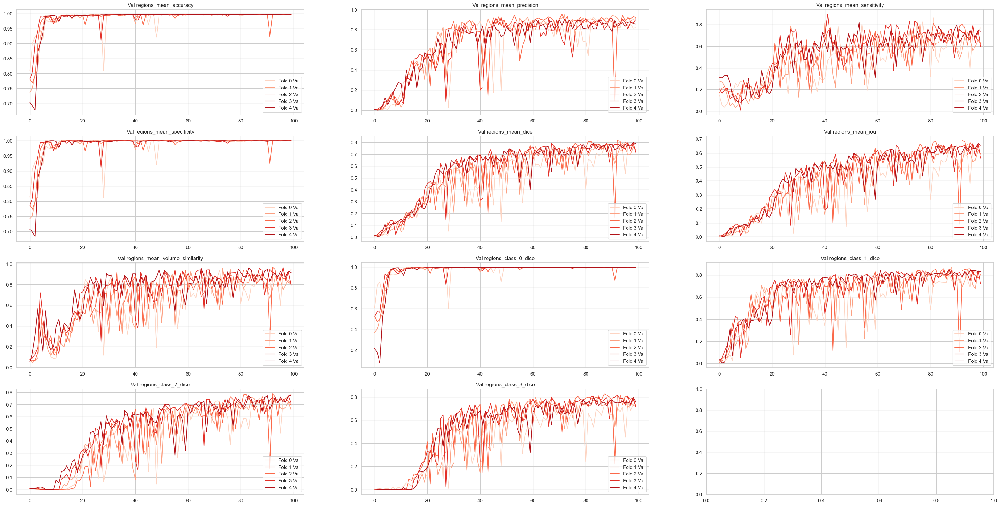

In [13]:
# Create a dictionary to store the results
import evaluation.k_fold
importlib.reload(evaluation.k_fold)
from evaluation.k_fold import summarize_and_plot_results, save_config

metrics_regions_dic = {'regions_'+metric.__name__: [] for metric in metrics['regions']}
metrics_brain_mask_dic = {'brain_mask_class_0_dice': []}
metrics_dicts = [metrics_regions_dic, metrics_brain_mask_dic]
names = ['regions', 'brain_mask']

for i, fve_callback in enumerate(fve_callbacks):
    summarize_and_plot_results(history_k, fve_evaluations[i], config, metrics_dicts[i], names[i])
    
save_config(config)